## Import 

### pytorch

In [1]:
from numpy import random
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import torch.nn.functional as F
from functools import reduce
from operator import add, itemgetter
import torch
import torch.nn as nn
from torch.nn import (Conv2d, BatchNorm2d, MaxPool2d, AvgPool2d, ReLU, BatchNorm1d, Linear, CrossEntropyLoss,ConstantPad2d)
from torch.nn import Module
from torchvision import transforms
from tqdm import tqdm
import numpy as np
import nibabel as nib
from torch.utils.data import Dataset

import torch
from torch._six import string_classes, int_classes

from torch.utils.data import DataLoader
from torch import autograd, optim
import torch.backends.cudnn as cudnn


import torchvision.utils as vutils
from PIL import Image


### Useful Francesco's code

In [2]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function


import numpy as np
import math

#import keras
#from keras.models import Sequential
#from keras.layers import Dense, Dropout, Flatten, BatchNormalization
#from keras.layers import Conv2D, MaxPooling2D, concatenate, Input
#from keras.losses import mean_squared_error
#from keras import backend as K
#from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler, EarlyStopping, TensorBoard
#from keras.models import Model
#from keras.preprocessing.image import load_img, img_to_array, array_to_img, ImageDataGenerator


import os
import subprocess
import numpy as np

import sys

#sys.path.append('spinalcordtoolbox/scripts/')
#sys.path.append('/home/fperdigon_local/spinalcordtoolbox/scripts/')
#from spinalcordtoolbox.image import Image
sys.path.insert(0, '/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/sct/sct/')
print(sys.path)
import spinalcordtoolbox.image as Image

from skimage.morphology import square
from skimage.morphology import dilation
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import time
import pickle

size_val = 512
testing_image =[]

['/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/sct/sct/', '/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/deep_VL_2019', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python37.zip', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/lib-dynload', '', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/IPython/extensions', '/home/GRAMES.POLYMTL.CA/luroub/.ipython']


In [ ]:
t=[4,5,6,7]
t[0:3]

## code from francesco to load the data into an array

In [3]:
# !/usr/bin/env python
#
# Prepare an homogeneous Dataset for training
# This code contains useful functions to create
# a dataset from the nifti images and labels
#
# author: Francisco Perdigon Romero
# Neuropoly



Poly_DataSet_path = '../Database/PolyDatabase_2/'
labels_orginal_fname = 'labels_disc_all_posterior.nii.gz'
labels_resampled_fname = 'labels_disc_all_posterior_r.nii.gz'
labels_dilated_fname = 'labels_disc_all_posterior_dilated.nii.gz'
sagittal_flatten_fname = 'flatten_sag.nii.gz'


IVSpace_order = ['APMJ', 'PMJ', 'Top C1', 'C2-C3', 'C3-C4', 'C4-C5', 'C5-C6', 'C6-C7', 'C7-T1',
             'T1-T2', 'T2-T3', 'T3-T4', 'T4-T5', 'T5-T6', 'T6-T7',
             'T7-T8', 'T8-T9', 'T10-T11', 'T11-T12', 'T12-L1',
             'L1-L2', 'L2-L3', 'L3-L4', 'L4-L5', 'L5-S1',
             'S1-S2', 'S2-S3', 'S3-S4', 'S4-S5']


def get_dataset_folders(Poly_DataSet_path = Poly_DataSet_path):
    '''
    Returns the path of where the NIFI files are
    It is assumed that the files are in the form duke: sct_testing/large/
    :param Poly_DataSet_path:
    :return:
    '''

    lf = os.listdir(Poly_DataSet_path)
    folders_list_nifti = []

    for f in lf:
        if f.startswith('.') == False and f.startswith('_') == False:
            for sf in os.listdir(Poly_DataSet_path + '/' + f):
                if sf.startswith('.') == False:
                    folders_list_nifti.append(Poly_DataSet_path + '/' + f + '/' + sf)
    return folders_list_nifti

def load_NIFTI_images_list_from_test_file(text_fname):
    '''
    Returns in a python list the files that are in a text file.
    The existence of the files is checked, if the files do not exist
    they are not included in the returned list
    :param text_fname: file path, the file contains a list of paths of images
    :return img_fname_list:
    '''
    file = open(text_fname, 'r')
    fileslist = file.readlines()
    file.close()
    img_fname_list = []
    for i in range(len(fileslist)):
        fileslist[i] = str.split(fileslist[i], '\n')[0]
        if os.path.exists(fileslist[i]):
            img_fname_list.append(fileslist[i])
        else:
            print('The file does not exist')
            print(fileslist[i])
    return img_fname_list

def save_NIFTI_images_list_to_text_file(fname_list, text_fname):

    file = open(text_fname, 'w')
    for i in range(len(fname_list)):
        file.write(fname_list[i] + '\n')
    file.close()

def get_parent_folder_from_NIFTI_file(fileslist):
    '''
    This function returns a list of the parent folder of the NIFTI files
    :param fileslist:
    :return:
    '''
    if type(fileslist) != list:
        fileslist = [fileslist]

    main_folders = []
    for f in fileslist:
        main_folders.append(os.path.dirname(os.path.abspath(f)))
    return main_folders

def get_NIFTI_type(folder_list, NIFTI_type):
    '''
    This function returns the existing elements of the
    NIFTI file type (NIFTI_type) contained in the folders (folder_list) \n
    :param folder_list: list of folders \n
    :param NIFTI_type: int \n
                       0 images in original resolution (ex: t2.nii.gz) \n
                       1 images resampled (ex: t2_r.nii.gz) \n
                       2 images sagittal flatten (ex: flatten_sag.nii.gz) \n
                       3 labels in original resolution (ex: labels_disc_all_posterior.nii.gz)\n
                       4 labels resampled (ex: labels_disc_all_posterior_r.nii.gz) \n
    :return:
    '''
    global sagittal_flatten_fname
    global labels_orginal_fname
    global labels_resampled_fname

    if type(folder_list) != list:
        folder_list = [folder_list]

    images_list_out = []
    labels_list_out = []
    sagittal_flatten_list_out = []
    out = []

    for f in folder_list:
        if NIFTI_type == 0: # 0 images in original resolution
            im_fname = f + '/' + str.split(f, '/')[-1] + '.nii.gz'
            if os.path.exists(im_fname):
                images_list_out.append(im_fname)
            else:
                print('ERROR, the file does not exist')
                print(im_fname)

        if NIFTI_type == 1: # 1 images resampled
            im_fname = f + '/' + str.split(f, '/')[-1] + '_r.nii.gz'
            if os.path.exists(im_fname):
                images_list_out.append(im_fname)
            else:
                print('ERROR, the file does not exist')
                print(im_fname)

        if NIFTI_type == 2: # 2 images sagittal flatten
            im_fname = f + '/' + sagittal_flatten_fname
            if os.path.exists(im_fname):
                images_list_out.append(im_fname)
            else:
                print('ERROR, the file does not exist')
                print(im_fname)

        if NIFTI_type == 3: # 3 labels in original resolution
            im_fname = f + '/' + str.split(f, '/')[-1] + '.nii.gz'
            lb_fname = f + '/' + labels_orginal_fname

            if os.path.exists(im_fname) and os.path.exists(lb_fname):
                images_list_out.append(im_fname)
                labels_list_out.append(lb_fname)
            else:
                print('ERROR, one of these files does not exist')
                print(im_fname)
                print(lb_fname)

        if NIFTI_type == 4:  # 4 labels resampled
            im_fname = f + '/' + str.split(f, '/')[-1] + '_r.nii.gz'
            lb_fname = f + '/' + labels_resampled_fname
            sf_fname = f + '/' + sagittal_flatten_fname

            if os.path.exists(im_fname) and os.path.exists(lb_fname):
                images_list_out.append(im_fname)
                labels_list_out.append(lb_fname)
                if os.path.exists(sf_fname):
                    sagittal_flatten_list_out.append(sf_fname)
                else:
                    sagittal_flatten_list_out.append('')
            else:
                print('ERROR, one of these files does not exist')
                print(im_fname)
                print(lb_fname)



        if NIFTI_type < 3:
            out = images_list_out
        elif NIFTI_type == 3:
            out = [images_list_out, labels_list_out]
        elif NIFTI_type == 4:
            out = [images_list_out, labels_list_out, sagittal_flatten_list_out]

    return out

def resample_nifti_images_SCT(files_list_nifti_img, resolution_mm ='1x1x1'):
    if type(files_list_nifti_img) != list:
        files_list_nifti_img = [files_list_nifti_img]
    for i in range(len(files_list_nifti_img)):
        print('Resizing subset %i of %i' %(i+1, len(files_list_nifti_img)))
        p = subprocess.Popen(['sct_resample', '-i', files_list_nifti_img[i], '-mm', resolution_mm, '-x', 'linear'],
                             stdout=subprocess.PIPE)
        p.wait()
    print('Done, %i images where resized' %(len(files_list_nifti_img)))

def dilate_labels_size(lb_fname_list):
    '''
    These function dilate the labels becauste some labels can be lost during the resample proccess
    :param lb_fname:
    :return:
    '''

    if type(lb_fname_list) != list:
        lb_fname_list = [lb_fname_list]

    for i in range(len(lb_fname_list)):
        print('Processing %i of %i' % (i + 1, len(lb_fname_list)))
        im_label = Image(lb_fname_list[i])
        im_label_original_orientation = im_label.orientation
        im_label.change_orientation(orientation='SAL')
        im_label.data = im_label.data.astype(int)

        im_label_dilated_data = np.zeros(im_label.data.shape, dtype=im_label.data.dtype)

        for LR_axis in range(im_label.data.shape[-1]):
            im_label_dilated_data[:, :, LR_axis] = dilation(im_label.data[:,:,LR_axis], square(5))

        im_label_dilated = im_label.copy()
        im_label_dilated.orientation = 'SAL'
        im_label_dilated.data = im_label_dilated_data
        im_label_dilated.change_orientation(orientation=im_label_original_orientation)
        lb_dilated_fname = str.split(lb_fname_list[i],'.nii.gz')[0] + '_dilated.nii.gz'
        im_label_dilated.setFileName(lb_dilated_fname)
        im_label_dilated.save()
    print ('Done, %i labels files dilated' %(len(lb_fname_list)))

def resample_nifti_labels_SCT(files_list_nifti_labels, resolution_mm ='1x1x1', dilate = True):
    global labels_dilated_fname
    global labels_resampled_fname
    if type(files_list_nifti_labels) != list:
        files_list_nifti_labels = [files_list_nifti_labels]

    for i in range(len(files_list_nifti_labels)):
        print('Resample label %i of %i' % (i + 1, len(files_list_nifti_labels)))

        if dilate: # dilate
            dilate_labels_size(files_list_nifti_labels[i])

        fn = get_parent_folder_from_NIFTI_file(files_list_nifti_labels[i])[0] + '/' + labels_dilated_fname
        fn_out = get_parent_folder_from_NIFTI_file(files_list_nifti_labels[i])[0] + '/' + labels_resampled_fname
        # resample
        p = subprocess.Popen(['sct_resample', '-i', fn, '-mm', resolution_mm, '-x', 'nn', '-o', fn_out],
                             stdout=subprocess.PIPE)
        p.wait()

        # delete dilated label file
        p = subprocess.Popen(['rm', fn],
                             stdout=subprocess.PIPE)
        p.wait()

        p = subprocess.Popen(['sct_label_utils', '-i', fn_out, '-cubic-to-point', '-o', fn_out],
                             stdout=subprocess.PIPE)
        p.wait()
    print('Done, %i labels where resized' %(len(files_list_nifti_labels)))

def set_orient_data_SCT(files_list, fov ='AIL'): #AIL

    for i in range(len(files_list)):
        print('Changing FOV subset %i of %i' % (i+1, len(files_list)))
        p = subprocess.Popen(['sct_image', '-i', files_list[i], '-setorient', fov],
                             stdout=subprocess.PIPE)
        p.wait()

    print('Done, FOV Changed for %i NIFTI files' % (len(files_list)))

def sagittal_flatten_SCT(files_list_nifti_img):

    for i in range(len(files_list_nifti_img)):
        print('Processing %i of %i' % (i+1, len(files_list_nifti_img)))

        # Get center line
        # using OptiC Method
        print('Getting centerline')
        p = subprocess.Popen(['sct_get_centerline', '-i', files_list_nifti_img[i], '-c', 't2'],
                             stdout=subprocess.PIPE)
        p.wait()
        print('Done')

        print('Doing Sagittal flatten')
        file_name_centerline = str.split(files_list_nifti_img[i], '/')[-1]
        file_name_centerline = str.split(file_name_centerline, '.nii.gz')[0] + '_centerline_optic.nii.gz'
        try:
            flatten_sagittal(files_list_nifti_img[i], file_name_centerline)
            print('Done')

        except:
            print('ERROR')
            files_list_nifti_img[i]

def flatten_sagittal(fname_im_anat, fname_centerline):
    import sys
    sys.path.append('../sct/sct/scripts/')
    from spinalcordtoolbox.image import Image
    from sct_image import get_orientation, set_orientation
    import numpy as np


    im_anat = Image(fname_im_anat)
    anat_ima_orientation_original = get_orientation_3d(im_anat)
    im_centerline = Image(fname_centerline)


    # Reorient input data into RL PA IS orientation
    im_anat.change_orientation(orientation='RPI')

    im_centerline.change_orientation(orientation='RPI')

    X = np.zeros(im_centerline.data.shape[-1], dtype=np.int16)
    Y = np.zeros(im_centerline.data.shape[-1], dtype=np.int16)
    for z_axis in range(im_centerline.data.shape[-1]):
        X[z_axis], Y[z_axis] = im_centerline.data[:, :, z_axis].nonzero()

    im_x, im_y, im_z = im_anat.data.shape

    imf_x = 2 * im_x + 1 # With these value for sure the loop will not trespass the max index

    im_flatten_sag_data = np.zeros((imf_x, im_y, im_z), dtype=im_anat.data.dtype)

    for z_axis in range(len(X)):
        x_start = int(imf_x/2) - X[z_axis]
        x_end = x_start + im_x
        im_flatten_sag_data[x_start : x_end,:,z_axis] = im_anat.data[:,:,z_axis]

    import os
    im_anat_dir = os.path.dirname(os.path.abspath(fname_im_anat))

    im_flatten_sag = im_anat.copy()
    im_flatten_sag.orientation = 'RPI'
    im_flatten_sag.data = im_flatten_sag_data
    im_flatten_sag.change_orientation(orientation=anat_ima_orientation_original)
    im_flatten_sag.setFileName(im_anat_dir + '/flatten_sag.nii.gz')
    im_flatten_sag.save()

    print('Sagittal flatten saved on: ' + im_anat_dir + '/flatten_sag.nii.gz')

def shuffle_data(img_files_list, lab_files_list):
    # Shuffle the data
    indx = range(img_files_list.__len__())
    np.random.shuffle(indx)

    # Print the indx to save for latter get the same train schema
    # print(indx)

    ifpl = []
    lfpl = []

    for i in range(len(img_files_list)):
        ifpl.append(img_files_list[indx[i]])
        lfpl.append(lab_files_list[indx[i]])
    return [ifpl, lfpl]

def viewer_images_labels(iml, lbl, check_images = False, start = 0, pause_time = 0.5, figure_block =False, labels_color = 'r'):

    fig = plt.figure()

    for i in range(start,len(iml)):

        print(str(i + 1) + '/' + str(len(iml)))
        print(iml[i])
        im = Image(iml[i])
        im.change_orientation(orientation='SAL')
        lb = get_labels_value(lbl[i])

        mid_sag_plane = im.data.shape[-1]/2
        plt.imshow(im.data[:, :, mid_sag_plane], 'gray')
        for j in range(len(lb)):
            plt.plot(lb[j][0], lb[j][1], labels_color + 'o')
            plt.text(lb[j][0] + 5, lb[j][1], str(lb[j][3]) , {'color': labels_color, 'fontsize': 12})

        plt.axis([0, im.data[:, :, mid_sag_plane].shape[1], im.data[:, :, mid_sag_plane].shape[0], 0])
        plt.pause(pause_time)

        plt.show(block=figure_block)

        if check_images == True:
            print('The image or labels are OK?(y/n)')
            input = str(raw_input('Input:'))

            if input == 'y':
                text_file_OK = open("_OK.txt", "a")
                text_file_OK.write(iml[i] + '\n')
                text_file_OK.close()
            else:
                text_file_BAD = open("_BAD.txt", "a")
                text_file_BAD.write(iml[i] + '\n')
                text_file_BAD.close()

        fig.clear()

def make_Labels_annotation_from_list(fileslist, label_fname, start = 1):
    if type(fileslist) != list:
        fileslist = [fileslist]

    for i in range(start-1, len(fileslist)):
        print('Processing %i of %i' % (i + 1, len(fileslist)))
        print(fileslist[i])


        file_dir = os.path.dirname(os.path.abspath(fileslist[i]))
        file_out = file_dir + '/' + label_fname
        p = subprocess.Popen(['sct_label_utils', '-i', fileslist[i], '-create-viewer', '50, 49, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32', '-o', file_out ],
                             stdout=subprocess.PIPE)
        p.wait()
        print('Done')

def get_Img_max_size(img_fname_list, px_max=512):

    img_fname_list_out = []

    for i in range(len(img_fname_list)):

        im = Image(img_fname_list[i])
        im.change_orientation(orientation='SAL')

        mid_sag_slice = im.data.shape[-1]/2
        mid_sag_plane = im.data[:, :, mid_sag_slice]

        print(str(i + 1) + ';' + img_fname_list[i] + ';' + str(mid_sag_plane.shape[0]) + ';' + str(mid_sag_plane.shape[1]))

        if mid_sag_plane.shape[0] <= px_max and mid_sag_plane.shape[1] <= px_max:
            img_fname_list_out.append(img_fname_list[i])

    return img_fname_list_out

def splitDataset(img_fname_list, train =60, val = 20, test = 20):
    ds_size = len(img_fname_list)
    train_ds = img_fname_list[0:int(ds_size*(train/100.0))]
    val_ds = img_fname_list[int(ds_size*(train/100.0)) : int(ds_size*(train/100.0)) + int(ds_size*(val/100.0))]
    test_ds = img_fname_list[int(ds_size*(train/100.0)) + int(ds_size*(val/100.0)) : -1 ]
    return [train_ds, val_ds, test_ds]

def get_data_containing_x_label(lbs_fname_list, label_number):

    ll = []

    for i in range(len(lbs_fname_list)):
        print('Looking for desired labels %i of %i' % (i + 1, len(lbs_fname_list)))
        lb_list = get_labels_value(lbs_fname_list[i])
        for lbs in range(len(lb_list)):
            if lb_list[lbs][3] == label_number:
                ll.append(lbs_fname_list[i])

    return ll

def get_data_containing_label_range(lbs_fname_list, label_start, label_end):
    """"
    These function search the images that contains all the labels in a range.
    For now only work on IVD labels, no APMJ(49) or PMJ(50)
    """

    ll = []

    for i in range(len(lbs_fname_list)):
        print('Looking for desired labels %i of %i' % (i + 1, len(lbs_fname_list)))
        lb_list = get_labels_value(lbs_fname_list[i])
        c = 0
        for lbs in range(len(lb_list)):
            for j in range(label_start, label_end):
                if lb_list[lbs][3] == j:
                    c = c + 1
        if c == label_end - label_start:
            ll.append(lbs_fname_list[i])

    return ll

def get_print_label_info(lbs_fname_list):

    for i in range(len(lbs_fname_list)):

        lbs_list = get_labels_value(lbs_fname_list[i])
        lb_min = 48
        lb_max = 0

        lb_50_flag = False
        lb_49_flag = False
        for ll in range(len(lbs_list)):
            for l in range(len(lbs_list)):

                if lbs_list[l][3] == 50:
                    lb_50_flag = True
                if lbs_list[l][3] == 49:
                    lb_49_flag = True
                if lbs_list[l][3] < lb_min:
                    lb_min = lbs_list[l][3]
                if lbs_list[l][3] > lb_max and lbs_list[l][3] != 50 and lbs_list[l][3] != 49:
                    lb_max = lbs_list[l][3]

        print(lbs_fname_list[i] + ';' + str(lb_min) + ';' + str(lb_max) + ';' + str(lb_50_flag) + ';' + str(lb_49_flag))


# Data Image oriented
def get_mid_sagittal_slice_2_list_of_np_array(img_NIFTI_fnames):

    if type(img_NIFTI_fnames) != list:
        img_NIFTI_fnames = [img_NIFTI_fnames]

    img_list = []
    for i in range(len(img_NIFTI_fnames)):

        print('Extracting mid sagittal plane ' + str(i + 1) + '/' + str(len(img_NIFTI_fnames)))

        im = Image(img_NIFTI_fnames[i])
        im.change_orientation(orientation='SAL')

        mid_sag_plane = im.data.shape[-1]/2
        img_list.append(im.data[:, :, mid_sag_plane])

    return img_list

def images_normalization(img_list, std = True):
    if type(img_list) != list:
        img_list = [img_list]
    img_norm_list = []
    for i in range(len(img_list)):
        #print('Normalizing ' + str(i + 1) + '/' + str(len(img_list)))
        img = img_list[i] - np.mean(img_list[i])  # zero-center
        if std:
            img_std = np.std(img)  # normalize
            epsilon = 1e-100
            img = img / (img_std + epsilon)  # epsilon is used in order to avoid by zero division
        img_norm_list.append(img)
    return img_norm_list

def add_zero_padding(img_list, x_val = 512, y_val=512):
    if type(img_list) != list:
        img_list = [img_list]
    img_zero_padding_list = []
    for i in range(len(img_list)):
        print(i)
        #print('Doing zero-padding ' + str(i + 1) + '/' + str(len(img_list)))
        img = img_list[i]
        img_tmp = np.zeros((x_val, y_val,1), dtype=np.float64)
        img_tmp[0:img.shape[0], 0:img.shape[1],0] = img
        img_zero_padding_list.append(img_tmp)

    return img_zero_padding_list

# Data Label oriented
def get_labels_value(lfp):
    " These function return a list of labels in LR FOV"
    im_label = Image(lfp)
    im_label.change_orientation(orientation='SAL')
    im_label.data = im_label.data.astype(int)

    labels = []
    label_flag = []
    for i in range(34):
        label_flag.append(False)


    for LR_axis in range(im_label.data.shape[-1]):

        Y,X = np.where(im_label.data[:,:,LR_axis] == 50)
        if X.size > 0 and Y.size > 0 and label_flag[0] == False:
            labels.append([X[0], Y[0], LR_axis, 50])
            label_flag[0] = True

        Y, X = np.where(im_label.data[:, :, LR_axis] == 49)
        if X.size > 0 and Y.size > 0 and label_flag[1] == False:
            labels.append([X[0], Y[0], LR_axis, 49])
            label_flag[1] = True

        Y, X = np.where(im_label.data[:, :, LR_axis] == 1)
        if X.size > 0 and Y.size > 0 and label_flag[2] == False:
            labels.append([X[0], Y[0], LR_axis, 1])
            label_flag[2] = True

        for i in range(3,34):
            Y, X = np.where(im_label.data[:, :, LR_axis] == i)
            if X.size > 0 and Y.size > 0 and label_flag[i] == False:
                labels.append([X[0], Y[0], LR_axis, i])
                label_flag[i] = True
    return labels

def get_labels_values_list(label_path_list):
    Labels = []
    for i in range(len(label_path_list)):
        print('Getting labels ' + str(i + 1) + '/' + str(len(label_path_list)))
        single_image_labels = get_labels_value(label_path_list[i])
        Labels.append(single_image_labels)

    return Labels

def get_x_label_coordenates_list(lbs_list, label_number):
    ll = []

    for i in range(len(lbs_list)):
        #print('Obtaining coordenates %i of %i' % (i + 1, len(lbs_list)))

        for lbs in range(len(lbs_list[i])):
            
            if lbs_list[i][lbs][3] == label_number:
                list_cood=lbs_list[i][lbs][1:3]
                
                ll.append([list_cood[1],list_cood[0]])
            #if lbs==len(lbs_list[i])-1 and 

    return ll

def get_x_label_coordenates_exist(lbs_list, label_number):
    ll = False
    for lbs in range(len(lbs_list)):
        if lbs_list[lbs][3] == label_number:
            ll = True
    return ll

def label_2_IVSpace(label_number):
    global IVSpace_order
    IVSpace_name = ''
    if label_number == 50:
        IVSpace_name = IVSpace_order[0]
    elif label_number == 49:
        IVSpace_name = IVSpace_order[1]
    elif label_number == 1:
        IVSpace_name = IVSpace_order[2]
    else:
        IVSpace_name = IVSpace_order[label_number]

    return IVSpace_name

def label2MaskMap(data, c_dx = 0, c_dy = 0, radius = 10, normalize = False):
    """
    Generate a Mask map from the coordenates
    :param M, N: dimesion of output
    :param position: position of the label
    :param radius: is the radius of the gaussian function
    :return: a MxN normalized array
    """

    # Our 2-dimensional distribution will be over variables X and Y
    (M,N)=(300,100)
    if len(data)<=2:
        data = [data]

    maskMap = []
    for index, value in enumerate(data):
        x,y = value

        #Correct the labels
        x = x + c_dx
        y = y + c_dy

        X = np.linspace(0, M - 1, M)
        Y = np.linspace(0, N - 1, N)
        X, Y = np.meshgrid(X, Y)
        # Pack X and Y into a single 3-dimensional array
        pos = np.empty(X.shape + (2,))
        pos[:, :, 0] = X
        pos[:, :, 1] = Y

        # Mean vector and covariance matrix
        mu = np.array([x, y])
        Sigma = np.array([[radius, 0], [0, radius]])

        # The distribution on the variables X, Y packed into pos.
        Z = multivariate_gaussian(pos, mu, Sigma)

        # Normalization
        if normalize:
            Z = Z * (1 / np.max(Z))
        else:
            # 8bit image values (the loss go to inf+)
            Z = Z * (1 / np.max(Z))
            Z = np.asarray(Z * 255, dtype=np.uint8)

        maskMap.append(Z)

    if len(maskMap) == 1:
        maskMap = maskMap[0]

    return np.asarray(maskMap)

def multivariate_gaussian(pos, mu, Sigma):
    """
    Return the multivariate Gaussian distribution on array.

    pos is an array constructed by packing the meshed arrays of variables
    x_1, x_2, x_3, ..., x_k into its _last_ dimension.

    """

    n = mu.shape[0]
    Sigma_det = np.linalg.det(Sigma)
    Sigma_inv = np.linalg.inv(Sigma)
    N = np.sqrt((2*np.pi)**n * Sigma_det)
    # This einsum call calculates (x-mu)T.Sigma-1.(x-mu) in a vectorized
    # way across all the input variables.
    fac = np.einsum('...k,kl,...l->...', pos-mu, Sigma_inv, pos-mu)

    return np.exp(-fac / 2) / N

#bo = get_NIFTI_images_list_from_test_file('sagittal_flatten_BAD_old.txt')
#bof = get_parent_folder_from_NIFTI_file(bo)
#bof = get_dataset_folders(Poly_DataSet_path)
#[im_org, lb_org] = get_NIFTI_type(bof, 3)
#make_Labels_annotation_from_list(im_org, labels_orginal_fname, start=1)

#resample_nifti_labels_SCT(lb_org)
#resample_nifti_labels_SCT('/Users/fperdigon_admin/Documents/PyCharm/deep_vl_LOCAL/Database/PolyDatabase_2/twh_allan_e24408/t2/' + labels_orginal_fname)
#viewer_images_labels(im_org, lb_org, check_images=True)

#[im_resampled, lb_resampled, im_sagittal] = get_NIFTI_type(bof,4)

#make_Labels_annotation_from_list(im_resampled, labels_resampled_fname, start=1)

#viewer_images_labels(im_sagittal, lb_resampled, check_images= True)

#print('')


In [4]:
def check_label(path_dataset):
    tab=[]
    t=os.listdir(path_dataset)
    for i in range (len(t)):
        path_tmp=path_dataset+t[i]+'/t2/labels_disc_all_posterior_order_r.nii.gz'
        im=nib.load(path_tmp)
        arr=np.array(im.dataobj)
        if arr.nonzero()[0][0]==np.round(arr.shape[0]/2):
            tab.append(t[i])
    return tab

In [ ]:
essai=check_label()

In [5]:
def load_Data(DataSet_path):
    size_val = 512
    fname_TXT = './fnames_less_512.txt'
    store_folder='./storage/'

    if os.path.exists(fname_TXT) == False:
        bof = get_dataset_folders(DataSet_path)
        [im_resampled, lb_resampled, im_sagittal] = get_NIFTI_type(bof, 4)
        fname_list_under_512 = get_Img_max_size(im_sagittal, px_max=size_val)
        [shuffled_img, shuffled_lbs] = shuffle_data(fname_list_under_512, fname_list_under_512)
        vlds.save_NIFTI_images_list_to_text_file(shuffled_img, fname_TXT)
    else:
        shuffled_img = load_NIFTI_images_list_from_test_file(fname_TXT)

    data_dir_list = get_parent_folder_from_NIFTI_file(shuffled_img)

    load_pkl = True

    if load_pkl == False:

        [im_resampled, lb_resampled, im_sagittal] = vlds.get_NIFTI_type(data_dir_list, 4)
        labels_fname_list = lb_resampled

        labels_fname_list = get_data_containing_label_range(labels_fname_list, start_lb,end_lb + 1)

        print('The size of the dataset is %i' % (len(labels_fname_list)))
        data_dir_list = get_parent_folder_from_NIFTI_file(labels_fname_list)
        [train_ds, val_ds, test_ds] = splitDataset(data_dir_list, train=80, val=10, test=10)
        print('The size of the training dataset is %i' % (len(train_ds)))
        print('The size of the validation dataset is %i' % (len(val_ds)))
        print('The size of the test dataset is %i' % (len(test_ds)))
        [train_im_resampled, train_lb_resampled, train_im_sagittal_flatten] = get_NIFTI_type(train_ds, 4)
        [val_im_resampled, val_lb_resampled, val_im_sagittal_flatten] = get_NIFTI_type(val_ds, 4)
        [test_im_resampled, test_lb_resampled, test_im_sagittal_flatten] = get_NIFTI_type(test_ds, 4)

        save_NIFTI_images_list_to_text_file(train_im_sagittal_flatten, store_folder + "train_set.txt")
        save_NIFTI_images_list_to_text_file(val_im_sagittal_flatten, store_folder + "val_set.txt")
        save_NIFTI_images_list_to_text_file(test_im_sagittal_flatten, store_folder + "test_set.txt")

        # Load Images and labels
        train_ds_img = get_mid_sagittal_slice_2_list_of_np_array(train_im_sagittal_flatten)
        train_ds_label = get_labels_values_list(train_lb_resampled)
        val_ds_img = get_mid_sagittal_slice_2_list_of_np_array(val_im_sagittal_flatten)
        val_ds_label = get_labels_values_list(val_lb_resampled)
        test_ds_img = get_mid_sagittal_slice_2_list_of_np_array(test_im_sagittal_flatten)
        test_ds_label = get_labels_values_list(test_lb_resampled)

        with open(store_folder + 'train_ds_img.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(train_ds_img, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'train_ds_label.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(train_ds_label, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'val_ds_img.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(val_ds_img, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'val_ds_label.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(val_ds_label, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'test_ds_img.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(test_ds_img, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'test_ds_label.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(test_ds_label, output, pickle.HIGHEST_PROTOCOL)

    else:

        with open(store_folder + 'train_ds_img.pkl', 'rb') as input:
            train_ds_img = pickle.load(input,encoding='latin1')
        with open(store_folder + 'train_ds_label.pkl', 'rb') as input:
            train_ds_label = pickle.load(input,encoding='latin1')
        with open(store_folder + 'val_ds_img.pkl', 'rb') as input:
            val_ds_img = pickle.load(input,encoding='latin1')
        with open(store_folder + 'val_ds_label.pkl', 'rb') as input:
            val_ds_label = pickle.load(input,encoding='latin1')
        with open(store_folder + 'test_ds_img.pkl', 'rb') as input:
            test_ds_img = pickle.load(input,encoding='latin1')
        with open(store_folder + 'test_ds_label.pkl', 'rb') as input:
            test_ds_label = pickle.load(input,encoding='latin1')

    # Normalize images
    train_ds_img = images_normalization(train_ds_img)
    val_ds_img = images_normalization(val_ds_img)
    test_ds_img = images_normalization(test_ds_img)

    # Zero padding
    train_ds_img = add_zero_padding(train_ds_img, x_val=size_val, y_val=size_val)
    val_ds_img = add_zero_padding(val_ds_img, x_val=size_val, y_val=size_val)
    test_ds_img = add_zero_padding(test_ds_img, x_val=size_val, y_val=size_val)

    # Convert images to np.array
    train_ds_img = np.array(train_ds_img)
    val_ds_img = np.array(val_ds_img)
    test_ds_img = np.array(test_ds_img)

    return [train_ds_img, val_ds_img, test_ds_img, train_ds_label, val_ds_label, test_ds_label]

In [6]:
def mask2label(path_label):
    a=nib.load(path_label)
    arr=np.array(a.dataobj)

    list_label_image=[]
    for i in range (len(arr.nonzero()[0])):
        x=arr.nonzero()[0][i]
        y=arr.nonzero()[1][i]
        z=arr.nonzero()[2][i]
        list_label_image.append([x,y,z,arr[x,y,z]])
    list_label_image.sort(key=lambda x: x[3])
    return(list_label_image)

def get_midNifti(path_im,ind):
    a=nib.load(path_im)
    arr=np.array(a.dataobj)
    return arr[ind,:,:]

In [7]:
def load_Data_lucas(DataSet_path):
    size_val = 512
    ds_image=[]
    ds_label=[]
    list_dir=os.listdir(DataSet_path)
    list_dir.sort()
    if '.DS_Store' in list_dir:
        list_dir.remove('.DS_Store')
    a=len(list_dir)
    for i in range (a):
        path_tmp=DataSet_path+list_dir[i]+'/t2/'
        tmp_label=mask2label(path_tmp+'label_str_clean.nii')
        print(path_tmp)
        index_mid=tmp_label[0][0]
        print(index_mid)
        mid_slice=get_midNifti(path_tmp+'t2_order_r_flatten_straight.nii.gz',index_mid)
        print(mid_slice.shape)
        if mid_slice.shape[0]>512:
            print('removed')
            pass
        elif mid_slice.shape[1]>512:
            print('removed')
            pass
        else:
            ds_image.append(mid_slice)
            ds_label.append(tmp_label)
    
    ds_image = images_normalization(ds_image)
    

    # Zero padding
    ds_image = add_zero_padding(ds_image, x_val=100, y_val=300)
    #val_ds_img = add_zero_padding(val_ds_img, x_val=size_val, y_val=size_val)
    #test_ds_img = add_zero_padding(test_ds_img, x_val=size_val, y_val=size_val)

    # Convert images to np.array
    ds_image = np.array(ds_image)
        
        
    return [ds_image,ds_label] 

In [8]:
ds=load_Data_lucas('./Database/straight/')

./Database/straight/twh_allan_e26603/t2/
24
(71, 187)
./Database/straight/twh_allan_e26840/t2/
24
(71, 192)
./Database/straight/twh_allan_e26841/t2/
24
(71, 197)
./Database/straight/twh_allan_e26907/t2/
24
(71, 190)
./Database/straight/twh_allan_e27115/t2/
24
(71, 185)
./Database/straight/twh_allan_e27116/t2/
24
(71, 192)
./Database/straight/twh_allan_e27342/t2/
24
(71, 171)
./Database/straight/twh_allan_e27715/t2/
24
(71, 185)
./Database/straight/twh_allan_e27871/t2/
24
(71, 198)
./Database/straight/twh_allan_e28022/t2/
24
(71, 188)
./Database/straight/twh_allan_e31412/t2/
24
(71, 191)
./Database/straight/twh_allan_e31494/t2/
24
(71, 191)
./Database/straight/ucl_2017-ciccarelli_B0034312-2011-01247/t2/
17
(71, 184)
./Database/straight/ucl_2017-ciccarelli_B0185306-2013-02676/t2/
17
(71, 182)
./Database/straight/ucl_2017-ciccarelli_B0319395-2012-01905/t2/
17
(71, 185)
./Database/straight/ucl_2017-ciccarelli_B0559937-2012-01651/t2/
17
(71, 177)
./Database/straight/ucl_2017-ciccarelli_B088

## Modified francesco's code

Useful to extract patches and load them into an array. The array will then be fed to the dataloader (patch_exctracting function ). I added a second code which extract groundtruth on the whole image (extract_groundtruth fn)

In [9]:
def patch_extracting(DataSet, start_lb, end_lb, train = True, test = False):
   

    [train_ds_img,  train_ds_label] = DataSet

    global testing_image
    testing_image = train_ds_img[0]

    epochs = 30
    batch_size = 10

    # Selecting only the train images that contatins the end label
    # in these case 15 --> from C2-C3 to T7-T8 disc
    # remember that with these method big amount of training images will be descarted

    tmp_train_labels = []
    tmp_train_img = []
    label_number = 10

    for lbs in range(len(train_ds_label)):
         if get_x_label_coordenates_exist(train_ds_label[lbs], label_number):
                tmp_train_img.append(train_ds_img[lbs])
                tmp_train_labels.append(train_ds_label[lbs])

    train_ds_img = np.array(tmp_train_img)
    train_ds_label = tmp_train_labels
    print("===== DETECTED " + str(train_ds_img.shape[0]) + " images that contains label no. " + str(label_number) + " =====")

    # Now make the trining datases using only the subset with that contain the "label_number" label
    print("Extracting patches")
    tmp_train_patch = []
    tmp_train_mask_patch = []
    for lbn in range(4, label_number):
    #for lbn in [label_number-1]:
    #for lbn in [3,label_number]:
        train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,lbn)
        train_lbs_tmp = np.array(train_lbs_tmp)

        #train_lbs_tmp_mask = label2MaskMap(train_lbs_tmp, radius = 20, normalize = True)
        train_lbs_tmp_mask=full[1]
        for i in range(train_ds_img.shape[0]):

            train_patch = []
            train_mask_patch = []
            train_patch_negative = []
            train_mask_patch_negative = []

            # Make patch
            dx = 35
            dy = 20

            x = train_lbs_tmp[i,0]
            y = train_lbs_tmp[i,1]
            org_shape =  train_ds_img[i, y - dy : y + dy, x-dx :x + dx , 0].shape
            if org_shape == (2 * dy,2 * dx):
                train_patch.append(normalize(train_ds_img[i, y - dy : y + dy, x - dx : x + dx, 0]))
                train_mask_patch.append(train_lbs_tmp_mask[i, y - dy : y + dy, x - dx : x + dx])

            # generate negative patch for training
           # import random
          #  random_num = random.randint(0,1)
          #  if random_num == 0: # left side of IVD selected randomly
          #      if x>dx:
          #          xr = random.randint(dx+1,x)
           #         org_shape =  train_ds_img[i, y - dy : y + dy, xr - dx : xr + dx, 0].shape
           #         if org_shape == (2 * dy,2 * dx):
                       # train_patch_negative.append(train_ds_img[i, y - dy : y + dy, xr - dx : xr + dx, 0])
                       # train_mask_patch_negative.append(train_lbs_tmp_mask[i, y - dy : y + dy, xr - dx : xr + dx])
           #     else:
           #         pass
          #  else: # right side of IVD selected randomly
          #      xr = random.randint(x + dx + 10, x + dx + 30)
          #      org_shape =  train_ds_img[i, y - dy : y + dy, xr - dx : xr + dx, 0].shape
          #      if org_shape == (2 * dy,2 * dx):
          #          train_patch_negative.append(train_ds_img[i, y - dy : y + dy, xr - dx : xr + dx, 0])
          #          train_mask_patch_negative.append(train_lbs_tmp_mask[i, y - dy : y + dy, xr - dx : xr + dx])

            # add negative patch to the traiig list
           # random_num = random.randint(0,100)
           # if random_num < 60: #If do not work go to 50 ;)
            #    train_patch.extend(train_patch_negative)
           #     train_mask_patch.extend(train_mask_patch_negative)

            # getting the patch for all IVD
            tmp_train_patch.extend(train_patch)
            tmp_train_mask_patch.extend(train_mask_patch)


    train_patch = np.array(tmp_train_patch)
    train_mask_patch = np.array(tmp_train_mask_patch)
    train_patch = np.expand_dims(train_patch, axis=-1)
    print(train_patch.shape)
    #train_mask_patch = np.expand_dims(train_mask_patch, axis=-1)
    return [train_patch,train_mask_patch,train_lbs_tmp_mask]

In [10]:
def extract_groundtruth(DataSet, start_lb, end_lb, label_number,train = True, test = False,):
    
   

    [train_ds_img, train_ds_label] = DataSet

    global testing_image
    testing_image = train_ds_img[0]

    epochs = 30
    batch_size = 10

    # Selecting only the train images that contatins the end label
    # in these case 15 --> from C2-C3 to T7-T8 disc
    # remember that with these method big amount of training images will be descarted

    tmp_train_labels = []
    tmp_train_img = []
    

    for lbs in range(len(train_ds_label)):
         if get_x_label_coordenates_exist(train_ds_label[lbs], label_number):
                tmp_train_img.append(train_ds_img[lbs])
                tmp_train_labels.append(train_ds_label[lbs])

    train_ds_img = np.array(tmp_train_img)
    train_ds_label = tmp_train_labels
    print("===== DETECTED " + str(train_ds_img.shape[0]) + " images that contains label no. " + str(label_number) + " =====")
    train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,4)
    train_lbs_tmp = np.array(train_lbs_tmp)

    final= label2MaskMap(train_lbs_tmp, radius = 10, normalize = True)
        # Now make the trining datases using only the subset with that contain the "label_number" label
    for lbn in range(5, label_number):
        #for lbn in [label_number-1]:
        #for lbn in [3,label_number]:
        train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,lbn)
        train_lbs_tmp = np.array(train_lbs_tmp)

        train_lbs_tmp_mask = label2MaskMap(train_lbs_tmp, radius = 10, normalize = True)
        final=np.add(final,train_lbs_tmp_mask)
        if lbn ==label_number :
            for i in range (len(train_lbs_tmp)):
                train_ds_image[i][:,train_lbs_tmp[i][2]:]=0
        
    final = np.expand_dims(final, axis=-1)
    print(final.shape)
    train_ds_img= np.reshape(train_ds_img,(len(train_ds_img),100,300))
    for i in range (len(train_ds_img)):
        train_ds_img[i]=image_clahe=skimage.exposure.equalize_adapthist(normalize(train_ds_img[i]), kernel_size=None, clip_limit=0.02)
    train_ds_img=np.expand_dims(train_ds_img, axis=-1)
    return [train_ds_img,final]

In [11]:
get_x_label_coordenates_list(ds[3],5)

IndexError: list index out of range

In [11]:
def extract_groundtruth(DataSet, start_lb, end_lb, label_number,train = True, test = False,):
    
   

    [train_ds_img, train_ds_label] = DataSet

    global testing_image
    testing_image = train_ds_img[-1]

    epochs = 30
    batch_size = 10

    # Selecting only the train images that contatins the end label
    # in these case 15 --> from C2-C3 to T7-T8 disc
    # remember that with these method big amount of training images will be descarted

    tmp_train_labels = []
    tmp_train_img = []
    

    for lbs in range(len(train_ds_label)):
         if get_x_label_coordenates_exist(train_ds_label[lbs], label_number):
                tmp_train_img.append(train_ds_img[lbs])
                tmp_train_labels.append(train_ds_label[lbs])

    train_ds_img = np.array(tmp_train_img)
    train_ds_label = tmp_train_labels
    #print(len(train_ds_label))
    print("===== DETECTED " + str(train_ds_img.shape[0]) + " images that contains label no. " + str(label_number) + " =====")
    train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,3)
    train_lbs_tmp = np.array(train_lbs_tmp)
    #print(train_lbs_tmp.shape)

    final= label2MaskMap(train_lbs_tmp, radius = 20, normalize = True)
        # Now make the trining datases using only the subset with that contain the "label_number" label
    for lbn in range(4, label_number):
        #for lbn in [label_number-1]:
        #for lbn in [3,label_number]:
        train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,lbn)
        train_lbs_tmp = np.array(train_lbs_tmp)

        train_lbs_tmp_mask = label2MaskMap(train_lbs_tmp, radius = 20, normalize = True)
        for i in range (len(train_lbs_tmp_mask)):
            train_lbs_tmp_mask[i]=normalize(train_lbs_tmp_mask[i])
            #print(train_lbs_tmp_mask[i].max())
            #print(final[i].max())
            
            for w in range (100):
                for h in range(300):
                    final[i][w,h]=max(final[i][w,h],train_lbs_tmp_mask[i][w,h])
    train_ds_img= np.reshape(train_ds_img,(len(train_ds_img),100,300))
    #for i in range (len(train_ds_img)):
        #train_ds_img[i]=skimage.exposure.equalize_adapthist(normalize(train_ds_img[i]), kernel_size=None, clip_limit=0.02)
    final = np.expand_dims(final, axis=-1)
    print(final.shape)
    
    train_ds_img=np.expand_dims(train_ds_img, axis=-1)
    return [train_ds_img,final]

## Pytorch code for loader ,network and loss

In [12]:
class fcn_vl_v3(Module):
    def __init__(self, drop_rate=0.4, bn_momentum=0.1):
        super(fcn_vl_v3, self).__init__()

        fn_L1 = 32
        self.L1_DCov_1 = Conv2d(1,fn_L1, kernel_size=5,
                                padding=(2,2)
                       )
        self.L1_DCov_2 = Conv2d(1,fn_L1, kernel_size=10
                               
                   
                       )
        self.L1_DCov_3 = Conv2d(1,fn_L1, kernel_size=10,
                       dilation=2,padding=(9,9)
                 
                       )
        self.L1_DCov_4 = Conv2d(1,fn_L1, kernel_size=10,
                       dilation=3
                   
                       )
        self.L1_DCov_5 = Conv2d(1,fn_L1, kernel_size=10,
                       dilation=4,padding=(18,18)
               
                       )
        

        self.L1_concat_conv = Conv2d(160,32, kernel_size=3,padding=(1,1))

    #L1_concat = Dropout(0.5)(L1_concat)

        fn_L2 = 32
        self.L2_DCov_1 = Conv2d(32,fn_L2, kernel_size=3,padding=(1,1))
        
        self.L2_DCov_2 = Conv2d(32,fn_L2, kernel_size=5,padding=(2,2))
        
        self.L2_DCov_3 = Conv2d(32,fn_L2, kernel_size=5,dilation=2, padding=(4,4))
        
        self.L2_DCov_4 = Conv2d(32,fn_L2, kernel_size=5,dilation=3, padding=(6,6))
        
        self.L2_DCov_5 = Conv2d(32,fn_L2, kernel_size=10,dilation=3 )


        self.L2_concat_conv = Conv2d(160,32, kernel_size=3,padding=(1,1))

    #L2_concat = Dropout(0.5)(L2_concat)

        fn_L3 = 32
        self.L3_DCov_1 = Conv2d(32,fn_L3, kernel_size=3,padding=(1,1))
        
        self.L3_DCov_2 = Conv2d(32,fn_L3, kernel_size=5,padding=(2,2))
        
        self.L3_DCov_3 = Conv2d(32,fn_L3, kernel_size=5,dilation=2, padding=(4,4))
        
        self.L3_DCov_4 = Conv2d(32,fn_L3, kernel_size=5,dilation=3, padding=(6,6))
        
        self.L3_DCov_5 = Conv2d(32,fn_L3, kernel_size=10,dilation=3)
       

        self.L4 = Conv2d(160,32, kernel_size=3,padding=(1,1))

    #L4 = Dropout(0.5)(L4)

        self.predictions = Conv2d(32,1, kernel_size=3,stride=1,
                         padding=(1,1)) #test sigmoid
        #self.coord=nn.Linear(1101128,4)
        ##extrapadding needed
        self.padk10d3=ConstantPad2d((14,13,14,13), 0)
        self.padk10d1=ConstantPad2d((4,5,4,5), 0)
        
        self.dropout=nn.Dropout2d(p=0.2)
        
        

    def forward(self, x):
        x1 = self.L1_DCov_1(x)
        x1 = F.relu(x1)
                      
        x2 = self.padk10d1(self.L1_DCov_2(x))
        x2=F.relu(x2)
        

        x3 = self.L1_DCov_3(x)
        x3 = F.relu(x3)
        
        
        x4 = self.padk10d3(self.L1_DCov_4(x))
        x4=F.relu(x4)

        x5 = self.L1_DCov_5(x)
        x5 = F.relu(x5)
      
        x6 = torch.cat((x1,x2,x3,x4,x5),dim=1)
    
        # end of L1 part
        x7 = self.L1_concat_conv(x6)
        
        x7=F.relu(x7)
        x7=self.dropout(x7)

        # l2 part
        x8 = self.L2_DCov_1(x7)
        x8 = F.relu(x8)
        
        x9 = self.L2_DCov_2(x7)
        
        x9=F.relu(x9)
        
        x10 = self.L2_DCov_3(x7)
        
        x10=F.relu(x10)
        
        x11= self.L2_DCov_4(x7)
        
        x11=F.relu(x11)
        
        x12= self.padk10d3(self.L2_DCov_5(x7))
       
        x12=F.relu(x12)
       
        x13=torch.cat((x8,x9,x10,x11,x12),dim=1)
        x13=self.dropout(x13)
        #end of l2 
        x14=self.L2_concat_conv(x13)
        x14=F.relu(x14)

        #L3 part
        x15 = self.L3_DCov_1(x14)
        x15=F.relu(x15)
        
        x16 = self.L3_DCov_2(x14)
        
        x16=F.relu(x16)
        
        x17 = self.L3_DCov_3(x14)
       
        x17=F.relu(x17)
        
        x18= self.L3_DCov_4(x14)
       
        x18=F.relu(x18)
        
        x19= self.padk10d3(self.L3_DCov_5(x14))
        
        x19=F.relu(x19)
        
        x20=torch.cat((x15,x16,x17,x18,x19),dim=1)
        #end of l2 
        x21=self.L4(x20)
        x21=self.dropout(x21)

        preds=self.predictions(x21)
        
       
        preds=F.relu(preds)

        return preds

In [13]:
from __future__ import division

import math
import random

import numpy as np
import torch
from numpy import linalg

try:
    import accimage
except ImportError:
    accimage = None
import numbers
from scipy import misc, ndimage
import collections
from torchvision import transforms


def _is_numpy_image(img):
    return isinstance(img, np.ndarray)


def crop(pic, i, j, h, w):
    if not _is_numpy_image(pic):
        raise TypeError('img should be Numpy Image. Got {}'.format(type(pic)))

    return pic[i:i + h, j:j + w, :]


class BilateralFilter(object):
    def __init__(self, sigma_s=0.05, sigma_r=0.6, n_iter=5):
        self.sigma_s = sigma_s
        self.sigma_r = sigma_r
        self.n_iter = n_iter

    def __call__(self, pic):
        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make them 3
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)

        pic = self.bilateral(pic, self.sigma_s, self.sigma_r, self.n_iter)
        return pic

    def bilateral(self, img, sigma_s, sigma_r, num_iterations, J=None):
        if img.ndim == 3:
            img = img.copy()
        else:
            h, w = img.shape
            img = img.reshape((h, w, 1))

        if J is None:
            J = img

        if J.ndim == 2:
            h, w = J.shape
            J = np.reshape(J, (h, w, 1))

        h, w, num_channels = J.shape

        dIcdx = np.diff(J, n=1, axis=1)
        dIcdy = np.diff(J, n=1, axis=0)

        dIdx = np.zeros((h, w))
        dIdy = np.zeros((h, w))

        for c in range(num_channels):
            dIdx[:, 1:] = dIdx[:, 1:] + np.abs(dIcdx[:, :, c])
            dIdy[1:, :] = dIdy[1:, :] + np.abs(dIcdy[:, :, c])

        dHdx = (1.0 + sigma_s / sigma_r * dIdx)
        dVdy = (1.0 + sigma_s / sigma_r * dIdy)

        dVdy = dVdy.T

        N = num_iterations
        F = img.copy()

        sigma_H = sigma_s

        for i in range(num_iterations):
            sigma_H_i = sigma_H * math.sqrt(3.0) * (2.0 ** (N - (i + 1))) / math.sqrt(4.0 ** N - 1.0)

            F = self.rec_filter_horizontal(F, dHdx, sigma_H_i)
            F = np.swapaxes(F, 0, 1)
            F = self.rec_filter_horizontal(F, dVdy, sigma_H_i)
            F = np.swapaxes(F, 0, 1)

        return F

    @staticmethod
    def rec_filter_horizontal(img, D, sigma):
        a = math.exp(-math.sqrt(2.0) / sigma)

        F = img.copy()
        V = np.power(a, D)

        h, w, num_channels = img.shape

        for i in range(1, w):
            for c in range(num_channels):
                F[:, i, c] = F[:, i, c] + V[:, i] * (F[:, i - 1, c] - F[:, i, c])

        for i in range(w - 2, -1, -1):
            for c in range(num_channels):
                F[:, i, c] = F[:, i, c] + V[:, i + 1] * (F[:, i + 1, c] - F[:, i, c])

        return F


class MedianFilter(object):
    def __init__(self, size):
        self.size = size

    def __call__(self, pic):

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make them 3
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)

        pic = ndimage.median_filter(pic, size=self.size)
        return pic


class RotateImage(object):
    def __init__(self, angles):
        if isinstance(angles, tuple):
            assert len(angles) == 2, \
                'angles should be a list with the lower and upper bounds to sample the angle or a number'
            self.angles = np.float32(np.random.uniform(*angles))
        else:
            self.angles = angles

    def __call__(self, pic):
        from skimage.transform import rotate

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        rot = pic.copy()
        for index in range(3):
            channel = rot[index, :, :]
            channel = rotate(channel, self.angles, resize=False, preserve_range=True)
            rot[index, :, :] = channel
        return np.float32(rot)

    def test(self):

        from matplotlib import pyplot as plt
        pic = np.zeros((3, 10, 10))
        pic[:, 3:6, :] = 1

        rot = self(pic)
        f, axarr = plt.subplots(1, 2)
        axarr[0].imshow(pic.transpose((1, 2, 0)))
        axarr[1].imshow(rot.transpose((1, 2, 0)))

        plt.show()


class RandomCrop(object):
    """
    Performs a random crop in a given numpy array using only the first two dimensions (width and height)
    """

    def __init__(self, size, ):
        if isinstance(size, numbers.Number):
            self.size = (int(size), int(size))
        else:
            self.size = size

    @staticmethod
    def get_params(pic, output_size):

        # read dimensions (width, height, channels)
        w, h, c = pic.shape

        # read crop size
        th, tw = output_size

        # get crop indexes
        i = random.randint(0, w - tw)
        j = random.randint(0, h - th)

        return i, j, th, tw

    def __call__(self, pic):
        """
        :param input: numpy array
        :return: numpy array croped using self.size
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make it three channel
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)

        # get crop params: starting pixels and size of the crop
        i, j, th, tw = self.get_params(pic, self.size)

        # perform cropping and return the new image
        return pic[i:i + th, j:j + tw, :]


class CenterCrop(object):
    """Crops the given PIL Image at the center.
    Args:
        size (sequence or int): Desired output size of the crop. If size is an
            int instead of sequence like (h, w), a square crop (size, size) is
            made.
    """

    def __init__(self, size):
        if isinstance(size, numbers.Number):
            self.size = (int(size), int(size))
        else:
            self.size = size

    @staticmethod
    def get_params(pic, output_size):
        """Get parameters for ``crop`` for center crop.
        Args:
            pic (np array): Image to be cropped.
            output_size (tuple): Expected output size of the crop.
        Returns:
            tuple: params (i, j, h, w) to be passed to the crop for center crop.
        """

        w, h, c = pic.shape
        th, tw = output_size

        i = int(round((h - th) / 2.))
        j = int(round((w - tw) / 2.))

        return i, j, th, tw

    def __call__(self, pic):
        """
        Args:
            pic (np array): Image to be cropped.
        Returns:
            np array: Cropped image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make them 3
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)

        # get crop params: starting pixels and size of the crop
        i, j, h, w = self.get_params(pic, self.size)

        return pic[i:i + h, j:j + w, :]


class FiveCrop(object):
    """Crop the given PIL Image into four corners and the central crop
    .. Note::
         This transform returns a tuple of images and there may be a mismatch in the number of
         inputs and targets your Dataset returns. See below for an example of how to deal with
         this.
    Args:
         size (sequence or int): Desired output size of the crop. If size is an ``int``
            instead of sequence like (h, w), a square crop of size (size, size) is made.
    """

    def __init__(self, size):
        self.size = size
        if isinstance(size, numbers.Number):
            self.size = (int(size), int(size))
        else:
            assert len(size) == 2, "Please provide only two dimensions (h, w) for size."
            self.size = size

    def __call__(self, img):
        w, h = img.shape[0], img.shape[1]
        crop_h, crop_w = self.size

        if crop_w > w or crop_h > h:
            raise ValueError("Requested crop size {} is bigger than input size {}".format(self.size, (h, w)))

        tl = crop(img, 0, 0, crop_w, crop_h)
        tr = crop(img, w - crop_w, 0, w, crop_h)
        bl = crop(img, 0, h - crop_h, crop_w, h)
        br = crop(img, w - crop_w, h - crop_h, w, h)
        center = CenterCrop(self.size)(img)

        return (tl, tr, bl, br, center)

    def __repr__(self):
        return self.__class__.__name__ + '(size={0})'.format(self.size)


class Normalize_01(object):
    """
    Normalize the values of a numpy array between 0-1
    """

    def __init__(self, min=None, max=None):
        """
        :param min: minimum value, by default None. Useful to normalize 0-1 globally
               max: maximum value, by default None. Useful to normalize 0-1 globally
        """
        self.min = min
        self.max = max

    def __call__(self, pic):
        """
        :param pic: numpy array
        :return: same array with its values normalized between 0-1
        """
        min = self.min if self.min is not None else np.min(pic)
        max = self.max if self.max is not None else np.max(pic)

        # check type of [pic]
        
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))
        if (max-min)!=0:
            pic = (pic - min) / (max - min)
        else :
            pass
        return pic


class RandomErasing(object):
    '''
    Class that performs Random Erasing in Random Erasing Data Augmentation by Zhong et al.
    Code from git repo (I do not remember which one)
    -------------------------------------------------------------------------------------
    probability: The probability that the operation will be performed.
    sl: min erasing area
    sh: max erasing area
    r1: min aspect ratio
    mean: erasing value
    -------------------------------------------------------------------------------------
    '''

    def __init__(self, probability=0.8, sl=0.02, sh=0.2, r1=0.3, mean=[0.0, 0.0, 0.0]):
        self.probability = probability
        self.mean = mean
        self.sl = sl
        self.sh = sh
        self.r1 = r1

    def __call__(self, img,mask):

        if random.uniform(0, 1) > self.probability:
            return img,mask

        for attempt in range(100):
            area = img.shape[0] * img.shape[1]

            target_area = random.uniform(self.sl, self.sh) * area
            aspect_ratio = random.uniform(self.r1, 1 / self.r1)

            h = int(round(math.sqrt(target_area * aspect_ratio)))
            w = int(round(math.sqrt(target_area / aspect_ratio)))

            if w <= img.shape[1] and h <= img.shape[0]:
                x1 = random.randint(0, img.shape[0] - h)
                y1 = random.randint(0, img.shape[1] - w)
                if img.shape[2] == 3:
                    img[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                    img[1, x1:x1 + h, y1:y1 + w] = self.mean[1]
                    img[2, x1:x1 + h, y1:y1 + w] = self.mean[2]
                else:
                    img[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                    mask[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                return img

        return img


class ToTensor(object):
    """
    Convert a ``numpy.ndarray`` to tensor.
    """

    def __call__(self, pic,mask):
        """
        Args:
            converts pic (numpy array) to Tensor
        Returns:
            Tensor: Converted image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        if len(pic.shape) == 1: return torch.DoubleTensor(pic.copy())

        return torch.DoubleTensor(pic.transpose((2, 0, 1)).copy()),torch.DoubleTensor(mask.transpose((2, 0, 1)).copy())


class Scale(object):
    """
    Rescale the given numpy image to a specified size.
    """

    def __init__(self, size, interpolation="bilinear"):
        assert isinstance(size, int) or (isinstance(size, collections.Iterable) and len(size) == 2)
        self.size = size
        self.interpolation = interpolation

    def __call__(self, pic):

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        if isinstance(self.size, int):
            # if size is specified with one dimension only get the second one keeping the
            # aspect-ratio

            # get the size of the original image
            w, h = pic.shape[:2]
            if (w <= h and w == self.size) or (h <= w and h == self.size):
                return pic

            # calculate the ouput size keeping the aspect-ratio
            if w < h:
                ow = self.size
                oh = int(self.size * h / w)
            else:
                oh = self.size
                ow = int(self.size * w / h)

            # create the output array
            img_out = np.zeros((ow, oh, pic.shape[2]))

            if len(pic.shape) == 3:
                # if 3D image, scale each channel individually
                for i in range(pic.shape[2]):
                    img_out[:, :, i] = misc.imresize(pic[:, :, i], (ow, oh), interp=self.interpolation, mode='F')
                return img_out
            else:
                # if 2D image, scale image
                return misc.imresize(pic, (ow, oh), interp=self.interpolation, mode='F')
        else:
            # if size is specified with 2 dimensions apply the scale directly
            # create the output array

            if len(pic.shape) == 3:
                img_out = np.zeros((self.size[0], self.size[1], pic.shape[2]))

                # if 3D image, scale each channel individually
                for i in range(pic.shape[2]):
                    img_out[:, :, i] = misc.imresize(pic[:, :, i], self.size, interp=self.interpolation, mode='F')
                return img_out
            else:
                # if 2D image, scale image
                return misc.imresize(pic, self.size, interp=self.interpolation, mode='F')


class rgb2xyz(object):
    """
    Transform a numpy array in the form [H, W, C] from RGB color space to XYZ color space.
    """

    def __init__(self):
        self.matrix = np.array([[0.412453, 0.357580, 0.180423],
                                [0.212671, 0.715160, 0.072169],
                                [0.019334, 0.119193, 0.950227]])

    def __call__(self, pic):
        """
        :param input: numpy array in RGB color space
        :return: numpy array in XYZ color space
        """
        if isinstance(pic, np.ndarray):
            # from skimage import color
            # return color.rgb2lab(pic, self.illuminant, self.observer)

            arr = np.asanyarray(pic)

            if arr.ndim not in [3, 4] or arr.shape[-1] != 3:
                msg = ("the input array must be have a shape == (.., ..,[ ..,] 3)), " +
                       "got (" + (", ".join(map(str, arr.shape))) + ")")
                raise ValueError(msg)

            return np.dot(arr, self.matrix.T.copy())

            # out_img = np.zeros(pic.shape)
            #
            # for row in range(pic.shape[0]):
            #     for col in range(pic.shape[1]):
            #         out_img[row, col] = np.dot(self.matrix, pic[row, col])
            #
            # return out_img
        else:
            raise TypeError("Tensor [pic] is not numpy array")


class xyz2rgb(object):
    def __init__(self):
        self.matrix = linalg.inv(rgb2xyz().matrix)

    def __call__(self, pic):
        if isinstance(pic, np.ndarray):
            # from skimage import color
            # return color.rgb2lab(pic, self.illuminant, self.observer)

            arr = np.asanyarray(pic)

            if arr.ndim not in [3, 4] or arr.shape[-1] != 3:
                msg = ("the input array must be have a shape == (.., ..,[ ..,] 3)), " +
                       "got (" + (", ".join(map(str, arr.shape))) + ")")
                raise ValueError(msg)

            return np.dot(arr, self.matrix.T.copy())

            # out_img = np.zeros(pic.shape)
            #
            # for row in range(pic.shape[0]):
            #     for col in range(pic.shape[1]):
            #         out_img[row, col] = np.dot(self.matrix, pic[row, col])
            #
            # return out_img
        else:
            raise TypeError("Tensor [pic] is not numpy array")


class RandomHorizontalFlip(object):
    """Horizontally flip the given numpy array randomly with a probability of 0.5."""

    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, pic,mask):
        """
        Args:
            img (numpy array): Image to be flipped.
        Returns:
            numpy array: Randomly flipped image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make it three channel
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)
        
        if len(mask.shape) != 3:
            mask = mask.reshape(mask.shape[0], mask.shape[1], -1)

        if random.random() < self.prob:
            return pic[:, ::-1, :],mask[:, ::-1, :]
        return pic,mask


class RandomVerticalFlip(object):
    """Vertically flip the given numpy array randomly with a probability of 0.5 by default."""

    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, pic,mask):
        """
        Args:
            img (numpy array): Image to be flipped.
        Returns:
            numpy array: Randomly flipped image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make it three channel
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)
        if len(mask.shape) != 3:
            mask = mask.reshape(mask.shape[0], mask.shape[1], -1)


        if random.random() < self.prob:
            return pic[::-1, :, :],mask[::-1, :, :]
        return pic,mask

class RandomangleFlip(object):
    """Vertically flip the given numpy array randomly with a probability of 0.5 by default."""

    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, pic,mask):
        """
        Args:
            img (numpy array): Image to be flipped.
        Returns:
            numpy array: Randomly flipped image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make it three channel
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)
        if len(mask.shape) != 3:
            mask = mask.reshape(mask.shape[0], mask.shape[1], -1)


        if random.random() < self.prob:
            return np.rot90(pic,45,(0,1)),np.rot90(mask,45,(0,1))
        return pic,mask


class Lambda(transforms.Lambda):
    pass


class Compose(transforms.Compose):
    pass


class Normalize(transforms.Normalize):
    pass

In [14]:

class EMdataset(Dataset):
    def __init__(self, image_paths, target_paths, train=True):  # initial logic happens like transform

        self.image_paths = image_paths
        self.target_paths = target_paths
        self.transforms = transforms.ToTensor()
        #Compose([
           # RandomHorizontalFlip(),
            #RandomVerticalFlip(),
           # transforms.RandomApply([RandomErasing(),MedianFilter(20)], p=0.5),
            #RandomErasing(),
            #Normalize_01(),
            #ToTensor()])
    def __getitem__(self, index):
        mask = self.target_paths[index]
        
        image = self.image_paths[index]
        image = skimage.exposure.equalize_adapthist(normalize(image[:,:,0]), kernel_size=10, clip_limit=0.02)
        image=np.expand_dims(image,axis=-1)
       
        t_image = self.transforms(image)
        t_mask = self.transforms(mask)
       
        return t_image, t_mask
   
    def __len__(self):  # return count of sample we have

        return len(self.image_paths)
    
class valdataset(Dataset):
    def __init__(self, image_paths, target_paths, train=True):  # initial logic happens like transform

        self.image_paths = image_paths
        self.target_paths = target_paths
        self.transforms = transforms.ToTensor()
    def __getitem__(self, index):
        mask = self.target_paths[index]
        
        image = self.image_paths[index]
        
       
        t_image = self.transforms(image)
        t_mask = self.transforms(mask)
       
        return t_image, t_mask
   
    def __len__(self):  # return count of sample we have

        return len(self.image_paths)

In [15]:
class RandomErasing(object):
    '''
    Class that performs Random Erasing in Random Erasing Data Augmentation by Zhong et al.
    Code from git repo (I do not remember which one)
    -------------------------------------------------------------------------------------
    probability: The probability that the operation will be performed.
    sl: min erasing area
    sh: max erasing area
    r1: min aspect ratio
    mean: erasing value
    -------------------------------------------------------------------------------------
    '''

    def __init__(self, probability=0.8, sl=0.02, sh=0.2, r1=0.3, mean=[0.0, 0.0, 0.0]):
        self.probability = probability
        self.mean = mean
        self.sl = sl
        self.sh = sh
        self.r1 = r1

    def __call__(self, img):

        if random.uniform(0, 1) > self.probability:
            return img

        for attempt in range(100):
            area = img.shape[0] * img.shape[1]

            target_area = random.uniform(self.sl, self.sh) * area
            aspect_ratio = random.uniform(self.r1, 1 / self.r1)

            h = int(round(math.sqrt(target_area * aspect_ratio)))
            w = int(round(math.sqrt(target_area / aspect_ratio)))

            if w <= img.shape[1] and h <= img.shape[0]:
                x1 = random.randint(0, img.shape[0] - h)
                y1 = random.randint(0, img.shape[1] - w)
                if img.shape[2] == 3:
                    img[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                    img[1, x1:x1 + h, y1:y1 + w] = self.mean[1]
                    img[2, x1:x1 + h, y1:y1 + w] = self.mean[2]
                else:
                    img[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                return img

        return img

In [16]:
import torchvision.transforms.functional as TF

In [17]:
class Full_MRI_Datataset(Dataset):
    def __init__(self, image_paths, target_paths, train=True):  # initial logic happens like transform

        self.image_paths = image_paths
        self.target_paths = target_paths
    
    def transform(self, image, mask):



        # Random horizontal flipping
        image,mask=RandomHorizontalFlip()(image,mask)

        # Random vertical flipping
        image,mask=RandomVerticalFlip()(image,mask)
        #random90 flipping
        
        image,mask=RandomangleFlip()(image,mask)

        # Transform to tensor
        image,mask = ToTensor()(image,mask)
       
        return image, mask

    def __getitem__(self, index):
        mask = self.target_paths[index]
        
        image = self.image_paths[index]
        #moved to extract function
        #image_clahe=skimage.exposure.equalize_adapthist(normalize(image[:,:,0]), kernel_size=None, clip_limit=0.02)
        #mage=np.expand_dims(image_clahe,axis=-1)
       
        t_image,t_mask = self.transform(image,mask)
        #t_mask = self.transforms(mask)
        #t_image=t_image.transpose(1,0)
        #t_mask=t_mask.transpose(1,0)
        return t_image, t_mask
   
    def __len__(self):  # return count of sample we have

        return len(self.image_paths)
    

In [18]:
def caffe_eucl_loss(x, y):
    return torch.sum((x - y)**2) / 2

In [19]:
def dice_loss(input, target):
    smooth = 1.

    iflat = input.view(-1)
    tflat = target.view(-1)
    intersection = (iflat * tflat).sum()
    
    return 1 - ((2. * intersection + smooth) /
              (iflat.sum() + tflat.sum() + smooth))

In [20]:
def wing_loss(
    prediction: torch.Tensor,
    target: torch.Tensor,
    width=5,
    curvature=0.5,
    reduction="mean",
):
    """
    https://arxiv.org/pdf/1711.06753.pdf
    :param prediction:
    :param target:
    :param width:
    :param curvature:
    :param reduction:
    :return:
    """
    diff_abs = (target - prediction).abs()
    loss = diff_abs.clone()

    idx_smaller = diff_abs < width
    idx_bigger = diff_abs >= width

    loss[idx_smaller] = width * torch.log(1 + diff_abs[idx_smaller] / curvature)

    C = width - width * math.log(1 + width / curvature)
    loss[idx_bigger] = loss[idx_bigger] - C

    if reduction == "sum":
        loss = loss.sum()

    if reduction == "mean":
        loss = loss.mean()

    return torch.DoubleTensor(loss)

In [21]:
import torch
import cv2
import numpy as np

def AdapWingLoss(pre_hm, gt_hm):
    # pre_hm = pre_hm.to('cpu')
    # gt_hm = gt_hm.to('cpu')
    theta = 0.5
    alpha = 2.1
    w = 14
    e = 1
    A = w * (1 / (1 + torch.pow(theta / e, alpha - gt_hm))) * (alpha - gt_hm) * torch.pow(theta / e, alpha - gt_hm - 1) * (1 / e)
    C = (theta * A - w * torch.log(1 + torch.pow(theta / e, alpha - gt_hm)))

    batch_size = gt_hm.size()[0]
    hm_num = gt_hm.size()[1]

    mask = torch.zeros_like(gt_hm)
    #print(mask.size())
    # W = 10
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for i in range(batch_size):
        img_list = []
        
        img_list.append(np.round(gt_hm[i].cpu().numpy() * 255))
        img_merge = cv2.merge(img_list)
       # print(img_merge.shape)
        img_dilate = cv2.morphologyEx(img_merge, cv2.MORPH_DILATE, kernel)
        img_dilate[img_dilate < 51] = 1  # 0*W+1
        img_dilate[img_dilate >= 51] = 11  # 1*W+1
        img_dilate = np.array(img_dilate, dtype=np.int)
        
        mask[i] =torch.tensor(img_dilate)

    diff_hm = torch.abs(gt_hm - pre_hm)
    AWingLoss = A * diff_hm - C
    idx = diff_hm < theta
    AWingLoss[idx] = w * torch.log(1 + torch.pow(diff_hm / e, alpha - gt_hm))[idx]

    AWingLoss *= mask
    sum_loss = torch.sum(AWingLoss)
    all_pixel = torch.sum(mask)
    mean_loss = sum_loss / all_pixel

    return mean_loss

In [22]:
def loss_spinal_cord(y_true,y_pred):
    loss=torch.tensor(0)
    for i in range (y_true.size()[0]):
        
        list_true=(torch.abs((torch.max(y_true[i][0]).item()-y_true[i][0]))<0.00001).nonzero()
        list_pred=(torch.abs((torch.max(y_pred[i][0]).item()-y_pred[i][0]))<0.01).nonzero()
        print(list_pred)
        if list_true.size()==torch.Size([0, 0]):
            pass
        elif list_true.size()==list_pred.size():
            print(list_true)
            print(list_pred)
            x_true=list_true[:,0]
            x_pred=list_pred[:,0]
        
            diff=(torch.abs((x_true-x_pred))>5).nonzero()
            

In [23]:
def loss_ivdist(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
        #print(i)
        
        list_true=(torch.abs((y_true[i][0]-torch.max(y_true[i][0]).item()))<0.00001).nonzero()
        list_pred=(torch.abs((y_pred[i][0]-torch.max(y_pred[i][0]).item()))<10).nonzero()
        #print(list_true)
        #print(list_pred)
        if list_true.size()==torch.Size([0, 0]):
            pass
        else:
            c=0
            for j in range (list_pred.size()[0]-1):
                if (list_pred[j][0]-list_pred[j+1][0])<4:
                    loss=torch.tensor([1.0],requires_grad=True)
                    loss_tot=torch.cat((loss_tot,loss))
    #requires_grad_(requires_grad=True) → loss_tot
    return(torch.sum(loss_tot))

In [24]:
def spec_eucl_loss(y_true,y_pred): 
    loss=0
    coordinates_gt = peak_local_max(y_true[0,:,:],min_distance=1, threshold_abs=0.9999999)
    coordinates_pred=peak_local_max(y_pred[0,:,:],min_distance=2, threshold_rel=0.8)
    gt_stand=[[x[1] for x in coordinates_gt],[x[0] for x in coordinates_gt]]
    if len(coordinates_gt)!=0:
        for x in coordinates_pred:
            my_num=x[1]
            #print(coordinates_gt==[[]])
            #print(coordinates_gt)
            res=min(gt_stand[0], key=lambda k:abs(k-my_num))
            test_i=gt_stand[0].index(res)
            real_disc=[gt_stand[1][test_i],gt_stand[0][test_i]]
            loss=loss+np.linalg.norm(real_disc-x)
    if len(coordinates_pred)<len(gt_stand[0]):
        print('missing point'+ str(len(gt_stand[0])-len(coordinates_pred)))
        loss=loss+1000*(len(gt_stand[0])-len(coordinates_pred))
    elif len(coordinates_pred)>len(gt_stand[0]):
        loss=loss-10
    return (loss)

def loss_l2_disk(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
        #print(i)
        gt_x=y_true[i]
        predi_x=y_pred[i]
        gt_x=gt_x.data.cpu().numpy()
        predi_x=predi_x.data.cpu().numpy()
        #print(gt_x.shape)
        loss_tmp=spec_eucl_loss(gt_x,predi_x)
        loss_tmp_t=torch.tensor([float(loss_tmp)],requires_grad=True)
        loss_tot=torch.cat((loss_tot,loss_tmp_t))
        
        
     
    #requires_grad_(requires_grad=True) → loss_tot
    return(torch.sum(loss_tot))

In [25]:
def loss_number_of_point(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
       # print(i)
        
        list_true=(torch.abs((y_true[i][0]-torch.max(y_true[i][0]).item()))<0.00001).nonzero()
        list_pred=(torch.abs((y_pred[i][0]-torch.max(y_pred[i][0]).item()))<10).nonzero()
        #print(list_true)
        if list_pred.size()[0]<list_true.size()[0]:
            loss=torch.tensor([float(list_true.size()[0]-list_pred.size()[0])],requires_grad=True)
            print(loss.item())
            loss_tot=torch.cat((loss_tot,loss))
        else:
            loss=torch.tensor([1.0],requires_grad=True)
            loss_tot=torch.cat((loss_tot,loss))
    #requires_grad_(requires_grad=True) → loss_tot
    return(loss_tot)

In [26]:
def normalize(arr):
    ma=arr.max()
    mi=arr.min()
    
    return((arr-mi)/(ma-mi))

## load and run

In [689]:
patch=patch_extracting(ds,7,7)

===== DETECTED 58 images that contains label no. 10 =====
Extracting patches
(348, 40, 70, 1)


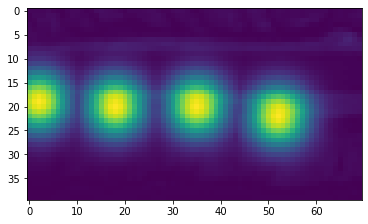

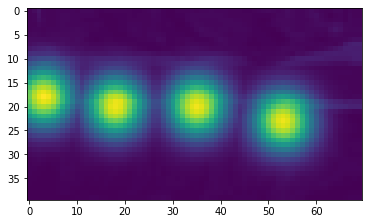

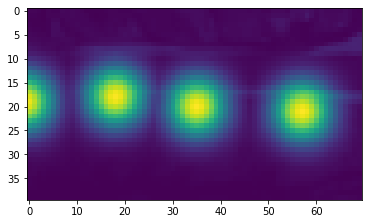

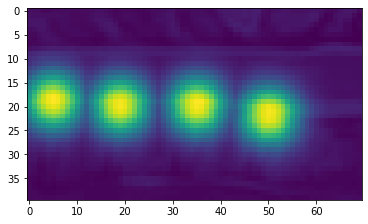

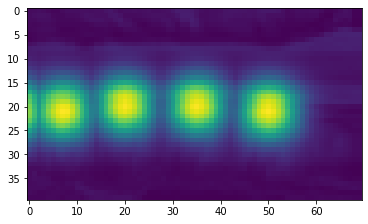

...

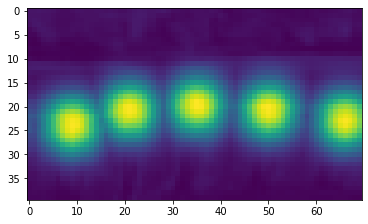

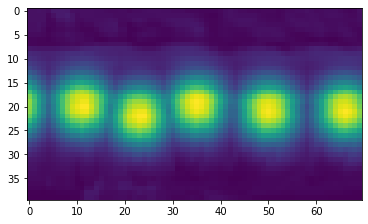

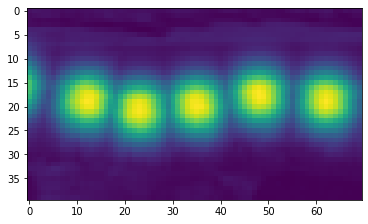

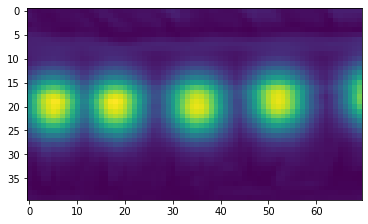

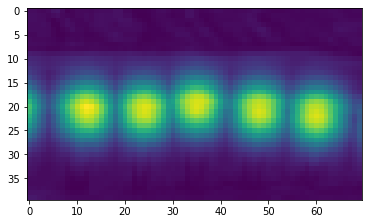

KeyboardInterrupt: 

In [690]:

for x in range (len(patch[1])):
    plt.imshow(patch[0][x][:,:,0]+10*patch[1][x][:,:,0])
    plt.show()

In [27]:
full=extract_groundtruth(ds,7,7,10)

===== DETECTED 58 images that contains label no. 10 =====
(58, 100, 300, 1)


In [110]:
ds[0].shape

(94, 100, 300, 1)

In [ ]:
full[0]=full[0][1:]
full[1]=full[1][1:]

In [ ]:
ds[0]=ds[0][1:]
ds[1]=ds[1][1:]

In [ ]:
for x in range (14,18):
    tmps=extract_groundtruth(test_ds,7,7,x)
    for i in range (len(tmps[0])):
        np.append(full[0],tmps[0][i],axis=0)
        np.append(full[1],tmps[1][i],axis=0)
    

In [ ]:
b=transforms.ToTensor()(patch[0][1])

In [ ]:
b.size()

In [ ]:
plt.imshow(full[0][0][0,:,:])

#### loader for patch

In [691]:
gmdataset_train = valdataset(image_paths=patch[0][:300], target_paths=patch[1][:300])
gmdataset_val = valdataset(image_paths=patch[0][300:], target_paths=patch[1][300:])

print('lendata'+str(len(gmdataset_train)))
train_loader = DataLoader(gmdataset_train, batch_size=20,
                              shuffle=False,
                              num_workers=0)
val_loader = DataLoader(gmdataset_val, batch_size=10,
                            shuffle=False,
                            num_workers=0)

lendata300


In [28]:
import skimage

#### loader for full MRI 

In [28]:
full_dataset_train =valdataset(image_paths=full[0][1:], target_paths=full[1][1:])
full_dataset_val = valdataset(image_paths=full[0][96:], target_paths=full[1][96:])

print('lendata'+str(len(full_dataset_train)))
train_loader = DataLoader(full_dataset_train, batch_size=2,
                              shuffle=False,
                              num_workers=0)
val_loader = DataLoader(full_dataset_val, batch_size=2,
                            shuffle=False,
                            num_workers=0)

lendata92


In [29]:
import copy
from torch.optim.lr_scheduler import StepLR

In [140]:
model = fcn_vl_v3(drop_rate=0.3, bn_momentum=0.1)

In [30]:
model=torch.load('model_l2_spec_np.pt')

In [692]:
num_epochs = 400
initial_lr = 0.00005
val_glob=85
optimizer = optim.Adam(model.parameters(), lr=initial_lr)
scheduler = StepLR(optimizer, step_size=200, gamma=0.5)
model=model_2.double()
model.cuda()
# import ipdb as pdb; pdb.set_trace()
#writer = SummaryWriter(log_dir='/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/Unet_FPGA_IVADO-master')
for epoch in tqdm(range(1, num_epochs+1)):
    scheduler.step()


    
    #lr = 0.000025
    #writer.add_scalar('learning_rate', lr, epoch)
    model.train()
    train_loss_total = 0.0
    num_steps = 0
    for i, batch in enumerate(train_loader):
        input_samples, gt_samples = batch[0], batch[1]
        
        var_input = input_samples.cuda()
        var_gt = gt_samples.cuda()

       
        
        #var_input = input_samples
        
        #print(var_input)
        #var_gt = gt_samples
        preds = model(var_input)
        #print(preds)
        #var_gt=var_gt
        #print('predssize'+str(preds.view(-1).size()))
        #print('gt_size'+str(var_gt.view(-1).size()))
        predi=preds.data.cpu().numpy()
        
        inpu=var_input.data.cpu().numpy()
        
        gt_s=var_gt.data.cpu().numpy()
        
        loss=caffe_eucl_loss(var_gt,preds)
        
        loss_2=loss_number_of_point(var_gt,preds)
        loss_2=loss_2.double()
        loss_2=torch.sum(loss_2)
        loss_3=loss_l2_disk(var_gt,preds)
        loss_3=loss_3.double()
        loss_4=dice_loss(var_gt,preds)
        loss_5=AdapWingLoss(preds, var_gt)
        #loss_3=loss_2(preds,var_gt)
        #print(loss_2)
        #loss=dice_loss(predi,gt_s)
       
        # if epoch == 1 and i == len(train_loader) - 1:
        #     import ipdb as pdb; pdb.set_trace()
        # if epoch == 4 and i == len(train_loader) - 1:
        #     import ipdb as pdb; pdb.set_trace()
        train_loss_total += loss.item()
        train_loss_total+=loss_2.item()
        train_loss_total+=loss_3.item()
        #print(train_loss_total)
        #print(train_loss_total)
        #loss_targ=reduce(add, loss_2)
        
        
        #loss_tot=torch.sum(loss_tot)
        #print(loss_tot)
        #loss_tot=loss_tot.double()
        #loss_tot.cuda()

        optimizer.zero_grad()
        loss.backward(retain_graph=True)
        loss_5.backward()
        loss_2.backward()
        loss_3.backward()
        
        #loss_5.backward()
        optimizer.step()
        
        num_steps += 1
        #print(num_steps)
        #train_loss_total += loss_4.item()
        #train_loss_total += loss_5.item()
        train_loss_total_avg = train_loss_total / num_steps

        # import ipdb as pdb; pdb.set_trace()
    model.eval()
    val_loss_total = 0.0
    num_steps = 0

        

        

    for i, batch in enumerate(val_loader):
        input_samples, gt_samples = batch[0], batch[1]
        

        with torch.no_grad():

            var_input = input_samples.cuda()
            var_gt = gt_samples.cuda()



            preds = model(var_input)

            loss_3=loss_l2_disk(var_gt,preds)
            loss_3=loss_3.double()
            val_loss_total += loss_3.item()
            print(loss_3.item())

        # Metrics computation
        #gt_npy = gt_samples.data.cpu().numpy().astype(np.uint8)
        #gt_npy = gt_npy.squeeze(axis=1)

        #preds = preds.data.cpu().numpy()
       # preds = threshold_predictions(preds)
       # preds = preds.astype(np.uint8)
       # preds = preds.squeeze(axis=1)
   #loss=dice_loss(preds,gt_npy)
   #val_loss_total += loss.item()
       # np.save('result.npy',preds)
       # np.save('gt.npy',gt_npy)
       # input_npy=var_input.data.cpu().numpy()
      #  np.save('input.npy',input_npy)

       # metric_mgr(preds, gt_npy)

        num_steps += 1

   # metrics_dict = metric_mgr.get_results()
   # metric_mgr.reset()

   # writer.add_scalars('metrics', metrics_dict, epoch)

    val_loss_total_avg = val_loss_total / num_steps
    if val_loss_total_avg < val_glob:
        val_glob=copy.deepcopy(val_loss_total_avg)
        best_model = copy.deepcopy(model)
        torch.save(best_model, 'model_l2_spec_np.pt')
    full_inp=transforms.ToTensor()(full[0][1][:256,:256])
    full_inp=full_inp.unsqueeze(0)
    full_inp=full_inp.double()
    full_gt=transforms.ToTensor()(full[1][1][:256,:256])
    full_gt=full_gt.double()
    full_gt=full_gt.unsqueeze(0)
    full_pred=model(full_inp.cuda())
    loss_full=loss_l2_disk(full_pred,full_gt.cuda())
    #loss_full.backward()

    print('losses', {'val_loss': val_loss_total_avg,'train_loss': train_loss_total_avg,'on_full_image':loss_full.item(),'dice':loss_4.item(),'wing':loss_5.item()}, epoch)




















  0%|          | 0/400 [00:00<?, ?it/s]

missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1





















  0%|          | 1/400 [00:04<31:18,  4.71s/it]

38.86737823486328
49.29956817626953
missing point1
1088.5130615234375
missing point1
missing point1
2083.83740234375
72.26001739501953
losses {'val_loss': 666.5554855346679, 'train_loss': 2677.7127626957054, 'on_full_image': 76.81241607666016, 'dice': 0.4658114601984449, 'wing': 0.3742462218157259} 1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing 




















  0%|          | 2/400 [00:09<31:10,  4.70s/it]

43.45315933227539
61.90663146972656
104.06857299804688
missing point1
missing point1
2086.75048828125
57.60942077636719
losses {'val_loss': 470.7576545715332, 'train_loss': 3598.4332139253443, 'on_full_image': 723.9939575195312, 'dice': 0.49699915603642153, 'wing': 0.25524794141763996} 2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missin




















  1%|          | 3/400 [00:14<31:02,  4.69s/it]

55.26345443725586
77.95880889892578
118.92080688476562
141.92330932617188
82.6302719116211
losses {'val_loss': 95.33933029174804, 'train_loss': 4043.999611840016, 'on_full_image': 723.9939575195312, 'dice': 0.4761861743424086, 'wing': 0.2556719851375687} 3
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing 




















  1%|          | 4/400 [00:18<30:55,  4.69s/it]

57.263450622558594
83.33843231201172
109.89700317382812
139.11868286132812
84.04316711425781
losses {'val_loss': 94.73214721679688, 'train_loss': 4168.616141649024, 'on_full_image': 723.9939575195312, 'dice': 0.4707560632381401, 'wing': 0.20332947899174691} 4
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















  1%|▏         | 5/400 [00:23<30:50,  4.68s/it]

missing point1
1026.9281005859375
54.22010803222656
118.04359436035156
missing point1
missing point1
2084.41943359375
70.83958435058594
losses {'val_loss': 670.8901641845703, 'train_loss': 3906.3158780417775, 'on_full_image': 723.9939575195312, 'dice': 0.47509465816044505, 'wing': 0.16319159506013942} 5
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















  2%|▏         | 6/400 [00:28<30:45,  4.68s/it]

56.17822265625
82.3510513305664
118.91972351074219
148.78042602539062
82.42405700683594
losses {'val_loss': 97.73069610595704, 'train_loss': 4305.5802409773, 'on_full_image': 723.9939575195312, 'dice': 0.4963957138721995, 'wing': 0.22250032709176587} 6
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















  2%|▏         | 7/400 [00:32<30:37,  4.68s/it]

52.84848403930664
82.3510513305664
107.06857299804688
128.02365112304688
80.86337280273438
losses {'val_loss': 90.23102645874023, 'train_loss': 3315.066987543763, 'on_full_image': 723.9939575195312, 'dice': 0.47891090087748733, 'wing': 0.26175199682543604} 7
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















  2%|▏         | 8/400 [00:37<30:32,  4.67s/it]

56.08455276489258
84.34484100341797
128.09129333496094
128.5382080078125
81.44784545898438
losses {'val_loss': 95.70134811401367, 'train_loss': 3898.456258837376, 'on_full_image': -10.0, 'dice': 0.48116190678634696, 'wing': 0.21592396780445108} 8
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















  2%|▏         | 9/400 [00:42<30:26,  4.67s/it]

52.76401138305664
85.34484100341797
119.50550842285156
128.60943603515625
81.4478530883789
losses {'val_loss': 93.53432998657226, 'train_loss': 4102.643377922717, 'on_full_image': 723.9939575195312, 'dice': 0.4714952363790438, 'wing': 0.24530326296008434} 9
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing




















  2%|▎         | 10/400 [00:46<30:21,  4.67s/it]

42.37014389038086
73.34484100341797
116.4827880859375
128.60943603515625
81.42405700683594
losses {'val_loss': 88.44625320434571, 'train_loss': 4632.604382333162, 'on_full_image': 723.9939575195312, 'dice': 0.4836577158371489, 'wing': 0.25532670433094706} 10
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















  3%|▎         | 11/400 [00:51<30:16,  4.67s/it]

43.03894805908203
86.34484100341797
115.4827880859375
128.60513305664062
72.21246337890625
losses {'val_loss': 89.13683471679687, 'train_loss': 4162.677505526548, 'on_full_image': 723.9939575195312, 'dice': 0.48128669141941327, 'wing': 0.2701022646584082} 11
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















  3%|▎         | 12/400 [00:56<30:10,  4.67s/it]

missing point1
1024.9281005859375
74.34484100341797
missing point1
1086.796142578125
missing point1
missing point1
2083.83349609375
61.18867111206055
losses {'val_loss': 866.2182502746582, 'train_loss': 3634.681915055453, 'on_full_image': 723.9939575195312, 'dice': 0.4989108833805017, 'wing': 0.2546022998663398} 12
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing 




















  3%|▎         | 13/400 [01:00<30:05,  4.67s/it]

51.84848403930664
87.34484100341797
106.87202453613281
128.02365112304688
81.44784545898438
losses {'val_loss': 91.10736923217773, 'train_loss': 3828.310744688271, 'on_full_image': 723.9939575195312, 'dice': 0.46762931407009967, 'wing': 0.2641157428071621} 13
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missi




















  4%|▎         | 14/400 [01:05<30:01,  4.67s/it]

51.84848403930664
83.67168426513672
129.06631469726562
missing point1
1106.7742919921875
81.42286682128906
losses {'val_loss': 290.5567283630371, 'train_loss': 3893.7303999722126, 'on_full_image': 723.9939575195312, 'dice': 0.47681442894257164, 'wing': 0.2520730429756574} 14
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
miss




















  4%|▍         | 15/400 [01:10<29:56,  4.67s/it]

missing point1
1024.9281005859375
84.75469970703125
105.4630355834961
missing point1
1106.8455810546875
69.40038299560547
losses {'val_loss': 478.2783599853516, 'train_loss': 4563.9693900741695, 'on_full_image': 723.9939575195312, 'dice': 0.4931871517818974, 'wing': 0.24975854317478907} 15
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
miss




















  4%|▍         | 16/400 [01:14<29:51,  4.67s/it]

52.17967987060547
85.21542358398438
105.87202453613281
124.60944366455078
80.83839416503906
losses {'val_loss': 89.7429931640625, 'train_loss': 4293.149942862513, 'on_full_image': 723.9939575195312, 'dice': 0.4766406633842981, 'wing': 0.24228871115491626} 16
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















  4%|▍         | 17/400 [01:19<29:47,  4.67s/it]

52.17967987060547
85.21542358398438
105.04359436035156
128.02365112304688
81.83708190917969
losses {'val_loss': 90.45988616943359, 'train_loss': 3891.4827483795884, 'on_full_image': 723.9939575195312, 'dice': 0.4835852503971627, 'wing': 0.2227377963719879} 17
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















  4%|▍         | 18/400 [01:24<29:42,  4.66s/it]

51.76546859741211
85.2142333984375
128.09129333496094
141.675048828125
82.862060546875
losses {'val_loss': 97.9216209411621, 'train_loss': 3755.072620399684, 'on_full_image': 723.9939575195312, 'dice': 0.5035175494046051, 'wing': 0.27536757298434095} 18
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















  5%|▍         | 19/400 [01:28<29:37,  4.66s/it]

52.00810623168945
84.21542358398438
117.09129333496094
139.52859497070312
84.27627563476562
losses {'val_loss': 95.4239387512207, 'train_loss': 3497.1828548852313, 'on_full_image': 723.9939575195312, 'dice': 0.4652984541359716, 'wing': 0.2942779338646477} 19
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















  5%|▌         | 20/400 [01:33<29:32,  4.66s/it]

52.76546859741211
86.32202911376953
117.04359436035156
missing point1
1106.9285888671875
80.83708190917969
losses {'val_loss': 288.77935256958006, 'train_loss': 4358.099020446945, 'on_full_image': 723.9939575195312, 'dice': 0.4794641735211129, 'wing': 0.22045060749866016} 20
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















  5%|▌         | 21/400 [01:38<29:27,  4.66s/it]

51.17967987060547
83.34583282470703
103.65435791015625
149.21412658691406
83.25129699707031
losses {'val_loss': 94.12905883789062, 'train_loss': 4091.858739750372, 'on_full_image': 723.9939575195312, 'dice': 0.474651498788215, 'wing': 0.2380715645005173} 21
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing




















  6%|▌         | 22/400 [01:42<29:23,  4.66s/it]

50.17967987060547
85.80021667480469
105.65435791015625
127.60514068603516
81.42286682128906
losses {'val_loss': 90.13245239257813, 'train_loss': 4221.298046756771, 'on_full_image': -10.0, 'dice': 0.5024780077737195, 'wing': 0.2603554806342738} 22
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















  6%|▌         | 23/400 [01:47<29:18,  4.66s/it]

missing point1
1020.9281005859375
84.34583282470703
107.04359436035156
missing point1
1117.019287109375
73.60169982910156
losses {'val_loss': 480.5877029418945, 'train_loss': 3491.9599024165113, 'on_full_image': 723.9939575195312, 'dice': 0.4909688399808009, 'wing': 0.25174013529115546} 23
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















  6%|▌         | 24/400 [01:52<29:13,  4.66s/it]

missing point1
1023.9281005859375
85.34583282470703
105.0673828125
139.1143798828125
72.62667846679688
losses {'val_loss': 285.21647491455076, 'train_loss': 3754.724729660938, 'on_full_image': 723.9939575195312, 'dice': 0.48751516514952553, 'wing': 0.20473594168248793} 24
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing




















  6%|▋         | 25/400 [01:56<29:09,  4.66s/it]

missing point1
1021.9281005859375
85.34484100341797
107.04359436035156
missing point1
1104.5142822265625
82.44784545898438
losses {'val_loss': 480.25573272705077, 'train_loss': 4018.4061703898055, 'on_full_image': 723.9939575195312, 'dice': 0.48736484044042194, 'wing': 0.2338206075483192} 25
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
mi




















  6%|▋         | 26/400 [02:01<29:04,  4.67s/it]

missing point1
1024.3424072265625
64.31985473632812
missing point1
1087.578369140625
missing point1
missing point1
2097.89306640625
63.0171012878418
losses {'val_loss': 867.4301597595215, 'train_loss': 3880.074603184473, 'on_full_image': 723.9939575195312, 'dice': 0.4622724032084691, 'wing': 0.16999000558256297} 26
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing 




















  7%|▋         | 27/400 [02:06<28:59,  4.66s/it]

41.03894805908203
75.31986236572266
119.15811157226562
missing point1
1116.0240478515625
82.44784545898438
losses {'val_loss': 286.7977630615234, 'train_loss': 3818.5292674723596, 'on_full_image': 723.9939575195312, 'dice': 0.4980063511099363, 'wing': 0.22098569334850418} 27
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















  7%|▋         | 28/400 [02:10<28:54,  4.66s/it]

missing point1
1021.3423461914062
75.31986236572266
missing point1
1088.7960205078125
missing point1
missing point1
2085.8291015625
72.32618713378906
losses {'val_loss': 868.7227035522461, 'train_loss': 4023.101354142973, 'on_full_image': 723.9939575195312, 'dice': 0.49539895683963253, 'wing': 0.29112930907188034} 28
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missin




















  7%|▋         | 29/400 [02:15<28:50,  4.66s/it]

50.43502426147461
97.68183898925781
130.59934997558594
153.0187530517578
83.57110595703125
losses {'val_loss': 103.06121444702148, 'train_loss': 3746.0825986796945, 'on_full_image': 723.9939575195312, 'dice': 0.45486754280555686, 'wing': 0.227583218050975} 29
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















  8%|▊         | 30/400 [02:20<28:45,  4.66s/it]

47.676910400390625
93.56485748291016
129.6005401611328
151.21412658691406
82.42405700683594
losses {'val_loss': 100.89609832763672, 'train_loss': 3949.585169264472, 'on_full_image': 723.9939575195312, 'dice': 0.47158037758068794, 'wing': 0.24197907168379862} 30
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















  8%|▊         | 31/400 [02:24<28:41,  4.67s/it]

52.2626953125
84.34583282470703
104.4827880859375
138.11436462402344
82.42405700683594
losses {'val_loss': 92.32594757080078, 'train_loss': 3618.693198317085, 'on_full_image': 723.9939575195312, 'dice': 0.48033676925586655, 'wing': 0.26274606187631616} 31
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing p




















  8%|▊         | 32/400 [02:29<28:38,  4.67s/it]

53.2626953125
84.34583282470703
116.91972351074219
140.0420684814453
83.25247955322266
losses {'val_loss': 95.56455993652344, 'train_loss': 3819.1060138902594, 'on_full_image': 723.9939575195312, 'dice': 0.47366459472955236, 'wing': 0.19307053791775383} 32
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing 




















  8%|▊         | 33/400 [02:34<28:33,  4.67s/it]

50.2626953125
72.05561065673828
104.06857299804688
137.70445251464844
83.25247192382812
losses {'val_loss': 89.46876068115235, 'train_loss': 3813.868617008819, 'on_full_image': 723.9939575195312, 'dice': 0.4578581676066048, 'wing': 0.21680156431469527} 33
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing p




















  8%|▊         | 34/400 [02:38<28:29,  4.67s/it]

49.593894958496094
70.9316177368164
103.4827880859375
139.11436462402344
82.83827209472656
losses {'val_loss': 89.1921875, 'train_loss': 3819.222097009908, 'on_full_image': 723.9939575195312, 'dice': 0.48759843621125143, 'wing': 0.17880317571388887} 34
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing poin




















  9%|▉         | 35/400 [02:43<28:25,  4.67s/it]

40.9559326171875
83.34583282470703
118.89474487304688
151.06813049316406
82.862060546875
losses {'val_loss': 95.42534027099609, 'train_loss': 3889.338464613301, 'on_full_image': 723.9939575195312, 'dice': 0.476010390313229, 'wing': 0.18804717807945828} 35
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















  9%|▉         | 36/400 [02:48<28:20,  4.67s/it]

39.03894805908203
75.82117462158203
105.62937927246094
missing point1
missing point1
2095.432373046875
73.59696960449219
losses {'val_loss': 477.9037689208984, 'train_loss': 3484.4348063160896, 'on_full_image': 723.9939575195312, 'dice': 0.4845557015599764, 'wing': 0.23232425674404827} 36
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missi




















  9%|▉         | 37/400 [02:52<28:16,  4.67s/it]

47.17967987060547
83.34583282470703
106.06857299804688
148.7286834716797
82.83827209472656
losses {'val_loss': 93.63220825195313, 'train_loss': 3750.8531170957717, 'on_full_image': 723.9939575195312, 'dice': 0.4877223349724431, 'wing': 0.2484657754071217} 37
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 10%|▉         | 38/400 [02:57<28:11,  4.67s/it]

48.593894958496094
86.34464263916016
106.0673828125
140.04315185546875
83.862060546875
losses {'val_loss': 92.9822265625, 'train_loss': 3483.159094111479, 'on_full_image': 723.9939575195312, 'dice': 0.47838569872299286, 'wing': 0.24232529439891246} 38
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point




















 10%|▉         | 39/400 [03:02<28:07,  4.67s/it]

missing point1
1018.9281005859375
87.90682983398438
116.21516418457031
missing point1
1106.7923583984375
72.60169219970703
losses {'val_loss': 480.4888290405273, 'train_loss': 4151.605713444336, 'on_full_image': 723.9939575195312, 'dice': 0.5008286183135748, 'wing': 0.22942567423677254} 39
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
miss




















 10%|█         | 40/400 [03:06<28:03,  4.68s/it]

38.453163146972656
87.92354583740234
107.04359436035156
missing point1
1118.9437255859375
74.20773315429688
losses {'val_loss': 285.31435241699216, 'train_loss': 4015.3597046565674, 'on_full_image': 723.9939575195312, 'dice': 0.4794923701793957, 'wing': 0.20069752165752663} 40
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mi




















 10%|█         | 41/400 [03:11<27:58,  4.68s/it]

51.593894958496094
82.9316177368164
118.50431823730469
148.5826873779297
83.83826446533203
losses {'val_loss': 97.09015655517578, 'train_loss': 4211.486330221402, 'on_full_image': 723.9939575195312, 'dice': 0.49030321994072523, 'wing': 0.23396747313829339} 41
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missi




















 10%|█         | 42/400 [03:16<27:54,  4.68s/it]

38.453163146972656
81.9316177368164
107.0673828125
missing point1
1114.9610595703125
74.0408935546875
losses {'val_loss': 283.2908233642578, 'train_loss': 3950.8737544837236, 'on_full_image': 723.9939575195312, 'dice': 0.48369577242452233, 'wing': 0.22741963383071345} 42
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing 




















 11%|█         | 43/400 [03:20<27:49,  4.68s/it]

37.03894805908203
87.3436508178711
121.06631469726562
128.60943603515625
73.6219482421875
losses {'val_loss': 89.5360595703125, 'train_loss': 4146.692700622482, 'on_full_image': 723.9939575195312, 'dice': 0.47837535702671763, 'wing': 0.24365261175565908} 43
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 11%|█         | 44/400 [03:25<27:44,  4.67s/it]

35.03894805908203
85.34484100341797
105.65318298339844
141.1143798828125
75.01709747314453
losses {'val_loss': 88.43368988037109, 'train_loss': 3613.1378575483423, 'on_full_image': 723.9939575195312, 'dice': 0.456531829990646, 'wing': 0.26316436430713686} 44
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 11%|█▏        | 45/400 [03:30<27:39,  4.67s/it]

36.453163146972656
84.93062591552734
119.67588806152344
148.1428985595703
73.01709747314453
losses {'val_loss': 92.44393463134766, 'train_loss': 3739.780147556704, 'on_full_image': 723.9939575195312, 'dice': 0.5055241497809699, 'wing': 0.25820925638701303} 45
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















 12%|█▏        | 46/400 [03:34<27:34,  4.67s/it]

37.453163146972656
86.29931640625
missing point1
1107.713623046875
missing point1
1117.0032958984375
61.18867111206055
losses {'val_loss': 481.93161392211914, 'train_loss': 3949.9902261643597, 'on_full_image': 723.9939575195312, 'dice': 0.4850205511207947, 'wing': 0.24177360540529305} 46
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missin




















 12%|█▏        | 47/400 [03:39<27:30,  4.68s/it]

36.453163146972656
83.32311248779297
108.0673828125
missing point1
1115.0283203125
72.60289001464844
losses {'val_loss': 283.0949737548828, 'train_loss': 4270.716085274634, 'on_full_image': 723.9939575195312, 'dice': 0.4717540213488949, 'wing': 0.1936028980546546} 47
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing poin




















 12%|█▏        | 48/400 [03:44<27:26,  4.68s/it]

37.03314971923828
78.31404876708984
107.67816162109375
153.61843872070312
72.60289001464844
losses {'val_loss': 89.84933776855469, 'train_loss': 4415.943412666877, 'on_full_image': 723.9939575195312, 'dice': 0.49233277092990524, 'wing': 0.17958231872179622} 48
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















 12%|█▏        | 49/400 [03:48<27:22,  4.68s/it]

missing point1
1019.9281005859375
55.80481719970703
109.06266021728516
missing point1
1109.918701171875
62.5981559753418
losses {'val_loss': 471.4624870300293, 'train_loss': 3814.3852879349356, 'on_full_image': 723.9939575195312, 'dice': 0.4683969585643998, 'wing': 0.23259355934383674} 49
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















 12%|█▎        | 50/400 [03:53<27:16,  4.68s/it]

39.03314971923828
85.34484100341797
108.48159790039062
missing point1
1118.0184326171875
73.60289001464844
losses {'val_loss': 284.89618225097655, 'train_loss': 3742.644888045938, 'on_full_image': 723.9939575195312, 'dice': 0.48881154353479317, 'wing': 0.21455417871215415} 50
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















 13%|█▎        | 51/400 [03:58<27:11,  4.68s/it]

49.671112060546875
84.4698257446289
107.89581298828125
151.1350555419922
82.81328582763672
losses {'val_loss': 95.19701843261718, 'train_loss': 3749.143147422034, 'on_full_image': 723.9939575195312, 'dice': 0.4783792021671561, 'wing': 0.23304286312752692} 51
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 13%|█▎        | 52/400 [04:02<27:06,  4.67s/it]

missing point1
1019.3423461914062
54.79901885986328
missing point1
1087.967529296875
missing point1
missing point1
2084.41552734375
63.5981559753418
losses {'val_loss': 862.0245155334472, 'train_loss': 3615.3035829505156, 'on_full_image': 723.9939575195312, 'dice': 0.47927177691822787, 'wing': 0.22053716013477237} 52
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missin




















 13%|█▎        | 53/400 [04:07<27:02,  4.67s/it]

49.593894958496094
85.31731414794922
106.65318298339844
missing point1
1116.5394287109375
83.85733032226562
losses {'val_loss': 288.39223022460936, 'train_loss': 4279.492133562518, 'on_full_image': 723.9939575195312, 'dice': 0.47356547677112715, 'wing': 0.18388282172127213} 53
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 14%|█▎        | 54/400 [04:12<26:57,  4.67s/it]

38.370147705078125
82.34583282470703
118.47309875488281
138.04434204101562
83.25247192382812
losses {'val_loss': 92.09717864990235, 'train_loss': 3212.4986028358935, 'on_full_image': 723.9939575195312, 'dice': 0.49571399755890877, 'wing': 0.25920155701620223} 54
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 14%|█▍        | 55/400 [04:16<26:53,  4.68s/it]

47.593894958496094
83.32311248779297
107.48159790039062
138.11911010742188
83.25247192382812
losses {'val_loss': 91.95403747558593, 'train_loss': 3212.6670018396303, 'on_full_image': 723.9939575195312, 'dice': 0.4852596555087678, 'wing': 0.21444120302067265} 55
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
mis




















 14%|█▍        | 56/400 [04:21<26:48,  4.68s/it]

47.2626953125
85.26016998291016
106.21516418457031
missing point1
1127.2861328125
84.80855560302734
losses {'val_loss': 290.1665435791016, 'train_loss': 4204.919854637901, 'on_full_image': 723.9939575195312, 'dice': 0.4817567094157875, 'wing': 0.21289613958905856} 56
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 14%|█▍        | 57/400 [04:26<26:43,  4.67s/it]

49.593894958496094
84.04862213134766
119.1581039428711
150.7956085205078
85.24775695800781
losses {'val_loss': 97.7687973022461, 'train_loss': 3216.854922532589, 'on_full_image': 723.9939575195312, 'dice': 0.4819499605232921, 'wing': 0.2097089124107907} 57
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing 




















 14%|█▍        | 58/400 [04:30<26:38,  4.67s/it]

52.29692459106445
82.76004791259766
120.06007385253906
148.38209533691406
82.42405700683594
losses {'val_loss': 97.18463973999023, 'train_loss': 3953.265683406239, 'on_full_image': 723.9939575195312, 'dice': 0.47925877151137986, 'wing': 0.2708125676730083} 58
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 15%|█▍        | 59/400 [04:35<26:33,  4.67s/it]

38.95447540283203
85.9030990600586
106.45037841796875
missing point1
1128.7047119140625
81.42286682128906
losses {'val_loss': 288.2871063232422, 'train_loss': 3741.8128360024953, 'on_full_image': 723.9939575195312, 'dice': 0.47605157022318767, 'wing': 0.22207698468168907} 59
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















 15%|█▌        | 60/400 [04:40<26:28,  4.67s/it]

38.9559326171875
83.32311248779297
110.48159790039062
141.51675415039062
71.77445983886719
losses {'val_loss': 89.21037139892579, 'train_loss': 3673.9694916410695, 'on_full_image': 723.9939575195312, 'dice': 0.46895257377566557, 'wing': 0.236279968616441} 60
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 15%|█▌        | 61/400 [04:44<26:23,  4.67s/it]

40.368690490722656
83.92581939697266
107.0673828125
missing point1
missing point1
2095.43603515625
74.18867492675781
losses {'val_loss': 480.19732055664065, 'train_loss': 3213.5248558356475, 'on_full_image': 723.9939575195312, 'dice': 0.4857063593990635, 'wing': 0.2772543149923945} 61
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 16%|█▌        | 62/400 [04:49<26:19,  4.67s/it]

38.370147705078125
71.93063354492188
107.23896789550781
missing point1
1118.1956787109375
72.60289001464844
losses {'val_loss': 281.66766357421875, 'train_loss': 3346.142563986487, 'on_full_image': 723.9939575195312, 'dice': 0.48790737233295456, 'wing': 0.23373004744267376} 62
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 16%|█▌        | 63/400 [04:54<26:14,  4.67s/it]

38.370147705078125
83.34484100341797
106.23896789550781
137.29067993164062
81.44784545898438
losses {'val_loss': 89.33849639892578, 'train_loss': 3206.6188139638975, 'on_full_image': 723.9939575195312, 'dice': 0.4799585061899375, 'wing': 0.17666897372019355} 63
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
mis




















 16%|█▌        | 64/400 [04:58<26:09,  4.67s/it]

37.453163146972656
72.29932403564453
107.4827880859375
missing point1
missing point1
2072.33251953125
61.60419845581055
losses {'val_loss': 470.23439865112306, 'train_loss': 4079.843589360112, 'on_full_image': 723.9939575195312, 'dice': 0.48228871679154817, 'wing': 0.2261228662608745} 64
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 16%|█▋        | 65/400 [05:03<26:05,  4.67s/it]

36.453163146972656
70.90890502929688
106.06739807128906
missing point1
missing point1
2083.0048828125
60.60419845581055
losses {'val_loss': 471.4077095031738, 'train_loss': 3611.6583879534796, 'on_full_image': 723.9939575195312, 'dice': 0.49300917177914105, 'wing': 0.20138547368742804} 65
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missi

/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type fcn_vl_v3. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "



















 16%|█▋        | 66/400 [05:08<26:02,  4.68s/it]

37.03894805908203
70.9316177368164
105.4827880859375
126.19092559814453
71.77577209472656
losses {'val_loss': 82.28401031494141, 'train_loss': 3808.122526164814, 'on_full_image': 723.9939575195312, 'dice': 0.48737385382989806, 'wing': 0.22100953831292763} 66
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 17%|█▋        | 67/400 [05:13<25:57,  4.68s/it]

36.95447540283203
82.34583282470703
119.50550842285156
148.6456756591797
82.42405700683594
losses {'val_loss': 93.97510986328125, 'train_loss': 3807.053448122562, 'on_full_image': 723.9939575195312, 'dice': 0.4999936255824303, 'wing': 0.25283060070228286} 67
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 17%|█▋        | 68/400 [05:17<25:52,  4.68s/it]

47.592437744140625
88.92569732666016
106.04359436035156
151.2983856201172
84.42405700683594
losses {'val_loss': 95.65683441162109, 'train_loss': 4275.668975430783, 'on_full_image': 723.9939575195312, 'dice': 0.4968751147497855, 'wing': 0.22978435233990321} 68
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 17%|█▋        | 69/400 [05:22<25:47,  4.68s/it]

36.453163146972656
72.85684967041016
107.48159790039062
missing point1
missing point1
2093.021728515625
74.62667846679688
losses {'val_loss': 476.88800354003905, 'train_loss': 3608.5427684713995, 'on_full_image': 723.9939575195312, 'dice': 0.49210921594015244, 'wing': 0.23508567009043566} 69
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mi




















 18%|█▊        | 70/400 [05:27<25:42,  4.68s/it]

48.592437744140625
81.93683624267578
104.4827880859375
149.47479248046875
83.00984191894531
losses {'val_loss': 93.4993392944336, 'train_loss': 3670.745026676896, 'on_full_image': 723.9939575195312, 'dice': 0.4765797764015981, 'wing': 0.17040040736739454} 70
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 18%|█▊        | 71/400 [05:31<25:38,  4.68s/it]

45.17967987060547
81.35873413085938
106.24015808105469
148.3856964111328
82.83827209472656
losses {'val_loss': 92.80050811767578, 'train_loss': 3736.032956959792, 'on_full_image': 723.9939575195312, 'dice': 0.46435783488374527, 'wing': 0.1803287246100402} 71
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 18%|█▊        | 72/400 [05:36<25:33,  4.68s/it]

36.453163146972656
72.85684967041016
104.65318298339844
missing point1
1106.4432373046875
73.21378326416016
losses {'val_loss': 278.72404327392576, 'train_loss': 3868.5437612803357, 'on_full_image': 723.9939575195312, 'dice': 0.467710394884467, 'wing': 0.22267662124622858} 72
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















 18%|█▊        | 73/400 [05:41<25:28,  4.68s/it]

38.370147705078125
82.9316177368164
104.65435791015625
missing point1
1116.199951171875
73.18998718261719
losses {'val_loss': 283.06921234130857, 'train_loss': 3808.045398976322, 'on_full_image': 723.9939575195312, 'dice': 0.48157814479113825, 'wing': 0.2508997467498238} 73
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missi




















 18%|█▊        | 74/400 [05:45<25:26,  4.68s/it]

37.9559326171875
71.90890502929688
108.20491027832031
missing point1
1107.0289306640625
74.18867492675781
losses {'val_loss': 279.857470703125, 'train_loss': 4204.268588819776, 'on_full_image': 723.9939575195312, 'dice': 0.49070542607679757, 'wing': 0.18142095137023867} 74
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 19%|█▉        | 75/400 [05:50<25:21,  4.68s/it]

37.370147705078125
82.90889739990234
106.20491027832031
missing point1
1115.1287841796875
82.29364776611328
losses {'val_loss': 284.7812774658203, 'train_loss': 3543.5386735122643, 'on_full_image': 723.9939575195312, 'dice': 0.47720321108338193, 'wing': 0.18516626200175124} 75
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 19%|█▉        | 76/400 [05:55<25:16,  4.68s/it]

48.17822265625
82.9316177368164
107.06739807128906
148.79991149902344
83.00984191894531
losses {'val_loss': 93.99739837646484, 'train_loss': 3543.6281058785607, 'on_full_image': 723.9939575195312, 'dice': 0.47852336371603643, 'wing': 0.23718196669432898} 76
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 19%|█▉        | 77/400 [05:59<25:11,  4.68s/it]

49.17822265625
84.0544204711914
104.65318298339844
147.3856964111328
83.42405700683594
losses {'val_loss': 93.73911590576172, 'train_loss': 3276.959464741586, 'on_full_image': 723.9939575195312, 'dice': 0.4894081860359989, 'wing': 0.3170900415900672} 77
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 20%|█▉        | 78/400 [06:04<25:06,  4.68s/it]

47.17967987060547
83.93042755126953
104.65318298339844
141.61672973632812
83.83827209472656
losses {'val_loss': 92.24365844726563, 'train_loss': 3609.649303833149, 'on_full_image': 723.9939575195312, 'dice': 0.46523056861166645, 'wing': 0.20997017929042075} 78
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















 20%|█▉        | 79/400 [06:09<25:02,  4.68s/it]

36.9559326171875
54.72278594970703
106.65318298339844
missing point1
1116.1197509765625
73.18867492675781
losses {'val_loss': 277.52806549072267, 'train_loss': 4004.515716897094, 'on_full_image': 723.9939575195312, 'dice': 0.48959551759522757, 'wing': 0.30466404666769925} 79
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 20%|██        | 80/400 [06:13<24:57,  4.68s/it]

54.29692459106445
70.36395263671875
104.4827880859375
136.7109375
82.01115417480469
losses {'val_loss': 89.57315139770508, 'train_loss': 3545.7680399009123, 'on_full_image': 723.9939575195312, 'dice': 0.5018457089966486, 'wing': 0.2428190819209244} 80
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point




















 20%|██        | 81/400 [06:18<24:52,  4.68s/it]

45.17967987060547
82.3510513305664
104.65318298339844
138.28594970703125
82.42405700683594
losses {'val_loss': 90.5787841796875, 'train_loss': 3742.477319525347, 'on_full_image': 723.9939575195312, 'dice': 0.4988384323901911, 'wing': 0.2447765096074013} 81
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 20%|██        | 82/400 [06:23<24:47,  4.68s/it]

52.593894958496094
85.32084655761719
102.65318298339844
148.79991149902344
83.00984191894531
losses {'val_loss': 94.4755355834961, 'train_loss': 3205.5757000715935, 'on_full_image': 723.9939575195312, 'dice': 0.46699179761487597, 'wing': 0.17052809712881978} 82
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 21%|██        | 83/400 [06:27<24:43,  4.68s/it]

39.370147705078125
85.81034088134766
103.65318298339844
missing point1
1126.704833984375
73.77445983886719
losses {'val_loss': 285.86259307861326, 'train_loss': 3541.84566280839, 'on_full_image': 723.9939575195312, 'dice': 0.48116540834434063, 'wing': 0.25423465891500296} 83
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















 21%|██        | 84/400 [06:32<24:38,  4.68s/it]

37.9559326171875
81.82022094726562
104.62313842773438
147.6472930908203
82.70667266845703
losses {'val_loss': 90.95065155029297, 'train_loss': 3801.9130619947964, 'on_full_image': 723.9939575195312, 'dice': 0.4663891431946433, 'wing': 0.18543602261613032} 84
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 21%|██▏       | 85/400 [06:37<24:33,  4.68s/it]

49.17967987060547
72.72732543945312
102.79069519042969
138.2147216796875
84.41932678222656
losses {'val_loss': 89.46634979248047, 'train_loss': 3476.6919862048985, 'on_full_image': 723.9939575195312, 'dice': 0.47637339176914983, 'wing': 0.220777153686634} 85
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 22%|██▏       | 86/400 [06:41<24:29,  4.68s/it]

missing point1
1018.9281005859375
63.78535461425781
missing point1
1086.5545654296875
missing point1
missing point1
2070.24951171875
74.21246337890625
losses {'val_loss': 862.7459991455078, 'train_loss': 3269.886087840427, 'on_full_image': 723.9939575195312, 'dice': 0.4720873200267277, 'wing': 0.22261065734110064} 86
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 22%|██▏       | 87/400 [06:46<24:24,  4.68s/it]

50.05422592163086
80.80731201171875
115.67588806152344
150.23541259765625
83.3990707397461
losses {'val_loss': 96.03438186645508, 'train_loss': 3403.736960766773, 'on_full_image': 723.9939575195312, 'dice': 0.4713239003134432, 'wing': 0.18722869422740065} 87
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 22%|██▏       | 88/400 [06:51<24:20,  4.68s/it]

47.593894958496094
81.93683624267578
108.20491027832031
148.2397003173828
82.00984191894531
losses {'val_loss': 93.59703674316407, 'train_loss': 3737.7590391777603, 'on_full_image': 723.9939575195312, 'dice': 0.49571260127925176, 'wing': 0.22024230135149597} 88
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 22%|██▏       | 89/400 [06:55<24:14,  4.68s/it]

52.592437744140625
82.84860229492188
105.65318298339844
148.7286834716797
83.41932678222656
losses {'val_loss': 94.64844665527343, 'train_loss': 2999.9356467993143, 'on_full_image': 723.9939575195312, 'dice': 0.4661988990162039, 'wing': 0.19629268910638095} 89
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















 22%|██▎       | 90/400 [07:00<24:10,  4.68s/it]

35.95447540283203
74.72613525390625
missing point1
1085.5533447265625
missing point1
1119.4271240234375
75.18394470214844
losses {'val_loss': 478.1690048217773, 'train_loss': 3534.7268357961448, 'on_full_image': 723.9939575195312, 'dice': 0.49084625521292835, 'wing': 0.214448691953903} 90
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 23%|██▎       | 91/400 [07:05<24:05,  4.68s/it]

38.95447540283203
74.77955627441406
missing point1
1087.1051025390625
missing point1
missing point1
2097.409912109375
75.2066650390625
losses {'val_loss': 674.6911422729493, 'train_loss': 3601.7302085386004, 'on_full_image': 723.9939575195312, 'dice': 0.45944933283079314, 'wing': 0.2019991606021393} 91
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 23%|██▎       | 92/400 [07:09<24:01,  4.68s/it]

38.95447540283203
84.80209350585938
106.79069519042969
138.28164672851562
74.18394470214844
losses {'val_loss': 88.60257110595703, 'train_loss': 3531.4016392221424, 'on_full_image': 723.9939575195312, 'dice': 0.4848687363297648, 'wing': 0.22548601778562447} 92
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 23%|██▎       | 93/400 [07:14<23:58,  4.68s/it]

39.370147705078125
73.84761810302734
106.0673828125
missing point1
1104.514404296875
74.18394470214844
losses {'val_loss': 279.5966995239258, 'train_loss': 3469.4360458101905, 'on_full_image': 723.9939575195312, 'dice': 0.47136952652799846, 'wing': 0.19143736203710876} 93
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 24%|██▎       | 94/400 [07:19<23:52,  4.68s/it]

35.9559326171875
86.92943572998047
106.65318298339844
139.28594970703125
73.18867492675781
losses {'val_loss': 88.40263519287109, 'train_loss': 3674.01801199459, 'on_full_image': 723.9939575195312, 'dice': 0.46769323634881155, 'wing': 0.25242904847560665} 94
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 24%|██▍       | 95/400 [07:24<23:47,  4.68s/it]

38.9559326171875
85.82361602783203
114.67588806152344
149.72438049316406
74.18394470214844
losses {'val_loss': 92.6727523803711, 'train_loss': 3531.4859081509608, 'on_full_image': 723.9939575195312, 'dice': 0.4915110459515294, 'wing': 0.21607585481039304} 95
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 24%|██▍       | 96/400 [07:28<23:42,  4.68s/it]

37.95447540283203
85.88510131835938
106.20491027832031
missing point1
1128.6300048828125
75.18867492675781
losses {'val_loss': 286.7726333618164, 'train_loss': 3877.1150051105146, 'on_full_image': -10.0, 'dice': 0.4876335874762755, 'wing': 0.20923789058708803} 96
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 24%|██▍       | 97/400 [07:33<23:37,  4.68s/it]

37.03894805908203
62.70233917236328
missing point1
1087.6845703125
missing point1
missing point1
2070.24951171875
74.18867492675781
losses {'val_loss': 666.3728088378906, 'train_loss': 3533.311311901111, 'on_full_image': 723.9939575195312, 'dice': 0.4789758447971798, 'wing': 0.20662735301420895} 97
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing po




















 24%|██▍       | 98/400 [07:38<23:32,  4.68s/it]

38.9559326171875
84.82588195800781
104.75947570800781
missing point1
1126.704833984375
75.18394470214844
losses {'val_loss': 286.0860137939453, 'train_loss': 3737.0490659814845, 'on_full_image': 723.9939575195312, 'dice': 0.49156483110335814, 'wing': 0.2576203065143863} 98
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 25%|██▍       | 99/400 [07:42<23:28,  4.68s/it]

missing point1
1017.9281005859375
83.82588195800781
107.62922668457031
missing point1
1120.5284423828125
74.21138000488281
losses {'val_loss': 480.82460632324216, 'train_loss': 3934.0090149899643, 'on_full_image': -10.0, 'dice': 0.4817499045284397, 'wing': 0.2076878325208342} 99
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 25%|██▌       | 100/400 [07:47<23:24,  4.68s/it]

39.03894805908203
82.82991790771484
103.62196350097656
missing point1
1117.587646484375
74.18748474121094
losses {'val_loss': 283.45319213867185, 'train_loss': 3334.4604999512935, 'on_full_image': 723.9939575195312, 'dice': 0.4585829301987221, 'wing': 0.24955286534414217} 100
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 25%|██▌       | 101/400 [07:52<23:20,  4.68s/it]

missing point1
1020.9281005859375
69.83002471923828
104.62196350097656
missing point1
missing point1
2085.97705078125
72.18406677246094
losses {'val_loss': 670.7082412719726, 'train_loss': 3193.911407957246, 'on_full_image': 723.9939575195312, 'dice': 0.4771998061795344, 'wing': 0.2520529469835821} 101
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 26%|██▌       | 102/400 [07:56<23:14,  4.68s/it]

39.9559326171875
85.92835998535156
106.78597259521484
143.07766723632812
75.59815979003906
losses {'val_loss': 90.26921844482422, 'train_loss': 3797.6967316262358, 'on_full_image': -10.0, 'dice': 0.47378307633453653, 'wing': 0.16352208660972667} 102
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1





















 26%|██▌       | 103/400 [08:01<23:09,  4.68s/it]

37.9559326171875
82.9316177368164
105.23896789550781
137.28594970703125
83.42405700683594
losses {'val_loss': 89.36730499267578, 'train_loss': 3071.3111351522134, 'on_full_image': 723.9939575195312, 'dice': 0.4798182800098162, 'wing': 0.22494191611166606} 103
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 26%|██▌       | 104/400 [08:06<23:04,  4.68s/it]

38.9559326171875
82.93683624267578
105.23896789550781
missing point1
1118.1866455078125
73.18867492675781
losses {'val_loss': 283.70141143798827, 'train_loss': 2933.3781920596584, 'on_full_image': 723.9939575195312, 'dice': 0.4706273979910456, 'wing': 0.2754655998057617} 104
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















 26%|██▋       | 105/400 [08:10<23:00,  4.68s/it]

38.9559326171875
86.82361602783203
103.96226501464844
missing point1
1120.6007080078125
74.18867492675781
losses {'val_loss': 284.90623931884767, 'train_loss': 3732.7028369203567, 'on_full_image': 723.9939575195312, 'dice': 0.48292554466249527, 'wing': 0.21155308125004182} 105
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 26%|██▋       | 106/400 [08:15<22:55,  4.68s/it]

38.9559326171875
87.92835998535156
104.79069519042969
missing point1
1119.5965576171875
75.18394470214844
losses {'val_loss': 285.2910980224609, 'train_loss': 3332.4495370409404, 'on_full_image': 723.9939575195312, 'dice': 0.47940126263671046, 'wing': 0.23697474959817896} 106
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















 27%|██▋       | 107/400 [08:20<22:50,  4.68s/it]

37.9559326171875
81.93683624267578
115.84864807128906
145.2474822998047
73.18867492675781
losses {'val_loss': 90.83551483154297, 'train_loss': 3664.21913025934, 'on_full_image': 723.9939575195312, 'dice': 0.47368211380459835, 'wing': 0.21611974548141466} 107
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 27%|██▋       | 108/400 [08:24<22:46,  4.68s/it]

37.370147705078125
97.02436065673828
129.35240173339844
149.72084045410156
73.18867492675781
losses {'val_loss': 97.33128509521484, 'train_loss': 3462.336361043993, 'on_full_image': 723.9939575195312, 'dice': 0.4733275949354945, 'wing': 0.1958593691541399} 108
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 27%|██▋       | 109/400 [08:29<22:41,  4.68s/it]

36.9559326171875
82.9078140258789
116.67588806152344
150.79200744628906
73.18867492675781
losses {'val_loss': 92.10406341552735, 'train_loss': 3595.34781437842, 'on_full_image': 723.9939575195312, 'dice': 0.4918181002906139, 'wing': 0.19369127045946463} 109
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 28%|██▊       | 110/400 [08:34<22:36,  4.68s/it]

47.17967987060547
98.02436065673828
129.1808319091797
147.72084045410156
82.41932678222656
losses {'val_loss': 100.9050079345703, 'train_loss': 3260.7114043301362, 'on_full_image': 723.9939575195312, 'dice': 0.4745718435164098, 'wing': 0.17279777425590048} 110
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 28%|██▊       | 111/400 [08:38<22:32,  4.68s/it]

45.17967987060547
95.99735260009766
116.81340026855469
148.76571655273438
81.00984191894531
losses {'val_loss': 97.5531982421875, 'train_loss': 3533.925032716757, 'on_full_image': 723.9939575195312, 'dice': 0.47378995779149424, 'wing': 0.22700347611824814} 111
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 28%|██▊       | 112/400 [08:43<22:27,  4.68s/it]

36.9559326171875
81.91412353515625
103.26513671875
147.79991149902344
81.42536926269531
losses {'val_loss': 90.2720947265625, 'train_loss': 3063.8524849026207, 'on_full_image': 723.9939575195312, 'dice': 0.4738847497296883, 'wing': 0.19501574236134522} 112
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 28%|██▊       | 113/400 [08:48<22:22,  4.68s/it]

37.9559326171875
84.9078140258789
105.62196350097656
missing point1
1126.621826171875
74.18394470214844
losses {'val_loss': 285.8582962036133, 'train_loss': 3267.8881204812706, 'on_full_image': 723.9939575195312, 'dice': 0.4665536160707381, 'wing': 0.21679961212688925} 113
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 28%|██▊       | 114/400 [08:52<22:18,  4.68s/it]

37.9559326171875
82.83002471923828
117.23045349121094
148.7126007080078
72.18867492675781
losses {'val_loss': 91.78353729248047, 'train_loss': 3666.0023219789014, 'on_full_image': 723.9939575195312, 'dice': 0.4807476812486762, 'wing': 0.1977488925358623} 114
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 29%|██▉       | 115/400 [08:57<22:13,  4.68s/it]

38.9559326171875
85.9078140258789
104.20774841308594
135.70883178710938
72.16368865966797
losses {'val_loss': 87.38880310058593, 'train_loss': 3201.8041163598054, 'on_full_image': -10.0, 'dice': 0.48217176876938816, 'wing': 0.24312163592998723} 115
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 29%|██▉       | 116/400 [09:02<22:08,  4.68s/it]

35.9559326171875
71.91412353515625
105.64694213867188
missing point1
missing point1
2070.33251953125
74.16368865966797
losses {'val_loss': 471.6026412963867, 'train_loss': 3402.8844550617196, 'on_full_image': -10.0, 'dice': 0.4927269098124867, 'wing': 0.2715032523373306} 116
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 29%|██▉       | 117/400 [09:06<22:03,  4.68s/it]

38.9559326171875
82.80731201171875
103.20774841308594
missing point1
missing point1
2105.0234375
74.1864013671875
losses {'val_loss': 480.83616638183594, 'train_loss': 2801.083898328516, 'on_full_image': -10.0, 'dice': 0.4887460912398731, 'wing': 0.2791154879256198} 117
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing p




















 30%|██▉       | 118/400 [09:11<21:59,  4.68s/it]

missing point1
1020.34228515625
56.67589569091797
missing point1
1083.1329345703125
missing point1
missing point1
2069.835205078125
62.18867111206055
losses {'val_loss': 858.4349983215332, 'train_loss': 4342.3384463286175, 'on_full_image': 723.9939575195312, 'dice': 0.500219919876034, 'wing': 0.29949366142695155} 118
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missin




















 30%|██▉       | 119/400 [09:16<21:54,  4.68s/it]

38.9559326171875
83.05561065673828
103.65435791015625
149.6348114013672
83.42405700683594
losses {'val_loss': 91.74495391845703, 'train_loss': 4133.214620757655, 'on_full_image': 723.9939575195312, 'dice': 0.4749024861063619, 'wing': 0.17434098568954975} 119
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missin




















 30%|███       | 120/400 [09:21<21:49,  4.68s/it]

38.9559326171875
85.90201568603516
103.79353332519531
missing point1
1126.704833984375
74.18394470214844
losses {'val_loss': 285.9080520629883, 'train_loss': 3797.7846789999917, 'on_full_image': 723.9939575195312, 'dice': 0.4722788333815592, 'wing': 0.2242057242917601} 120
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 30%|███       | 121/400 [09:25<21:45,  4.68s/it]

40.9559326171875
81.91412353515625
104.23896789550781
148.19032287597656
82.83958435058594
losses {'val_loss': 91.6277862548828, 'train_loss': 3528.29986780873, 'on_full_image': 723.9939575195312, 'dice': 0.4985525327495077, 'wing': 0.20989223459576065} 121
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing




















 30%|███       | 122/400 [09:30<21:40,  4.68s/it]

36.9559326171875
82.91412353515625
103.82475280761719
148.7956085205078
73.18867492675781
losses {'val_loss': 89.13581848144531, 'train_loss': 4059.7020177161717, 'on_full_image': 723.9939575195312, 'dice': 0.47721258227072305, 'wing': 0.2040224853936775} 122
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 31%|███       | 123/400 [09:35<21:35,  4.68s/it]

37.9559326171875
84.8851089477539
118.22761535644531
missing point1
1092.3360595703125
71.77445983886719
losses {'val_loss': 281.0358352661133, 'train_loss': 3660.3441686811884, 'on_full_image': 723.9939575195312, 'dice': 0.47344652598976733, 'wing': 0.1563459878945228} 123
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 31%|███       | 124/400 [09:39<21:31,  4.68s/it]

38.9559326171875
82.83110809326172
103.24014282226562
148.6990509033203
72.18867492675781
losses {'val_loss': 89.1829818725586, 'train_loss': 3537.621422412267, 'on_full_image': 723.9939575195312, 'dice': 0.5007441370190573, 'wing': 0.2731656891792654} 124
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 31%|███▏      | 125/400 [09:44<21:27,  4.68s/it]

37.03894805908203
64.7011489868164
104.23896789550781
139.22039794921875
73.18867492675781
losses {'val_loss': 83.67762756347656, 'train_loss': 3465.173018658618, 'on_full_image': 723.9939575195312, 'dice': 0.48058885744638613, 'wing': 0.17345257049119214} 125
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 32%|███▏      | 126/400 [09:49<21:22,  4.68s/it]

49.17967987060547
85.92835998535156
119.09010314941406
149.72438049316406
82.42405700683594
losses {'val_loss': 97.26931610107422, 'train_loss': 3330.0592973482007, 'on_full_image': 723.9939575195312, 'dice': 0.4819096994351074, 'wing': 0.19685570520065945} 126
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 32%|███▏      | 127/400 [09:53<21:17,  4.68s/it]

37.9559326171875
66.744140625
105.61723327636719
missing point1
1118.8616943359375
73.18867492675781
losses {'val_loss': 280.47353515625, 'train_loss': 3530.8718789663167, 'on_full_image': 723.9939575195312, 'dice': 0.4798357947945283, 'wing': 0.19850472418027465} 127
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 32%|███▏      | 128/400 [09:58<21:12,  4.68s/it]

38.9559326171875
83.82884216308594
105.03616333007812
150.655029296875
72.18867492675781
losses {'val_loss': 90.13292846679687, 'train_loss': 3259.778665690685, 'on_full_image': 723.9939575195312, 'dice': 0.4697298937481098, 'wing': 0.17175315091759016} 128
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing




















 32%|███▏      | 129/400 [10:03<21:08,  4.68s/it]

36.9559326171875
83.9345703125
117.67588806152344
148.30364990234375
73.18394470214844
losses {'val_loss': 92.01079711914062, 'train_loss': 3865.4131454866806, 'on_full_image': 723.9939575195312, 'dice': 0.47065712094381684, 'wing': 0.25952530818778724} 129
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 32%|███▎      | 130/400 [10:07<21:03,  4.68s/it]

37.9559326171875
86.92835998535156
missing point1
1097.5760498046875
missing point1
missing point1
2095.51123046875
73.18867492675781
losses {'val_loss': 678.2320495605469, 'train_loss': 3465.165518603172, 'on_full_image': 723.9939575195312, 'dice': 0.4688864287738872, 'wing': 0.22062156173558503} 130
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing




















 33%|███▎      | 131/400 [10:12<20:58,  4.68s/it]

36.9559326171875
84.82479858398438
missing point1
1084.13916015625
missing point1
1103.9534912109375
73.18867492675781
losses {'val_loss': 476.61241149902344, 'train_loss': 3528.5157026244115, 'on_full_image': 723.9939575195312, 'dice': 0.4694335392702589, 'wing': 0.17593491387022214} 131
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 33%|███▎      | 132/400 [10:17<20:53,  4.68s/it]

37.9559326171875
64.82979583740234
missing point1
1085.5533447265625
missing point1
1102.8660888671875
73.18867492675781
losses {'val_loss': 472.8787673950195, 'train_loss': 3191.558386157655, 'on_full_image': 723.9939575195312, 'dice': 0.47523391839988793, 'wing': 0.1671924492176284} 132
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















 33%|███▎      | 133/400 [10:21<20:48,  4.68s/it]

38.9559326171875
62.83087921142578
103.23896789550781
missing point1
1114.546875
72.18867492675781
losses {'val_loss': 278.3522659301758, 'train_loss': 3599.9379987424018, 'on_full_image': 723.9939575195312, 'dice': 0.4621093118772218, 'wing': 0.2337428202789315} 133
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 34%|███▎      | 134/400 [10:26<20:44,  4.68s/it]

37.9559326171875
75.28666687011719
103.23896789550781
missing point1
1103.9534912109375
74.18394470214844
losses {'val_loss': 278.9238006591797, 'train_loss': 3196.6879655564394, 'on_full_image': 723.9939575195312, 'dice': 0.46677526967081007, 'wing': 0.2189273109644307} 134
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 34%|███▍      | 135/400 [10:31<20:39,  4.68s/it]

38.95447540283203
64.72505187988281
104.23896789550781
149.15484619140625
73.18525695800781
losses {'val_loss': 86.05171966552734, 'train_loss': 3464.325696462736, 'on_full_image': 723.9939575195312, 'dice': 0.47108207271142644, 'wing': 0.18537092998623067} 135
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1





















 34%|███▍      | 136/400 [10:35<20:34,  4.68s/it]

38.9559326171875
84.91184997558594
103.23896789550781
150.2378692626953
74.18394470214844
losses {'val_loss': 90.305712890625, 'train_loss': 3190.426576434394, 'on_full_image': 723.9939575195312, 'dice': 0.47383258281430085, 'wing': 0.20430926540000977} 136
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing




















 34%|███▍      | 137/400 [10:40<20:33,  4.69s/it]

47.17967987060547
96.00257873535156
115.26167297363281
148.31016540527344
82.3990707397461
losses {'val_loss': 97.83063354492188, 'train_loss': 3993.205208897307, 'on_full_image': 726.2723388671875, 'dice': 0.49642121718756327, 'wing': 0.2384131934538712} 137
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















 34%|███▍      | 138/400 [10:45<20:32,  4.70s/it]

35.9559326171875
84.9083251953125
102.62196350097656
missing point1
1112.20361328125
73.18867492675781
losses {'val_loss': 281.77570190429685, 'train_loss': 3993.140997825568, 'on_full_image': 723.9939575195312, 'dice': 0.4688845998795711, 'wing': 0.2154608102120909} 138
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 35%|███▍      | 139/400 [10:50<20:29,  4.71s/it]

37.9559326171875
83.91412353515625
104.61912536621094
150.72076416015625
73.18867492675781
losses {'val_loss': 90.07972412109375, 'train_loss': 2925.556867198131, 'on_full_image': 723.9939575195312, 'dice': 0.48388000509254747, 'wing': 0.2307378890456201} 139
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















 35%|███▌      | 140/400 [10:54<20:27,  4.72s/it]

36.9559326171875
85.91205596923828
105.06739807128906
missing point1
missing point1
2098.087890625
71.18867492675781
losses {'val_loss': 479.44239044189453, 'train_loss': 3729.557279563662, 'on_full_image': -10.0, 'dice': 0.511910069862006, 'wing': 0.2541252627548164} 140
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1





















 35%|███▌      | 141/400 [10:59<20:23,  4.72s/it]

38.9559326171875
85.80612182617188
104.23896789550781
missing point1
1126.132080078125
73.21246337890625
losses {'val_loss': 285.6691131591797, 'train_loss': 2928.5019348178375, 'on_full_image': -10.0, 'dice': 0.4812324250655948, 'wing': 0.21476571790339102} 141
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 36%|███▌      | 142/400 [11:04<20:20,  4.73s/it]

37.9559326171875
62.701148986816406
105.0673828125
125.36302185058594
73.18998718261719
losses {'val_loss': 80.85549468994141, 'train_loss': 3451.5380645329224, 'on_full_image': 723.9939575195312, 'dice': 0.4711001573994773, 'wing': 0.18484055865706087} 142
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 36%|███▌      | 143/400 [11:08<20:16,  4.73s/it]

36.9559326171875
79.80589294433594
104.23896789550781
140.1195068359375
74.18394470214844
losses {'val_loss': 87.06084899902343, 'train_loss': 3257.856670642099, 'on_full_image': -10.0, 'dice': 0.4857640473164805, 'wing': 0.18391585583576717} 143
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 36%|███▌      | 144/400 [11:13<20:11,  4.73s/it]

37.9559326171875
88.82262420654297
116.23045349121094
138.06509399414062
73.18394470214844
losses {'val_loss': 90.85160980224609, 'train_loss': 3193.15494275366, 'on_full_image': 723.9939575195312, 'dice': 0.4672800926025382, 'wing': 0.173726744332249} 144
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing 




















 36%|███▋      | 145/400 [11:18<20:07,  4.74s/it]

49.17967987060547
84.9345703125
117.67588806152344
149.1147918701172
84.41932678222656
losses {'val_loss': 97.06485137939453, 'train_loss': 3728.255793617191, 'on_full_image': -10.0, 'dice': 0.47280030388665617, 'wing': 0.24637101743761614} 145
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 36%|███▋      | 146/400 [11:23<20:02,  4.74s/it]

36.9559326171875
83.9356460571289
103.65318298339844
149.78701782226562
72.18867492675781
losses {'val_loss': 89.30409088134766, 'train_loss': 3326.9396441861045, 'on_full_image': 723.9939575195312, 'dice': 0.45463866147131404, 'wing': 0.1871528307606637} 146
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missi




















 37%|███▋      | 147/400 [11:27<19:58,  4.74s/it]

38.9559326171875
84.9293441772461
117.26167297363281
148.3813934326172
74.18394470214844
losses {'val_loss': 92.74245758056641, 'train_loss': 3660.648430884141, 'on_full_image': 723.9939575195312, 'dice': 0.469075319207479, 'wing': 0.18128725250851438} 147
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing 




















 37%|███▋      | 148/400 [11:32<19:53,  4.74s/it]

37.9559326171875
84.93042755126953
116.67588806152344
148.77610778808594
73.18867492675781
losses {'val_loss': 92.30540618896484, 'train_loss': 3936.0754159557855, 'on_full_image': 723.9939575195312, 'dice': 0.48048476880254987, 'wing': 0.2424454380698271} 148
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















 37%|███▋      | 149/400 [11:37<19:48,  4.74s/it]

38.95447540283203
78.78416442871094
104.65318298339844
missing point1
missing point1
2082.3359375
75.18394470214844
losses {'val_loss': 475.98234100341796, 'train_loss': 3793.661241021868, 'on_full_image': -10.0, 'dice': 0.4890277046464502, 'wing': 0.2651511186962599} 149
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 38%|███▊      | 150/400 [11:42<19:43,  4.74s/it]

48.17967987060547
86.90770721435547
113.84864807128906
147.3856964111328
83.41932678222656
losses {'val_loss': 95.94821166992188, 'train_loss': 3394.0970749124504, 'on_full_image': 723.9939575195312, 'dice': 0.46761452237883394, 'wing': 0.22100789738187435} 150
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 38%|███▊      | 151/400 [11:46<19:36,  4.73s/it]

50.17967987060547
83.82991790771484
111.84864807128906
147.3856964111328
83.42405700683594
losses {'val_loss': 95.33359985351562, 'train_loss': 3258.155718274217, 'on_full_image': -10.0, 'dice': 0.48117431251529064, 'wing': 0.2180289685082038} 151
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 38%|███▊      | 152/400 [11:51<19:28,  4.71s/it]

34.9559326171875
82.82588195800781
104.62196350097656
138.55865478515625
74.21246337890625
losses {'val_loss': 87.03497924804688, 'train_loss': 3456.152957124547, 'on_full_image': 723.9939575195312, 'dice': 0.48569701212558825, 'wing': 0.26895165481087185} 152
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1





















 38%|███▊      | 153/400 [11:56<19:21,  4.70s/it]

47.17967987060547
82.91293334960938
116.26167297363281
147.7956085205078
82.42405700683594
losses {'val_loss': 95.31479034423828, 'train_loss': 3122.2609114226802, 'on_full_image': -10.0, 'dice': 0.4868736869158239, 'wing': 0.21435604921229776} 153
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 38%|███▊      | 154/400 [12:00<19:14,  4.69s/it]

37.9559326171875
85.47089385986328
115.26167297363281
missing point1
1128.4056396484375
74.18394470214844
losses {'val_loss': 288.25561676025393, 'train_loss': 3394.5409358370975, 'on_full_image': -10.0, 'dice': 0.47941698233161734, 'wing': 0.18243009824924228} 154
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 39%|███▉      | 155/400 [12:05<19:09,  4.69s/it]

36.9559326171875
85.39612579345703
114.26286315917969
missing point1
1127.5545654296875
72.77445983886719
losses {'val_loss': 287.38878936767577, 'train_loss': 2925.9166397727536, 'on_full_image': -10.0, 'dice': 0.480174948644539, 'wing': 0.2311133344352665} 155
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mi




















 39%|███▉      | 156/400 [12:10<19:03,  4.69s/it]

47.17967987060547
80.76533508300781
102.24537658691406
145.2601776123047
80.42417907714844
losses {'val_loss': 91.1749496459961, 'train_loss': 3728.529444251111, 'on_full_image': -10.0, 'dice': 0.472915977135146, 'wing': 0.1911965988445697} 156
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 39%|███▉      | 157/400 [12:14<18:58,  4.68s/it]

46.17967987060547
62.72613525390625
103.65435791015625
missing point1
1125.704833984375
83.42405700683594
losses {'val_loss': 284.33781280517576, 'train_loss': 3398.0158057098784, 'on_full_image': -10.0, 'dice': 0.4754854094098666, 'wing': 0.20322986206165372} 157
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 40%|███▉      | 158/400 [12:19<18:52,  4.68s/it]

36.9559326171875
74.78416442871094
101.23896789550781
147.05796813964844
74.18867492675781
losses {'val_loss': 86.8451416015625, 'train_loss': 2923.663690772338, 'on_full_image': -10.0, 'dice': 0.479916490779306, 'wing': 0.18873822118829142} 158
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 40%|███▉      | 159/400 [12:24<18:47,  4.68s/it]

36.9559326171875
75.78416442871094
114.26286315917969
148.65916442871094
73.18867492675781
losses {'val_loss': 89.77015991210938, 'train_loss': 3800.655893467763, 'on_full_image': -10.0, 'dice': 0.4849102326668624, 'wing': 0.1952838867489232} 159
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 40%|████      | 160/400 [12:28<18:42,  4.68s/it]

36.9559326171875
74.80915069580078
103.37648010253906
missing point1
missing point1
2069.918212890625
74.18867492675781
losses {'val_loss': 471.84969024658204, 'train_loss': 3060.152196060606, 'on_full_image': -10.0, 'dice': 0.4719017684959598, 'wing': 0.1984222923048985} 160
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 40%|████      | 161/400 [12:33<18:37,  4.68s/it]

35.9559326171875
62.807960510253906
102.82475280761719
missing point1
1103.1041259765625
74.18867492675781
losses {'val_loss': 275.77628936767576, 'train_loss': 3192.536014405929, 'on_full_image': -10.0, 'dice': 0.482006832119809, 'wing': 0.17757958908579607} 161
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 40%|████      | 162/400 [12:38<18:33,  4.68s/it]

37.9559326171875
65.82959747314453
104.37648010253906
138.28164672851562
74.18867492675781
losses {'val_loss': 84.1264663696289, 'train_loss': 3723.904128609312, 'on_full_image': -10.0, 'dice': 0.46023346796218756, 'wing': 0.2045141456095046} 162
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1





















 41%|████      | 163/400 [12:42<18:28,  4.68s/it]

35.9559326171875
82.83317565917969
113.98497009277344
147.7265625
75.76972961425781
losses {'val_loss': 91.25407409667969, 'train_loss': 3260.4352658995513, 'on_full_image': -10.0, 'dice': 0.4792098626162925, 'wing': 0.2125829707839474} 163
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 41%|████      | 164/400 [12:47<18:24,  4.68s/it]

35.9559326171875
74.806884765625
103.23896789550781
139.1300048828125
74.1864013671875
losses {'val_loss': 85.46363830566406, 'train_loss': 3455.1335266086803, 'on_full_image': -10.0, 'dice': 0.4798233476056263, 'wing': 0.21543053348598382} 164
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 41%|████▏     | 165/400 [12:52<18:19,  4.68s/it]

36.9559326171875
96.99735260009766
114.26167297363281
148.73611450195312
72.77445983886719
losses {'val_loss': 93.94510650634766, 'train_loss': 3055.290161393911, 'on_full_image': -10.0, 'dice': 0.47759082701391664, 'wing': 0.21593505592907936} 165
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 42%|████▏     | 166/400 [12:57<18:14,  4.68s/it]

35.9559326171875
94.00484466552734
114.67707824707031
146.7351531982422
72.77445983886719
losses {'val_loss': 92.82949371337891, 'train_loss': 2925.657136316976, 'on_full_image': -10.0, 'dice': 0.45721559543702717, 'wing': 0.21642954990876906} 166
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 42%|████▏     | 167/400 [13:01<18:09,  4.68s/it]

38.54172134399414
84.9345703125
115.84745788574219
151.20553588867188
74.18867492675781
losses {'val_loss': 92.9435920715332, 'train_loss': 3123.8341733205352, 'on_full_image': 723.9939575195312, 'dice': 0.48326340582561533, 'wing': 0.21892560259547678} 167
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1





















 42%|████▏     | 168/400 [13:06<18:05,  4.68s/it]

37.9559326171875
84.9345703125
116.26167297363281
147.7956085205078
83.41932678222656
losses {'val_loss': 94.07342224121093, 'train_loss': 3123.554582679462, 'on_full_image': -10.0, 'dice': 0.449745704445347, 'wing': 0.24418326882890848} 168
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 42%|████▏     | 169/400 [13:11<18:00,  4.68s/it]

48.17967987060547
85.82361602783203
116.36796569824219
147.3878631591797
84.39434814453125
losses {'val_loss': 96.43069458007812, 'train_loss': 3454.7482430789983, 'on_full_image': 723.9939575195312, 'dice': 0.4819301328646909, 'wing': 0.22088618290154993} 169
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1





















 42%|████▎     | 170/400 [13:15<17:55,  4.68s/it]

39.95447540283203
83.82361602783203
102.79069519042969
138.69586181640625
73.1864013671875
losses {'val_loss': 87.6902099609375, 'train_loss': 3123.5668427889227, 'on_full_image': 723.9939575195312, 'dice': 0.483469465888111, 'wing': 0.15485297966998476} 170
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 43%|████▎     | 171/400 [13:20<17:50,  4.68s/it]

37.95447540283203
84.82361602783203
116.67588806152344
148.7956085205078
83.41932678222656
losses {'val_loss': 94.33378295898437, 'train_loss': 3192.4814884329166, 'on_full_image': -10.0, 'dice': 0.49434286952533313, 'wing': 0.2065177589673557} 171
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 43%|████▎     | 172/400 [13:25<17:46,  4.68s/it]

44.06670379638672
86.84595489501953
104.23896789550781
137.69802856445312
72.77445983886719
losses {'val_loss': 89.12482299804688, 'train_loss': 3251.2389849006563, 'on_full_image': -10.0, 'dice': 0.46924129037557205, 'wing': 0.1519045758189618} 172
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 43%|████▎     | 173/400 [13:29<17:41,  4.68s/it]

38.95447540283203
72.80915069580078
104.37648010253906
missing point1
1116.6051025390625
72.77445983886719
losses {'val_loss': 281.1039337158203, 'train_loss': 3523.5793241206175, 'on_full_image': 723.9939575195312, 'dice': 0.4702049551518561, 'wing': 0.17484791450803483} 173
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 44%|████▎     | 174/400 [13:34<17:36,  4.68s/it]

37.9559326171875
84.90770721435547
115.26167297363281
137.69586181640625
72.77445983886719
losses {'val_loss': 89.71912689208985, 'train_loss': 3257.100321702336, 'on_full_image': -10.0, 'dice': 0.4753604933959178, 'wing': 0.19535331279161813} 174
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 44%|████▍     | 175/400 [13:39<17:32,  4.68s/it]

38.9559326171875
74.8079605102539
113.26167297363281
missing point1
1101.5247802734375
74.18867492675781
losses {'val_loss': 280.5478042602539, 'train_loss': 3181.70983010829, 'on_full_image': -10.0, 'dice': 0.4696375592980897, 'wing': 0.27097293640764186} 175
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 44%|████▍     | 176/400 [13:43<17:27,  4.68s/it]

36.9559326171875
80.91412353515625
116.67588806152344
132.23414611816406
73.18867492675781
losses {'val_loss': 87.9937530517578, 'train_loss': 3526.1666211422785, 'on_full_image': 723.9939575195312, 'dice': 0.46922003523700406, 'wing': 0.17363596400724057} 176
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
miss




















 44%|████▍     | 177/400 [13:48<17:22,  4.68s/it]

35.9559326171875
80.83110809326172
114.26167297363281
147.71690368652344
73.18867492675781
losses {'val_loss': 90.39085845947265, 'train_loss': 3657.63323371851, 'on_full_image': -10.0, 'dice': 0.47663782868335214, 'wing': 0.2258366286421849} 177
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 44%|████▍     | 178/400 [13:53<17:17,  4.68s/it]

35.9559326171875
84.8288345336914
116.67588806152344
138.7001495361328
74.18394470214844
losses {'val_loss': 90.06894989013672, 'train_loss': 3259.3419298963377, 'on_full_image': -10.0, 'dice': 0.5045069665733481, 'wing': 0.23619587089477664} 178
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 45%|████▍     | 179/400 [13:57<17:13,  4.68s/it]

37.9559326171875
63.69969177246094
104.65318298339844
missing point1
1103.941650390625
75.2066650390625
losses {'val_loss': 277.0914245605469, 'train_loss': 3189.456537648847, 'on_full_image': 723.9939575195312, 'dice': 0.4791470931777537, 'wing': 0.19401627945870817} 179
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 45%|████▌     | 180/400 [14:02<17:08,  4.68s/it]

37.9559326171875
72.8891372680664
104.65318298339844
141.54257202148438
75.2066650390625
losses {'val_loss': 86.44949798583984, 'train_loss': 3192.315364165416, 'on_full_image': -10.0, 'dice': 0.4696435753558911, 'wing': 0.1388435340639784} 180
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 45%|████▌     | 181/400 [14:07<17:03,  4.67s/it]

48.17967987060547
96.00257873535156
112.67588806152344
146.71852111816406
81.43223571777344
losses {'val_loss': 97.0017807006836, 'train_loss': 3186.9916543300915, 'on_full_image': 723.9939575195312, 'dice': 0.47680928523406463, 'wing': 0.16502416434940262} 181
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 46%|████▌     | 182/400 [14:11<16:59,  4.68s/it]

36.9559326171875
66.2428207397461
103.65318298339844
138.39453125
71.76972961425781
losses {'val_loss': 83.40323944091797, 'train_loss': 3460.6541074322295, 'on_full_image': -10.0, 'dice': 0.47475927329073087, 'wing': 0.2026970529527685} 182
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 46%|████▌     | 183/400 [14:16<16:54,  4.68s/it]

37.9559326171875
95.5053482055664
115.26167297363281
133.14466857910156
71.18998718261719
losses {'val_loss': 90.6115219116211, 'train_loss': 3524.1358994361103, 'on_full_image': -10.0, 'dice': 0.47434063827696005, 'wing': 0.18527575712966546} 183
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 46%|████▌     | 184/400 [14:21<16:49,  4.68s/it]

37.9559326171875
108.03336334228516
127.33086395263672
143.31871032714844
81.87943267822266
losses {'val_loss': 99.70366058349609, 'train_loss': 3183.995063415593, 'on_full_image': -10.0, 'dice': 0.4771333936895311, 'wing': 0.17537260682794986} 184
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 46%|████▋     | 185/400 [14:25<16:44,  4.67s/it]

36.9559326171875
91.51072692871094
113.81742858886719
144.31871032714844
73.18867492675781
losses {'val_loss': 91.95829467773437, 'train_loss': 3189.7194146099528, 'on_full_image': -10.0, 'dice': 0.4784891605767472, 'wing': 0.26211549165970394} 185
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 46%|████▋     | 186/400 [14:30<16:40,  4.67s/it]

36.9559326171875
92.00914764404297
112.84864807128906
147.7351531982422
72.77445983886719
losses {'val_loss': 92.46466827392578, 'train_loss': 4055.9091005048804, 'on_full_image': -10.0, 'dice': 0.46859319149633105, 'wing': 0.23006816658019882} 186
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 47%|████▋     | 187/400 [14:35<16:35,  4.67s/it]

35.9559326171875
83.93042755126953
100.82475280761719
136.20455932617188
75.18867492675781
losses {'val_loss': 86.42086944580078, 'train_loss': 3254.153124372798, 'on_full_image': -10.0, 'dice': 0.4643930849447603, 'wing': 0.21689877968054933} 187
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mi




















 47%|████▋     | 188/400 [14:39<16:30,  4.67s/it]

34.9559326171875
96.5604248046875
115.26167297363281
137.20025634765625
74.18867492675781
losses {'val_loss': 91.63339233398438, 'train_loss': 4054.6708456629176, 'on_full_image': 723.9939575195312, 'dice': 0.4725271843780203, 'wing': 0.1781750632417279} 188
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 47%|████▋     | 189/400 [14:44<16:26,  4.67s/it]

38.03894805908203
84.49764251708984
115.39918518066406
128.38491821289062
71.77577209472656
losses {'val_loss': 87.61929321289062, 'train_loss': 3384.996195645418, 'on_full_image': 723.9939575195312, 'dice': 0.4571157137684788, 'wing': 0.24462841777446467} 189
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 48%|████▊     | 190/400 [14:49<16:21,  4.67s/it]

38.9559326171875
82.82991790771484
113.26167297363281
145.7351531982422
71.18998718261719
losses {'val_loss': 90.3945327758789, 'train_loss': 3124.6030903450624, 'on_full_image': 723.9939575195312, 'dice': 0.4711024169912569, 'wing': 0.20066157063164156} 190
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 48%|████▊     | 191/400 [14:53<16:16,  4.67s/it]

37.9559326171875
83.47492218017578
114.67588806152344
missing point1
1090.8548583984375
71.7984848022461
losses {'val_loss': 279.75201721191405, 'train_loss': 3195.653884812238, 'on_full_image': 723.9939575195312, 'dice': 0.47277368450994794, 'wing': 0.1715314204561451} 191
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 48%|████▊     | 192/400 [14:58<16:11,  4.67s/it]

38.9559326171875
75.806884765625
missing point1
1083.69091796875
128.10360717773438
73.16368865966797
losses {'val_loss': 279.94420623779297, 'train_loss': 3451.9147276856665, 'on_full_image': 723.9939575195312, 'dice': 0.4746026581904452, 'wing': 0.19247687028143565} 192
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 48%|████▊     | 193/400 [15:03<16:07,  4.67s/it]

36.9559326171875
75.806884765625
missing point1
1083.5533447265625
missing point1
1092.683349609375
72.18867492675781
losses {'val_loss': 472.2376373291016, 'train_loss': 2656.897390565583, 'on_full_image': -10.0, 'dice': 0.49447549351421904, 'wing': 0.234119181496634} 193
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 48%|████▊     | 194/400 [15:07<16:02,  4.67s/it]

38.9559326171875
63.806884765625
105.65318298339844
missing point1
1091.683349609375
73.18525695800781
losses {'val_loss': 274.65692138671875, 'train_loss': 3118.9656318389584, 'on_full_image': -10.0, 'dice': 0.4835320880559254, 'wing': 0.1927689145174906} 194
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 49%|████▉     | 195/400 [15:12<15:57,  4.67s/it]

35.9559326171875
86.49241638183594
102.23896789550781
148.2244873046875
74.18394470214844
losses {'val_loss': 89.41914978027344, 'train_loss': 2917.727385528691, 'on_full_image': -10.0, 'dice': 0.45727741449614867, 'wing': 0.18005238790658595} 195
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 49%|████▉     | 196/400 [15:17<15:53,  4.67s/it]

37.9559326171875
84.91184997558594
115.26167297363281
149.16281127929688
81.42405700683594
losses {'val_loss': 93.7432647705078, 'train_loss': 3378.514302118093, 'on_full_image': -10.0, 'dice': 0.4824036197567282, 'wing': 0.21299974851788966} 196
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 49%|████▉     | 197/400 [15:21<15:48,  4.67s/it]

37.9559326171875
74.806884765625
103.23896789550781
missing point1
1105.875732421875
74.18394470214844
losses {'val_loss': 279.21229248046876, 'train_loss': 2650.2253650245234, 'on_full_image': -10.0, 'dice': 0.4723625131624839, 'wing': 0.1855810499306945} 197
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 50%|████▉     | 198/400 [15:26<15:43,  4.67s/it]

missing point1
1019.9281005859375
77.39266967773438
115.39918518066406
missing point1
1106.5238037109375
74.32145690917969
losses {'val_loss': 478.7130432128906, 'train_loss': 3448.408468853204, 'on_full_image': -10.0, 'dice': 0.4813537694768294, 'wing': 0.20647560627908262} 198
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 50%|████▉     | 199/400 [15:31<15:39,  4.67s/it]

37.9559326171875
82.9356460571289
110.26286315917969
126.52642822265625
73.18867492675781
losses {'val_loss': 86.17390899658203, 'train_loss': 3456.8079366344464, 'on_full_image': -10.0, 'dice': 0.46300069513235387, 'wing': 0.19520320799047258} 199
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 50%|█████     | 200/400 [15:35<15:34,  4.67s/it]

36.9559326171875
83.39190673828125
110.84745788574219
126.80435180664062
73.16368865966797
losses {'val_loss': 86.2326675415039, 'train_loss': 3383.281222794539, 'on_full_image': -10.0, 'dice': 0.4722901106641244, 'wing': 0.17562883715757388} 200
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 50%|█████     | 201/400 [15:40<15:30,  4.67s/it]

37.9559326171875
80.41570281982422
112.26167297363281
112.78262329101562
73.16368865966797
losses {'val_loss': 83.31592407226563, 'train_loss': 3383.0681105407875, 'on_full_image': -10.0, 'dice': 0.4708577848015232, 'wing': 0.21571170591733532} 201
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 50%|█████     | 202/400 [15:45<15:26,  4.68s/it]

36.9559326171875
81.41570281982422
114.26167297363281
148.16639709472656
73.18867492675781
losses {'val_loss': 90.79767608642578, 'train_loss': 3452.643260095843, 'on_full_image': -10.0, 'dice': 0.48114759922598815, 'wing': 0.18060179988591088} 202
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 51%|█████     | 203/400 [15:50<15:22,  4.68s/it]

48.17967987060547
94.92063903808594
113.67588806152344
147.6636199951172
82.42405700683594
losses {'val_loss': 97.37277679443359, 'train_loss': 3248.6175004847255, 'on_full_image': -10.0, 'dice': 0.4656087069957271, 'wing': 0.1365169320846855} 203
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 51%|█████     | 204/400 [15:54<15:17,  4.68s/it]

36.9559326171875
81.91412353515625
102.65318298339844
125.39013671875
73.18867492675781
losses {'val_loss': 84.02041015625, 'train_loss': 3514.1699743534637, 'on_full_image': -10.0, 'dice': 0.4635653200182358, 'wing': 0.20822763131600236} 204
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing




















 51%|█████▏    | 205/400 [15:59<15:12,  4.68s/it]

36.9559326171875
83.93042755126953
102.65318298339844
138.55955505371094
72.18867492675781
losses {'val_loss': 86.85755462646485, 'train_loss': 3982.681105657357, 'on_full_image': -10.0, 'dice': 0.4822263762202742, 'wing': 0.2127632526711464} 205
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 52%|█████▏    | 206/400 [16:04<15:07,  4.68s/it]

37.9559326171875
81.41462707519531
111.23045349121094
144.16372680664062
73.18394470214844
losses {'val_loss': 89.58973693847656, 'train_loss': 2982.2829551113346, 'on_full_image': -10.0, 'dice': 0.47546174669877705, 'wing': 0.19947214682632852} 206
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 52%|█████▏    | 207/400 [16:08<15:02,  4.68s/it]

38.03894805908203
82.49764251708984
115.26167297363281
146.62350463867188
73.18867492675781
losses {'val_loss': 91.12208862304688, 'train_loss': 3643.7136170023464, 'on_full_image': -10.0, 'dice': 0.45552889856575807, 'wing': 0.19478532574577764} 207
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 52%|█████▏    | 208/400 [16:13<14:57,  4.68s/it]

38.03894805908203
83.49764251708984
115.26167297363281
149.20138549804688
73.18867492675781
losses {'val_loss': 91.83766479492188, 'train_loss': 3380.048483243072, 'on_full_image': -10.0, 'dice': 0.48279050322502803, 'wing': 0.25564348790611796} 208
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 52%|█████▏    | 209/400 [16:18<14:53,  4.68s/it]

48.17967987060547
95.5053482055664
115.26167297363281
146.70706176757812
81.42405700683594
losses {'val_loss': 97.41556396484376, 'train_loss': 3448.446430198909, 'on_full_image': -10.0, 'dice': 0.47819859250850816, 'wing': 0.17423465703318022} 209
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 52%|█████▎    | 210/400 [16:22<14:48,  4.68s/it]

48.17967987060547
94.58836364746094
116.39918518066406
146.2928466796875
81.00984191894531
losses {'val_loss': 97.29398345947266, 'train_loss': 3582.253502552129, 'on_full_image': -10.0, 'dice': 0.48710673983247776, 'wing': 0.22298483496976707} 210
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 53%|█████▎    | 211/400 [16:27<14:43,  4.68s/it]

37.9559326171875
82.49359893798828
116.39918518066406
136.13169860839844
72.18867492675781
losses {'val_loss': 89.03381805419922, 'train_loss': 3516.197268355249, 'on_full_image': -10.0, 'dice': 0.46777692013173156, 'wing': 0.22930924736015645} 211
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 53%|█████▎    | 212/400 [16:32<14:39,  4.68s/it]

37.9559326171875
82.49871826171875
115.67588806152344
147.64730834960938
72.18867492675781
losses {'val_loss': 91.19330444335938, 'train_loss': 3378.5803267426695, 'on_full_image': -10.0, 'dice': 0.4753360109473006, 'wing': 0.16097600266324294} 212
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 53%|█████▎    | 213/400 [16:36<14:34,  4.68s/it]

37.9559326171875
81.41570281982422
101.65318298339844
136.48248291015625
71.18998718261719
losses {'val_loss': 85.73945770263671, 'train_loss': 3581.476597535507, 'on_full_image': -10.0, 'dice': 0.4562652381458183, 'wing': 0.17342589318546875} 213
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 54%|█████▎    | 214/400 [16:41<14:29,  4.68s/it]

38.07992935180664
72.51513671875
103.79069519042969
missing point1
1116.11181640625
72.18867492675781
losses {'val_loss': 280.5372505187988, 'train_loss': 3579.4068182284086, 'on_full_image': -10.0, 'dice': 0.46912454501724143, 'wing': 0.16417281273607473} 214
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 54%|█████▍    | 215/400 [16:46<14:25,  4.68s/it]

37.9559326171875
69.52143859863281
104.79069519042969
138.62033081054688
72.18867492675781
losses {'val_loss': 84.61541442871093, 'train_loss': 3583.4752939223054, 'on_full_image': -10.0, 'dice': 0.4515760997538829, 'wing': 0.17530929552185268} 215
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 54%|█████▍    | 216/400 [16:50<14:20,  4.68s/it]

37.9559326171875
82.49764251708984
115.67588806152344
146.6429901123047
71.18998718261719
losses {'val_loss': 90.79248809814453, 'train_loss': 2990.0652787867202, 'on_full_image': -10.0, 'dice': 0.47303281046097445, 'wing': 0.23094449447730106} 216
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 54%|█████▍    | 217/400 [16:55<14:15,  4.68s/it]

38.9559326171875
83.49764251708984
115.81340026855469
150.7164764404297
73.18867492675781
losses {'val_loss': 92.4344253540039, 'train_loss': 3447.632059122466, 'on_full_image': -10.0, 'dice': 0.4867629772098675, 'wing': 0.2430392109718386} 217
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 55%|█████▍    | 218/400 [17:00<14:10,  4.67s/it]

39.07992935180664
82.9356460571289
103.37648010253906
140.59722900390625
72.18998718261719
losses {'val_loss': 87.6358543395996, 'train_loss': 3052.2839608488607, 'on_full_image': -10.0, 'dice': 0.48195943559555854, 'wing': 0.1807541286898185} 218
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 55%|█████▍    | 219/400 [17:04<14:06,  4.67s/it]

37.9559326171875
83.49871826171875
103.23896789550781
139.01934814453125
71.18998718261719
losses {'val_loss': 86.9805908203125, 'train_loss': 3247.2551546819013, 'on_full_image': -10.0, 'dice': 0.48453680952848277, 'wing': 0.18667376802882918} 219
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 55%|█████▌    | 220/400 [17:09<14:01,  4.67s/it]

38.9559326171875
83.52035522460938
114.26167297363281
149.1147918701172
72.18867492675781
losses {'val_loss': 91.60828552246093, 'train_loss': 3580.6434115856905, 'on_full_image': -10.0, 'dice': 0.46964357996246564, 'wing': 0.18603643708369125} 220
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 55%|█████▌    | 221/400 [17:14<13:56,  4.68s/it]

38.9559326171875
84.9345703125
102.23896789550781
139.97286987304688
72.18867492675781
losses {'val_loss': 87.658203125, 'train_loss': 3446.0272095443097, 'on_full_image': -10.0, 'dice': 0.4858529661718638, 'wing': 0.1862327044410994} 221
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 56%|█████▌    | 222/400 [17:18<13:52,  4.68s/it]

38.9559326171875
84.90663146972656
102.37648010253906
138.6246337890625
73.18867492675781
losses {'val_loss': 87.61047058105468, 'train_loss': 3045.640274241597, 'on_full_image': -10.0, 'dice': 0.47503946904146743, 'wing': 0.20433358786369382} 222
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 56%|█████▌    | 223/400 [17:23<13:47,  4.68s/it]

38.9559326171875
83.90663146972656
101.23896789550781
137.54161071777344
75.1589584350586
losses {'val_loss': 87.36042022705078, 'train_loss': 3377.4763011509986, 'on_full_image': -10.0, 'dice': 0.47282850054308656, 'wing': 0.22280319897626755} 223
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 56%|█████▌    | 224/400 [17:28<13:42,  4.68s/it]

37.9559326171875
84.90663146972656
115.81340026855469
138.54161071777344
73.18867492675781
losses {'val_loss': 90.08125, 'train_loss': 3173.282649159775, 'on_full_image': -10.0, 'dice': 0.47721338267023017, 'wing': 0.20725715303066783} 224
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 56%|█████▋    | 225/400 [17:32<13:38,  4.68s/it]

38.07992935180664
84.41764831542969
missing point1
1082.862548828125
missing point1
missing point1
2070.2451171875
72.18998718261719
losses {'val_loss': 669.5590461730957, 'train_loss': 3507.37379198319, 'on_full_image': -10.0, 'dice': 0.4947695815987312, 'wing': 0.2453491275140896} 225
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 56%|█████▋    | 226/400 [17:37<13:33,  4.67s/it]

38.07992935180664
81.49871826171875
102.23896789550781
136.93634033203125
73.18998718261719
losses {'val_loss': 86.38878860473633, 'train_loss': 2910.59287548947, 'on_full_image': -10.0, 'dice': 0.46869321607367487, 'wing': 0.15320314426806403} 226
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 57%|█████▋    | 227/400 [17:42<13:28,  4.67s/it]

38.9559326171875
82.49871826171875
103.23896789550781
136.9601287841797
81.42536926269531
losses {'val_loss': 88.6158233642578, 'train_loss': 3183.000823223492, 'on_full_image': -10.0, 'dice': 0.47929842922836896, 'wing': 0.1853779385853479} 227
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 57%|█████▋    | 228/400 [17:46<13:25,  4.68s/it]

37.9559326171875
82.49871826171875
114.39918518066406
146.06150817871094
72.18867492675781
losses {'val_loss': 90.62080383300781, 'train_loss': 3444.219927625055, 'on_full_image': -10.0, 'dice': 0.46452998903667964, 'wing': 0.1518828296908492} 228
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 57%|█████▋    | 229/400 [17:51<13:20,  4.68s/it]

37.9559326171875
85.49241638183594
103.37648010253906
missing point1
1102.945556640625
72.18867492675781
losses {'val_loss': 280.3918121337891, 'train_loss': 3714.363579497494, 'on_full_image': -10.0, 'dice': 0.4768976000788676, 'wing': 0.19192197992234591} 229
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 57%|█████▊    | 230/400 [17:56<13:15,  4.68s/it]

missing point1
1019.9281005859375
63.806884765625
missing point1
1084.2767333984375
missing point1
missing point1
2070.2451171875
71.21269989013672
losses {'val_loss': 861.8939071655274, 'train_loss': 3247.744876811615, 'on_full_image': -10.0, 'dice': 0.45785278293706544, 'wing': 0.20937072683960026} 230
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 58%|█████▊    | 231/400 [18:00<13:10,  4.68s/it]

37.9559326171875
84.90663146972656
103.37648010253906
127.79914093017578
74.18394470214844
losses {'val_loss': 85.64442596435546, 'train_loss': 3378.98710172149, 'on_full_image': -10.0, 'dice': 0.4760500419711363, 'wing': 0.16119547655072994} 231
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















 58%|█████▊    | 232/400 [18:05<13:05,  4.68s/it]

38.9559326171875
84.49241638183594
103.37648010253906
126.87036895751953
74.18394470214844
losses {'val_loss': 85.5758285522461, 'train_loss': 3846.3922877206855, 'on_full_image': -10.0, 'dice': 0.47118879960973215, 'wing': 0.25002227920103454} 232
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 58%|█████▊    | 233/400 [18:10<13:00,  4.68s/it]

36.9559326171875
61.392669677734375
104.37648010253906
missing point1
1116.0999755859375
74.18394470214844
losses {'val_loss': 278.6018005371094, 'train_loss': 3177.924766369111, 'on_full_image': -10.0, 'dice': 0.4740109608701423, 'wing': 0.16256430068823946} 233
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 58%|█████▊    | 234/400 [18:14<12:56,  4.68s/it]

36.9559326171875
70.49764251708984
102.37648010253906
136.95745849609375
73.18998718261719
losses {'val_loss': 83.99550018310546, 'train_loss': 4045.1192262434993, 'on_full_image': -10.0, 'dice': 0.4705693677263775, 'wing': 0.19609205675863645} 234
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 59%|█████▉    | 235/400 [18:19<12:52,  4.68s/it]

35.9559326171875
61.807960510253906
102.37648010253906
136.54754638671875
72.18867492675781
losses {'val_loss': 81.7753189086914, 'train_loss': 2981.603571549057, 'on_full_image': -10.0, 'dice': 0.4614007197057659, 'wing': 0.2361629169816545} 235
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 59%|█████▉    | 236/400 [18:24<12:48,  4.68s/it]

37.9559326171875
74.806884765625
missing point1
1082.862548828125
missing point1
1116.968017578125
75.18394470214844
losses {'val_loss': 477.5554656982422, 'train_loss': 3506.523027127353, 'on_full_image': -10.0, 'dice': 0.46779305660156545, 'wing': 0.19713288613905558} 236
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 59%|█████▉    | 237/400 [18:29<12:43,  4.68s/it]

37.9559326171875
73.39266967773438
103.37648010253906
138.20611572265625
75.18394470214844
losses {'val_loss': 85.62302856445312, 'train_loss': 3440.463651618287, 'on_full_image': -10.0, 'dice': 0.4630646571873067, 'wing': 0.16669135410472471} 237
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 60%|█████▉    | 238/400 [18:33<12:38,  4.68s/it]

37.9559326171875
83.51512908935547
103.37648010253906
missing point1
1118.857177734375
74.18394470214844
losses {'val_loss': 283.5777328491211, 'train_loss': 3512.3419827365237, 'on_full_image': -10.0, 'dice': 0.4731711204185495, 'wing': 0.2167163452373093} 238
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 60%|█████▉    | 239/400 [18:38<12:33,  4.68s/it]

36.9559326171875
82.49241638183594
116.26167297363281
147.63938903808594
73.18394470214844
losses {'val_loss': 91.30667114257812, 'train_loss': 3434.999025109672, 'on_full_image': -10.0, 'dice': 0.4441369800579902, 'wing': 0.21540342960034553} 239
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 60%|██████    | 240/400 [18:43<12:28,  4.68s/it]

37.9559326171875
82.49241638183594
116.39918518066406
132.14199829101562
73.18394470214844
losses {'val_loss': 88.43469543457032, 'train_loss': 3379.780647769973, 'on_full_image': -10.0, 'dice': 0.46429940965872285, 'wing': 0.17361386003570334} 240
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 60%|██████    | 241/400 [18:47<12:24,  4.68s/it]

37.9559326171875
82.49241638183594
114.98497009277344
135.1376953125
75.18394470214844
losses {'val_loss': 89.15099182128907, 'train_loss': 3114.507494792427, 'on_full_image': -10.0, 'dice': 0.48181306983617456, 'wing': 0.16952769942792903} 241
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 60%|██████    | 242/400 [18:52<12:19,  4.68s/it]

39.07992935180664
73.806884765625
116.39446258544922
missing point1
1118.4429931640625
74.18394470214844
losses {'val_loss': 284.3816429138184, 'train_loss': 3380.0891107836624, 'on_full_image': -10.0, 'dice': 0.465694750023654, 'wing': 0.20221631643962204} 242
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 61%|██████    | 243/400 [18:57<12:14,  4.68s/it]

37.9559326171875
72.4153823852539
115.26167297363281
139.12542724609375
75.18394470214844
losses {'val_loss': 87.98847198486328, 'train_loss': 3379.4754070840418, 'on_full_image': -10.0, 'dice': 0.4648165125933744, 'wing': 0.17464304693361898} 243
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 61%|██████    | 244/400 [19:01<12:09,  4.68s/it]

38.9559326171875
72.4153823852539
103.65318298339844
139.53964233398438
75.18394470214844
losses {'val_loss': 85.94961700439453, 'train_loss': 3249.6966927041262, 'on_full_image': -10.0, 'dice': 0.479624354501586, 'wing': 0.26343851568860566} 244
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















 61%|██████▏   | 245/400 [19:06<12:05,  4.68s/it]

37.9559326171875
82.49764251708984
102.37648010253906
149.72076416015625
74.18394470214844
losses {'val_loss': 89.34695281982422, 'train_loss': 3913.380438695435, 'on_full_image': -10.0, 'dice': 0.4792470493646036, 'wing': 0.16764385273719629} 245
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 62%|██████▏   | 246/400 [19:11<12:00,  4.68s/it]

37.9559326171875
83.52035522460938
115.81340026855469
148.23179626464844
74.18394470214844
losses {'val_loss': 91.94108581542969, 'train_loss': 3045.6969971648487, 'on_full_image': -10.0, 'dice': 0.4845260593340919, 'wing': 0.20562738641510886} 246
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 62%|██████▏   | 247/400 [19:15<11:55,  4.68s/it]

38.9559326171875
82.52035522460938
103.37648010253906
147.1611785888672
73.18394470214844
losses {'val_loss': 89.03957824707031, 'train_loss': 3116.7765920295597, 'on_full_image': -10.0, 'dice': 0.47591339489408624, 'wing': 0.2653738739289388} 247
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 62%|██████▏   | 248/400 [19:20<11:51,  4.68s/it]

38.9559326171875
81.52035522460938
115.95375061035156
137.1273956298828
74.18394470214844
losses {'val_loss': 89.54827575683593, 'train_loss': 3441.718605992245, 'on_full_image': -10.0, 'dice': 0.4872289670320129, 'wing': 0.24939671365259208} 248
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 62%|██████▏   | 249/400 [19:25<11:46,  4.68s/it]

49.17967987060547
95.61107635498047
113.84745788574219
148.64137268066406
83.41932678222656
losses {'val_loss': 98.13978271484375, 'train_loss': 3175.5571354342114, 'on_full_image': -10.0, 'dice': 0.47659227868794307, 'wing': 0.17890595033487705} 249
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 62%|██████▎   | 250/400 [19:29<11:41,  4.68s/it]

38.9559326171875
81.49764251708984
114.36796569824219
136.1273956298828
74.18394470214844
losses {'val_loss': 89.02657623291016, 'train_loss': 3379.2656204268337, 'on_full_image': -10.0, 'dice': 0.4961288653094331, 'wing': 0.19999826033373266} 250
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 63%|██████▎   | 251/400 [19:34<11:37,  4.68s/it]

39.07992935180664
71.52035522460938
102.37648010253906
137.21041870117188
74.18394470214844
losses {'val_loss': 84.87422561645508, 'train_loss': 3180.3475099539096, 'on_full_image': -10.0, 'dice': 0.46153095814164047, 'wing': 0.18405611281342305} 251
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 63%|██████▎   | 252/400 [19:39<11:32,  4.68s/it]

38.07992935180664
73.36994934082031
104.37648010253906
124.03630828857422
73.18525695800781
losses {'val_loss': 82.60958480834961, 'train_loss': 3511.263605895617, 'on_full_image': -10.0, 'dice': 0.4653926127549429, 'wing': 0.18634252254663003} 252
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 63%|██████▎   | 253/400 [19:43<11:27,  4.68s/it]

39.07992935180664
84.49241638183594
103.37648010253906
136.62461853027344
72.18998718261719
losses {'val_loss': 87.15268630981446, 'train_loss': 3640.2981654079977, 'on_full_image': -10.0, 'dice': 0.4583951113058625, 'wing': 0.21940291619913763} 253
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 64%|██████▎   | 254/400 [19:48<11:23,  4.68s/it]

38.9559326171875
82.49241638183594
101.37648010253906
137.03883361816406
75.18394470214844
losses {'val_loss': 87.009521484375, 'train_loss': 3642.151888737308, 'on_full_image': -10.0, 'dice': 0.48403162597235605, 'wing': 0.1768965965518232} 254
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 64%|██████▍   | 255/400 [19:53<11:18,  4.68s/it]

37.07992935180664
70.44168090820312
102.37648010253906
147.72438049316406
71.18998718261719
losses {'val_loss': 85.76249160766602, 'train_loss': 3251.534932149478, 'on_full_image': -10.0, 'dice': 0.476769037966424, 'wing': 0.20108498531617786} 255
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 64%|██████▍   | 256/400 [19:57<11:13,  4.68s/it]

37.9559326171875
81.4200439453125
102.37648010253906
144.74411010742188
72.18867492675781
losses {'val_loss': 87.73704833984375, 'train_loss': 3312.5377876310113, 'on_full_image': -10.0, 'dice': 0.45476699946647303, 'wing': 0.15147778880110704} 256
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 64%|██████▍   | 257/400 [20:02<11:09,  4.68s/it]

38.9559326171875
74.39266967773438
114.39918518066406
147.2228546142578
74.18394470214844
losses {'val_loss': 89.83091735839844, 'train_loss': 3110.579915248499, 'on_full_image': -10.0, 'dice': 0.4813315771793132, 'wing': 0.15739736268178967} 257
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 64%|██████▍   | 258/400 [20:07<11:04,  4.68s/it]

38.9559326171875
74.39266967773438
101.37648010253906
missing point1
1118.0323486328125
74.18394470214844
losses {'val_loss': 281.3882751464844, 'train_loss': 2977.438673622014, 'on_full_image': -10.0, 'dice': 0.4719592663921285, 'wing': 0.2577543413537792} 258
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















 65%|██████▍   | 259/400 [20:11<10:59,  4.68s/it]

38.9559326171875
82.49871826171875
103.37648010253906
missing point1
1105.35986328125
73.18394470214844
losses {'val_loss': 280.67498779296875, 'train_loss': 3976.708151372137, 'on_full_image': -10.0, 'dice': 0.4658477718545895, 'wing': 0.1633143866679964} 259
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 65%|██████▌   | 260/400 [20:16<10:54,  4.68s/it]

36.9559326171875
64.39266967773438
missing point1
1083.2767333984375
missing point1
1103.0584716796875
75.18394470214844
losses {'val_loss': 472.57355041503905, 'train_loss': 2840.779438595616, 'on_full_image': -10.0, 'dice': 0.46062656733777163, 'wing': 0.17131451705363246} 260
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 65%|██████▌   | 261/400 [20:21<10:49,  4.68s/it]

37.9559326171875
82.49871826171875
101.37648010253906
missing point1
1102.949951171875
71.18867492675781
losses {'val_loss': 279.19395141601564, 'train_loss': 3045.4343181561135, 'on_full_image': -10.0, 'dice': 0.460639578113755, 'wing': 0.17318631375532542} 261
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 66%|██████▌   | 262/400 [20:25<10:45,  4.68s/it]

missing point1
1018.9281005859375
74.39266967773438
missing point1
1084.69091796875
missing point1
1089.440673828125
73.35551452636719
losses {'val_loss': 668.1615753173828, 'train_loss': 3377.00175403062, 'on_full_image': -10.0, 'dice': 0.47699892361790086, 'wing': 0.14981602900119076} 262
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 66%|██████▌   | 263/400 [20:30<10:40,  4.68s/it]

38.9559326171875
83.91185760498047
112.98497009277344
139.9515380859375
73.18394470214844
losses {'val_loss': 89.79764862060547, 'train_loss': 3044.0558415650175, 'on_full_image': -10.0, 'dice': 0.48305937700025026, 'wing': 0.16893676689639128} 263
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 66%|██████▌   | 264/400 [20:35<10:36,  4.68s/it]

37.9559326171875
62.806884765625
101.96226501464844
missing point1
1118.4429931640625
72.77445983886719
losses {'val_loss': 278.78850708007815, 'train_loss': 3380.4068076842077, 'on_full_image': -10.0, 'dice': 0.4836823481141872, 'wing': 0.20044788504372682} 264
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 66%|██████▋   | 265/400 [20:40<10:31,  4.68s/it]

36.9559326171875
82.49871826171875
101.37648010253906
137.62533569335938
69.77577209472656
losses {'val_loss': 85.64644775390624, 'train_loss': 3444.6600978642327, 'on_full_image': -10.0, 'dice': 0.49606909380752606, 'wing': 0.2210027700130686} 265
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 66%|██████▋   | 266/400 [20:44<10:26,  4.68s/it]

39.9559326171875
62.39374542236328
101.96226501464844
missing point1
1102.435302734375
74.18867492675781
losses {'val_loss': 276.1871841430664, 'train_loss': 2977.789595202038, 'on_full_image': -10.0, 'dice': 0.47268210707155767, 'wing': 0.16630495605221837} 266
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 67%|██████▋   | 267/400 [20:49<10:21,  4.68s/it]

38.9559326171875
72.39266967773438
102.37648010253906
missing point1
1102.4310302734375
70.77445983886719
losses {'val_loss': 277.3861145019531, 'train_loss': 3183.3408983094296, 'on_full_image': -10.0, 'dice': 0.476483164917472, 'wing': 0.18667145589986406} 267
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 67%|██████▋   | 268/400 [20:54<10:17,  4.68s/it]

49.17967987060547
95.58836364746094
115.39918518066406
147.30662536621094
81.00511169433594
losses {'val_loss': 97.69579315185547, 'train_loss': 3443.7074164925934, 'on_full_image': -10.0, 'dice': 0.46460309828733504, 'wing': 0.1459416575176501} 268
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 67%|██████▋   | 269/400 [20:58<10:12,  4.68s/it]

38.9559326171875
83.51513671875
102.37648010253906
139.69155883789062
73.18394470214844
losses {'val_loss': 87.54461059570312, 'train_loss': 3177.1843500276277, 'on_full_image': -10.0, 'dice': 0.4818903781272005, 'wing': 0.21893975476554373} 269
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 68%|██████▊   | 270/400 [21:03<10:07,  4.68s/it]

36.9559326171875
73.39266967773438
103.37648010253906
missing point1
1116.1153564453125
70.77445983886719
losses {'val_loss': 280.12297973632815, 'train_loss': 3442.2003512790957, 'on_full_image': -10.0, 'dice': 0.4855653582351772, 'wing': 0.22322957770032043} 270
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 68%|██████▊   | 271/400 [21:08<10:03,  4.68s/it]

38.9559326171875
61.392669677734375
102.37648010253906
missing point1
1113.19091796875
73.76972961425781
losses {'val_loss': 277.93714599609376, 'train_loss': 3114.4773435512666, 'on_full_image': -10.0, 'dice': 0.48862374230086714, 'wing': 0.21005214705858843} 271
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 68%|██████▊   | 272/400 [21:12<09:58,  4.68s/it]

37.9559326171875
82.49764251708984
115.81340026855469
137.21041870117188
70.77445983886719
losses {'val_loss': 88.85037078857422, 'train_loss': 3246.8363690333254, 'on_full_image': -10.0, 'dice': 0.46183239199667214, 'wing': 0.18195514150571504} 272
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 68%|██████▊   | 273/400 [21:17<09:53,  4.68s/it]

37.9559326171875
83.52035522460938
103.79069519042969
138.62461853027344
71.18867492675781
losses {'val_loss': 87.01605529785157, 'train_loss': 3582.283375614837, 'on_full_image': -10.0, 'dice': 0.47411288888421066, 'wing': 0.19338425734861622} 273
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 68%|██████▊   | 274/400 [21:22<09:49,  4.68s/it]

38.9559326171875
70.52035522460938
102.37648010253906
137.28164672851562
75.18394470214844
losses {'val_loss': 84.863671875, 'train_loss': 2982.3532614507735, 'on_full_image': -10.0, 'dice': 0.45861526949781606, 'wing': 0.16642933117090258} 274
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1





















 69%|██████▉   | 275/400 [21:26<09:44,  4.68s/it]

37.9559326171875
62.309654235839844
99.96226501464844
missing point1
1117.451904296875
75.1589584350586
losses {'val_loss': 278.5677429199219, 'train_loss': 3247.754229912799, 'on_full_image': -10.0, 'dice': 0.47490936711245046, 'wing': 0.18137609148048} 275
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 69%|██████▉   | 276/400 [21:31<09:39,  4.68s/it]

35.9559326171875
61.309654235839844
missing point1
1079.862548828125
missing point1
1115.039306640625
74.74474334716797
losses {'val_loss': 473.38243713378904, 'train_loss': 2975.9196585533014, 'on_full_image': -10.0, 'dice': 0.4689804768164808, 'wing': 0.14891098544649775} 276
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 69%|██████▉   | 277/400 [21:36<09:35,  4.68s/it]

missing point1
1020.9281005859375
61.392669677734375
missing point1
1082.2767333984375
missing point1
1100.5313720703125
74.18394470214844
losses {'val_loss': 667.8625640869141, 'train_loss': 3111.5381757601567, 'on_full_image': -10.0, 'dice': 0.48623196951224135, 'wing': 0.1863033410365135} 277
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 70%|██████▉   | 278/400 [21:40<09:30,  4.68s/it]

37.9559326171875
60.392669677734375
101.96226501464844
missing point1
1115.03759765625
75.18394470214844
losses {'val_loss': 278.1064819335937, 'train_loss': 3180.605744889655, 'on_full_image': -10.0, 'dice': 0.4834401189090701, 'wing': 0.20090005186359206} 278
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 70%|██████▉   | 279/400 [21:45<09:26,  4.68s/it]

38.9559326171875
71.49764251708984
100.96226501464844
137.54161071777344
74.18394470214844
losses {'val_loss': 84.62827911376954, 'train_loss': 3111.050734741838, 'on_full_image': -10.0, 'dice': 0.48078664622757705, 'wing': 0.19018784267271152} 279
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 70%|███████   | 280/400 [21:50<09:22,  4.69s/it]

37.9559326171875
82.49764251708984
114.39918518066406
136.70889282226562
74.18394470214844
losses {'val_loss': 89.1491195678711, 'train_loss': 3839.6373351192037, 'on_full_image': -10.0, 'dice': 0.4567452873565002, 'wing': 0.1427271033085256} 280
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 70%|███████   | 281/400 [21:54<09:17,  4.68s/it]

36.9559326171875
83.49764251708984
99.37648010253906
136.1943359375
74.18394470214844
losses {'val_loss': 86.04166717529297, 'train_loss': 3109.2035894342757, 'on_full_image': -10.0, 'dice': 0.47298332793812903, 'wing': 0.19092806107836105} 281
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 70%|███████   | 282/400 [21:59<09:12,  4.68s/it]

38.07992935180664
61.392669677734375
missing point1
1082.862548828125
missing point1
1103.012451171875
74.18394470214844
losses {'val_loss': 471.9063087463379, 'train_loss': 3715.754556360861, 'on_full_image': -10.0, 'dice': 0.4715139749617213, 'wing': 0.17384299785368154} 282
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 71%|███████   | 283/400 [22:04<09:07,  4.68s/it]

49.17967987060547
83.91185760498047
101.37648010253906
135.6072998046875
73.18394470214844
losses {'val_loss': 88.65185241699218, 'train_loss': 3180.4078916400813, 'on_full_image': -10.0, 'dice': 0.461938977498514, 'wing': 0.16048520268857097} 283
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 71%|███████   | 284/400 [22:08<09:02,  4.68s/it]

49.17967987060547
83.91185760498047
113.39918518066406
145.2928466796875
82.41932678222656
losses {'val_loss': 94.84057922363282, 'train_loss': 3376.906827138878, 'on_full_image': -10.0, 'dice': 0.479331763469124, 'wing': 0.14960852476297834} 284
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 71%|███████▏  | 285/400 [22:13<08:57,  4.68s/it]

38.07992935180664
61.806884765625
101.37648010253906
missing point1
1115.05029296875
73.18394470214844
losses {'val_loss': 277.89950637817384, 'train_loss': 3508.4595780705113, 'on_full_image': -10.0, 'dice': 0.4712404939509379, 'wing': 0.1819064494465128} 285
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 72%|███████▏  | 286/400 [22:18<08:53,  4.68s/it]

38.07992935180664
71.39624786376953
103.37648010253906
missing point1
1100.945556640625
70.18998718261719
losses {'val_loss': 276.79764022827146, 'train_loss': 3710.663281216761, 'on_full_image': -10.0, 'dice': 0.49078279337968433, 'wing': 0.2242759576339448} 286
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 72%|███████▏  | 287/400 [22:22<08:48,  4.68s/it]

38.07992935180664
62.392669677734375
102.37648010253906
missing point1
1117.77099609375
72.77445983886719
losses {'val_loss': 278.6789070129395, 'train_loss': 3439.0200925511294, 'on_full_image': -10.0, 'dice': 0.4842741729321367, 'wing': 0.2137847494588905} 287
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 72%|███████▏  | 288/400 [22:27<08:43,  4.68s/it]

37.9559326171875
95.58314514160156
113.57077026367188
146.23110961914062
73.76972961425781
losses {'val_loss': 93.42213745117188, 'train_loss': 2916.5548831933543, 'on_full_image': -10.0, 'dice': 0.4627718723733151, 'wing': 0.1770968398094869} 288
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 72%|███████▏  | 289/400 [22:32<08:39,  4.68s/it]

37.9559326171875
82.41462707519531
113.95376586914062
missing point1
1115.463623046875
74.18394470214844
losses {'val_loss': 284.79437866210935, 'train_loss': 3508.2659249862404, 'on_full_image': -10.0, 'dice': 0.47237773449155596, 'wing': 0.16546811019394966} 289
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 72%|███████▎  | 290/400 [22:36<08:34,  4.68s/it]

37.9559326171875
60.72386932373047
101.96226501464844
missing point1
1101.775634765625
73.1864013671875
losses {'val_loss': 275.1208206176758, 'train_loss': 3836.7267643918353, 'on_full_image': -10.0, 'dice': 0.4858720318102425, 'wing': 0.18291356487951635} 290
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 73%|███████▎  | 291/400 [22:41<08:29,  4.68s/it]

38.9559326171875
71.82884216308594
101.96226501464844
124.60906982421875
72.18867492675781
losses {'val_loss': 81.9089569091797, 'train_loss': 3107.6481862911, 'on_full_image': -10.0, 'dice': 0.4487519995230309, 'wing': 0.14952624959225608} 291
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 73%|███████▎  | 292/400 [22:46<08:25,  4.68s/it]

48.17967987060547
72.49241638183594
113.39918518066406
147.1385955810547
82.41932678222656
losses {'val_loss': 92.72584075927735, 'train_loss': 3708.660224416584, 'on_full_image': -10.0, 'dice': 0.49471765244053034, 'wing': 0.2231667236148229} 292
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 73%|███████▎  | 293/400 [22:51<08:20,  4.68s/it]

37.9559326171875
83.9345703125
111.57077026367188
146.7286834716797
73.18394470214844
losses {'val_loss': 90.6747802734375, 'train_loss': 3638.797401189337, 'on_full_image': -10.0, 'dice': 0.45937693708969474, 'wing': 0.2166291596299422} 293
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 74%|███████▎  | 294/400 [22:55<08:15,  4.68s/it]

missing point1
1019.9281005859375
61.83068084716797
missing point1
1081.2767333984375
138.63418579101562
76.18394470214844
losses {'val_loss': 475.5707290649414, 'train_loss': 3640.6890389153145, 'on_full_image': -10.0, 'dice': 0.48581273727357455, 'wing': 0.2181362794586511} 294
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 74%|███████▍  | 295/400 [23:00<08:11,  4.68s/it]

38.9559326171875
83.91185760498047
113.39918518066406
136.55955505371094
74.18394470214844
losses {'val_loss': 89.40209503173828, 'train_loss': 3313.8037759147314, 'on_full_image': -10.0, 'dice': 0.45555925742008285, 'wing': 0.1992525322408736} 295
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 74%|███████▍  | 296/400 [23:05<08:06,  4.68s/it]

39.9559326171875
74.806884765625
113.39918518066406
133.7088165283203
74.18394470214844
losses {'val_loss': 87.21095275878906, 'train_loss': 3778.910522582385, 'on_full_image': -10.0, 'dice': 0.48670179106135336, 'wing': 0.15522534639181884} 296
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 74%|███████▍  | 297/400 [23:09<08:01,  4.68s/it]

38.9559326171875
61.806884765625
missing point1
1081.2767333984375
missing point1
1103.5140380859375
73.18394470214844
losses {'val_loss': 471.7475067138672, 'train_loss': 3648.135828163399, 'on_full_image': -10.0, 'dice': 0.46778094620263866, 'wing': 0.1461448241870692} 297
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 74%|███████▍  | 298/400 [23:14<07:57,  4.68s/it]

36.9559326171875
62.806884765625
112.39918518066406
136.02151489257812
73.18394470214844
losses {'val_loss': 84.27349243164062, 'train_loss': 3508.130121535474, 'on_full_image': -10.0, 'dice': 0.4776093360020066, 'wing': 0.22056045482533349} 298
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 75%|███████▍  | 299/400 [23:19<07:52,  4.68s/it]

39.54172134399414
60.806884765625
missing point1
1081.2767333984375
missing point1
1118.3394775390625
74.18394470214844
losses {'val_loss': 474.8297523498535, 'train_loss': 3376.412439028455, 'on_full_image': -10.0, 'dice': 0.47769809153241327, 'wing': 0.23448112152815523} 299
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 75%|███████▌  | 300/400 [23:23<07:47,  4.68s/it]

36.9559326171875
61.806884765625
missing point1
1082.2767333984375
missing point1
1101.6143798828125
73.18394470214844
losses {'val_loss': 471.1675750732422, 'train_loss': 3109.1780391034604, 'on_full_image': -10.0, 'dice': 0.4690657994229013, 'wing': 0.17162774603378378} 300
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 75%|███████▌  | 301/400 [23:28<07:42,  4.68s/it]

39.9559326171875
60.806884765625
102.37648010253906
missing point1
1100.620849609375
71.18867492675781
losses {'val_loss': 274.98976440429686, 'train_loss': 3243.173631443219, 'on_full_image': -10.0, 'dice': 0.4783167114915806, 'wing': 0.18354100345120933} 301
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 76%|███████▌  | 302/400 [23:33<07:38,  4.68s/it]

missing point1
1020.9281005859375
60.806884765625
100.37648010253906
missing point1
missing point1
2079.50927734375
73.20797729492188
losses {'val_loss': 666.9657440185547, 'train_loss': 3445.4190768443627, 'on_full_image': -10.0, 'dice': 0.46706043529040875, 'wing': 0.2250946872297172} 302
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 76%|███████▌  | 303/400 [23:37<07:33,  4.67s/it]

38.9559326171875
81.91185760498047
113.39918518066406
123.69209289550781
72.32145690917969
losses {'val_loss': 86.05610504150391, 'train_loss': 3378.109851276019, 'on_full_image': -10.0, 'dice': 0.46966212672150076, 'wing': 0.18791228990780953} 303
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 76%|███████▌  | 304/400 [23:42<07:28,  4.68s/it]

38.9559326171875
71.806884765625
missing point1
1093.2994384765625
missing point1
1100.6458740234375
74.2066650390625
losses {'val_loss': 475.782958984375, 'train_loss': 3841.5872184484683, 'on_full_image': -10.0, 'dice': 0.4690507508450764, 'wing': 0.1715029850149484} 304
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 76%|███████▋  | 305/400 [23:47<07:24,  4.68s/it]

38.9559326171875
52.368873596191406
missing point1
1085.2767333984375
missing point1
1101.5999755859375
75.2066650390625
losses {'val_loss': 470.68163604736327, 'train_loss': 3174.962778480553, 'on_full_image': -10.0, 'dice': 0.4860778328484565, 'wing': 0.21165733450510624} 305
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1





















 76%|███████▋  | 306/400 [23:51<07:19,  4.68s/it]

38.9559326171875
75.806884765625
112.98497009277344
136.13429260253906
74.18394470214844
losses {'val_loss': 87.61320495605469, 'train_loss': 2977.518491003922, 'on_full_image': -10.0, 'dice': 0.4689683771638312, 'wing': 0.1700490146223308} 306
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 77%|███████▋  | 307/400 [23:56<07:14,  4.68s/it]

38.9559326171875
84.90663146972656
114.39918518066406
122.6280288696289
74.21138000488281
losses {'val_loss': 87.02023162841797, 'train_loss': 3579.826566168786, 'on_full_image': -10.0, 'dice': 0.4883410155612121, 'wing': 0.16184177078410136} 307
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 77%|███████▋  | 308/400 [24:01<07:10,  4.68s/it]

39.07992935180664
73.39266967773438
113.81340026855469
missing point1
1100.532958984375
72.18998718261719
losses {'val_loss': 279.8017890930176, 'train_loss': 3243.9151272303106, 'on_full_image': -10.0, 'dice': 0.4599440962454844, 'wing': 0.15830548507596023} 308
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 77%|███████▋  | 309/400 [24:05<07:05,  4.68s/it]

38.54172134399414
61.392669677734375
102.37648010253906
missing point1
1101.644287109375
72.18998718261719
losses {'val_loss': 275.22902908325193, 'train_loss': 3044.8640195333933, 'on_full_image': -10.0, 'dice': 0.4699954843448244, 'wing': 0.22593271456202801} 309
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1




















 78%|███████▊  | 310/400 [24:10<07:00,  4.68s/it]

38.9559326171875
73.39266967773438
missing point1
1092.2994384765625
missing point1
1115.55224609375
73.18394470214844
losses {'val_loss': 478.6768463134766, 'train_loss': 3577.4588442244203, 'on_full_image': -10.0, 'dice': 0.46953978744609437, 'wing': 0.20270792014161895} 310
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 78%|███████▊  | 311/400 [24:15<06:56,  4.68s/it]

36.9559326171875
73.39266967773438
missing point1
1091.88427734375
missing point1
1100.5313720703125
73.18394470214844
losses {'val_loss': 475.18963928222655, 'train_loss': 3374.850299804077, 'on_full_image': -10.0, 'dice': 0.47541984937590287, 'wing': 0.17343716244575547} 311
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 78%|███████▊  | 312/400 [24:19<06:51,  4.68s/it]

38.54172134399414
81.49764251708984
112.39918518066406
145.31446838378906
80.42536926269531
losses {'val_loss': 91.63567733764648, 'train_loss': 3308.626954839562, 'on_full_image': -10.0, 'dice': 0.4708533276072314, 'wing': 0.164778287629725} 312
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 78%|███████▊  | 313/400 [24:24<06:46,  4.68s/it]

38.54172134399414
73.39266967773438
109.84745788574219
137.06143188476562
71.18998718261719
losses {'val_loss': 86.0066535949707, 'train_loss': 3170.6132071734028, 'on_full_image': -10.0, 'dice': 0.480605156975479, 'wing': 0.18762805170823843} 313
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1





















 78%|███████▊  | 314/400 [24:29<06:42,  4.68s/it]

37.9559326171875
63.392669677734375
100.23896789550781
122.04061126708984
72.18998718261719
losses {'val_loss': 79.16363372802735, 'train_loss': 2639.2463533947243, 'on_full_image': -10.0, 'dice': 0.4820867415215937, 'wing': 0.19448332753648875} 314
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 79%|███████▉  | 315/400 [24:33<06:37,  4.68s/it]

38.9559326171875
82.49764251708984
111.26167297363281
145.16372680664062
72.18998718261719
losses {'val_loss': 90.0137924194336, 'train_loss': 3245.2460566547334, 'on_full_image': -10.0, 'dice': 0.47050074925091223, 'wing': 0.17796066928633128} 315
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 79%|███████▉  | 316/400 [24:38<06:32,  4.67s/it]

38.9559326171875
81.83317565917969
100.37648010253906
missing point1
1102.5313720703125
72.16500091552734
losses {'val_loss': 279.1723922729492, 'train_loss': 2973.065783084166, 'on_full_image': -10.0, 'dice': 0.4746037739294383, 'wing': 0.16830188593795942} 316
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 79%|███████▉  | 317/400 [24:43<06:28,  4.68s/it]

38.9559326171875
81.49871826171875
114.26167297363281
147.50062561035156
71.16500091552734
losses {'val_loss': 90.6763900756836, 'train_loss': 3311.506590933926, 'on_full_image': -10.0, 'dice': 0.46017020638795314, 'wing': 0.16913509607434465} 317
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 80%|███████▉  | 318/400 [24:47<06:23,  4.67s/it]

38.9559326171875
81.91293334960938
112.26167297363281
145.98081970214844
73.18525695800781
losses {'val_loss': 90.45932312011719, 'train_loss': 3172.2601045038436, 'on_full_image': -10.0, 'dice': 0.468728219961716, 'wing': 0.17123927670298433} 318
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 80%|███████▉  | 319/400 [24:52<06:18,  4.67s/it]

37.9559326171875
83.90663146972656
112.26167297363281
146.74696350097656
73.18867492675781
losses {'val_loss': 90.81197509765624, 'train_loss': 3509.759456427902, 'on_full_image': -10.0, 'dice': 0.48813259631553174, 'wing': 0.18810306669431962} 319
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 80%|████████  | 320/400 [24:57<06:13,  4.67s/it]

38.9559326171875
73.806884765625
98.96226501464844
124.5217514038086
74.18394470214844
losses {'val_loss': 82.08615570068359, 'train_loss': 3306.56789195142, 'on_full_image': -10.0, 'dice': 0.46297517046737946, 'wing': 0.20216201259128527} 320
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 80%|████████  | 321/400 [25:01<06:08,  4.67s/it]

38.9559326171875
73.39266967773438
100.37648010253906
missing point1
missing point1
2081.5966796875
72.21269989013672
losses {'val_loss': 473.30689239501953, 'train_loss': 3240.156995470555, 'on_full_image': -10.0, 'dice': 0.47152231991673266, 'wing': 0.19392661503494107} 321
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 80%|████████  | 322/400 [25:06<06:04,  4.67s/it]

36.9559326171875
73.8079605102539
missing point1
1080.2767333984375
missing point1
1101.9234619140625
72.21269989013672
losses {'val_loss': 473.0353576660156, 'train_loss': 3376.5722515143166, 'on_full_image': -10.0, 'dice': 0.4754053380860681, 'wing': 0.1990532809798179} 322
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















 81%|████████  | 323/400 [25:11<05:59,  4.67s/it]

37.9559326171875
73.806884765625
missing point1
1081.2767333984375
136.4518585205078
73.18525695800781
losses {'val_loss': 280.53533325195315, 'train_loss': 3576.7731677611405, 'on_full_image': -10.0, 'dice': 0.47604802638895216, 'wing': 0.1718636271326556} 323
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mis




















 81%|████████  | 324/400 [25:15<05:54,  4.67s/it]

37.9559326171875
72.806884765625
missing point1
1081.2767333984375
missing point1
1088.8548583984375
73.20797729492188
losses {'val_loss': 470.8204772949219, 'train_loss': 3639.0973844143905, 'on_full_image': -10.0, 'dice': 0.4525531747538941, 'wing': 0.17298881718148665} 324
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 81%|████████▏ | 325/400 [25:20<05:50,  4.67s/it]

39.54172134399414
81.91185760498047
100.37648010253906
122.04224395751953
71.32749938964844
losses {'val_loss': 83.03996047973632, 'train_loss': 3175.4983524879935, 'on_full_image': -10.0, 'dice': 0.47252560206408745, 'wing': 0.13510791915541248} 325
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 82%|████████▏ | 326/400 [25:25<05:45,  4.67s/it]

39.9559326171875
60.806884765625
102.37648010253906
missing point1
1101.945556640625
73.34548950195312
losses {'val_loss': 275.6860687255859, 'train_loss': 2974.4550962126455, 'on_full_image': -10.0, 'dice': 0.4914634559104225, 'wing': 0.20744695035795968} 326
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 82%|████████▏ | 327/400 [25:29<05:40,  4.67s/it]

38.9559326171875
63.78308868408203
101.37648010253906
missing point1
1102.1414794921875
72.90856170654297
losses {'val_loss': 275.83310852050784, 'train_loss': 3640.4210745990226, 'on_full_image': -10.0, 'dice': 0.4814765277840979, 'wing': 0.18625155743922933} 327
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 82%|████████▏ | 328/400 [25:34<05:36,  4.67s/it]

37.9559326171875
71.39385223388672
102.37648010253906
missing point1
1115.6417236328125
71.91328430175781
losses {'val_loss': 279.8562545776367, 'train_loss': 2908.8005079467275, 'on_full_image': -10.0, 'dice': 0.4611418833324862, 'wing': 0.16200133141519557} 328
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 82%|████████▏ | 329/400 [25:39<05:31,  4.67s/it]

40.07992935180664
73.39266967773438
100.37648010253906
123.10199737548828
73.90856170654297
losses {'val_loss': 82.17192764282227, 'train_loss': 3641.292606508195, 'on_full_image': -10.0, 'dice': 0.48940694956762965, 'wing': 0.23146455463743168} 329
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 82%|████████▎ | 330/400 [25:43<05:27,  4.67s/it]

38.9559326171875
72.30965423583984
110.53955078125
135.64974975585938
73.18394470214844
losses {'val_loss': 86.12776641845703, 'train_loss': 3640.604938588073, 'on_full_image': -10.0, 'dice': 0.46538507379086713, 'wing': 0.1556361894270689} 330
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 83%|████████▎ | 331/400 [25:48<05:24,  4.70s/it]

39.54172134399414
73.39266967773438
100.37648010253906
missing point1
1101.644287109375
72.18998718261719
losses {'val_loss': 277.429029083252, 'train_loss': 3308.037808275029, 'on_full_image': -10.0, 'dice': 0.4701139335873221, 'wing': 0.2123446955470792} 331
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 83%|████████▎ | 332/400 [25:53<05:20,  4.71s/it]

29.370147705078125
74.39266967773438
97.93104553222656
112.94989013671875
71.18998718261719
losses {'val_loss': 77.166748046875, 'train_loss': 3577.6563250582517, 'on_full_image': -10.0, 'dice': 0.46947949873114214, 'wing': 0.15688977059673526} 332
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 83%|████████▎ | 333/400 [25:58<05:14,  4.70s/it]

39.9559326171875
73.28693389892578
missing point1
1078.862548828125
110.94989013671875
74.18394470214844
losses {'val_loss': 275.4478500366211, 'train_loss': 3245.7277833734106, 'on_full_image': -10.0, 'dice': 0.4744645465661119, 'wing': 0.20018968590708003} 333
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 84%|████████▎ | 334/400 [26:02<05:09,  4.69s/it]

38.9559326171875
63.392669677734375
100.96226501464844
137.20681762695312
73.18867492675781
losses {'val_loss': 82.74127197265625, 'train_loss': 3177.793521954336, 'on_full_image': -10.0, 'dice': 0.4775460278120188, 'wing': 0.16413453042022888} 334
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point3
missing point1
missing point1
missing point1
missing point1
missing point1





















 84%|████████▍ | 335/400 [26:07<05:04,  4.68s/it]

38.54172134399414
59.37113952636719
98.96226501464844
missing point1
1101.028564453125
72.18998718261719
losses {'val_loss': 274.0187355041504, 'train_loss': 3111.561761754748, 'on_full_image': -10.0, 'dice': 0.4737802257225522, 'wing': 0.18178062542470166} 335
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 84%|████████▍ | 336/400 [26:12<04:59,  4.68s/it]

38.07992935180664
58.39385223388672
102.79069519042969
missing point1
1100.5313720703125
73.76972961425781
losses {'val_loss': 274.7131156921387, 'train_loss': 3575.702480049786, 'on_full_image': -10.0, 'dice': 0.46808442358635827, 'wing': 0.16092158423849456} 336
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 84%|████████▍ | 337/400 [26:16<04:54,  4.68s/it]

30.370147705078125
82.49764251708984
112.9849853515625
134.71481323242188
74.18394470214844
losses {'val_loss': 86.95030670166015, 'train_loss': 3504.774818042311, 'on_full_image': -10.0, 'dice': 0.4649192814073646, 'wing': 0.1985145162874371} 337
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 84%|████████▍ | 338/400 [26:21<04:49,  4.67s/it]

38.9559326171875
72.39266967773438
113.57077026367188
136.7131805419922
75.18394470214844
losses {'val_loss': 87.36329956054688, 'train_loss': 3042.0380759750287, 'on_full_image': -10.0, 'dice': 0.4661993474375352, 'wing': 0.18798910941397734} 338
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 85%|████████▍ | 339/400 [26:26<04:45,  4.68s/it]

37.9559326171875
72.39266967773438
missing point1
1081.862548828125
missing point1
1118.02880859375
71.18525695800781
losses {'val_loss': 476.28504333496096, 'train_loss': 3366.962802118135, 'on_full_image': -10.0, 'dice': 0.4801864528029217, 'wing': 0.21104004879595253} 339
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 85%|████████▌ | 340/400 [26:30<04:40,  4.68s/it]

37.9559326171875
80.49871826171875
112.57077026367188
144.8145751953125
71.16500091552734
losses {'val_loss': 89.4009994506836, 'train_loss': 2507.6849360650217, 'on_full_image': -10.0, 'dice': 0.4710597060434978, 'wing': 0.20245040927368524} 340
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 85%|████████▌ | 341/400 [26:35<04:36,  4.68s/it]

38.9559326171875
81.49764251708984
114.39918518066406
144.8145751953125
72.18525695800781
losses {'val_loss': 90.37051849365234, 'train_loss': 3374.504671156585, 'on_full_image': -10.0, 'dice': 0.46150536338988835, 'wing': 0.1830190204519251} 341
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 86%|████████▌ | 342/400 [26:40<04:31,  4.68s/it]

37.9559326171875
80.49871826171875
missing point1
1081.2767333984375
121.05127716064453
71.18998718261719
losses {'val_loss': 278.39452972412107, 'train_loss': 2705.506850667799, 'on_full_image': -10.0, 'dice': 0.47528041412687405, 'wing': 0.16579019868846626} 342
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 86%|████████▌ | 343/400 [26:44<04:26,  4.68s/it]

37.54172134399414
62.392669677734375
missing point1
1081.862548828125
missing point1
1090.8564453125
73.32276916503906
losses {'val_loss': 469.1952308654785, 'train_loss': 3238.0272715040614, 'on_full_image': -10.0, 'dice': 0.45976792479658535, 'wing': 0.18483858975972564} 343
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 86%|████████▌ | 344/400 [26:49<04:21,  4.68s/it]

36.9559326171875
83.49764251708984
missing point1
1081.2767333984375
136.64456176757812
72.18525695800781
losses {'val_loss': 282.11202545166014, 'train_loss': 3448.0866169127944, 'on_full_image': -10.0, 'dice': 0.48759143508421177, 'wing': 0.21503610882269183} 344
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 86%|████████▋ | 345/400 [26:54<04:17,  4.68s/it]

35.9559326171875
60.392669677734375
101.96226501464844
122.04224395751953
73.18525695800781
losses {'val_loss': 78.70767364501953, 'train_loss': 2844.1720004350645, 'on_full_image': -10.0, 'dice': 0.44981439025163494, 'wing': 0.22519080841510145} 345
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 86%|████████▋ | 346/400 [26:58<04:12,  4.68s/it]

35.9559326171875
61.392669677734375
99.96226501464844
missing point1
1100.947265625
73.18525695800781
losses {'val_loss': 274.28867797851564, 'train_loss': 3641.3452126246857, 'on_full_image': -10.0, 'dice': 0.46303981062044286, 'wing': 0.18098613506141373} 346
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 87%|████████▋ | 347/400 [27:03<04:07,  4.68s/it]

37.07992935180664
83.49241638183594
99.96226501464844
122.51133728027344
75.18394470214844
losses {'val_loss': 83.64597854614257, 'train_loss': 3438.7400825865657, 'on_full_image': -10.0, 'dice': 0.48196933576598433, 'wing': 0.2042062016448961} 347
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 87%|████████▋ | 348/400 [27:08<04:03,  4.68s/it]

36.9559326171875
72.39266967773438
100.96226501464844
134.10523986816406
74.18394470214844
losses {'val_loss': 83.72001037597656, 'train_loss': 3570.3396563524825, 'on_full_image': -10.0, 'dice': 0.4717173393187497, 'wing': 0.20854274333631717} 348
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 87%|████████▋ | 349/400 [27:12<03:58,  4.67s/it]

35.9559326171875
60.392669677734375
99.96226501464844
missing point1
1099.532958984375
73.2066650390625
losses {'val_loss': 273.8100982666016, 'train_loss': 3173.9595469448655, 'on_full_image': -10.0, 'dice': 0.4651363971180589, 'wing': 0.17463658454619557} 349
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 88%|████████▊ | 350/400 [27:17<03:53,  4.67s/it]

38.54172134399414
61.392669677734375
100.37648010253906
missing point1
1100.532958984375
73.18525695800781
losses {'val_loss': 274.8058174133301, 'train_loss': 3442.0715120031177, 'on_full_image': -10.0, 'dice': 0.48179304442719495, 'wing': 0.2008975082890149} 350
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 88%|████████▊ | 351/400 [27:22<03:49,  4.67s/it]

37.54172134399414
60.392669677734375
102.65318298339844
134.6488494873047
71.18998718261719
losses {'val_loss': 81.28528213500977, 'train_loss': 3175.748660252817, 'on_full_image': -10.0, 'dice': 0.47051615090687426, 'wing': 0.18382132173749893} 351
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 88%|████████▊ | 352/400 [27:26<03:44,  4.67s/it]

37.9559326171875
73.39266967773438
101.96226501464844
134.6488494873047
70.18998718261719
losses {'val_loss': 83.62994079589843, 'train_loss': 2837.105717512662, 'on_full_image': -10.0, 'dice': 0.4614763655894054, 'wing': 0.16962885656202237} 352
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 88%|████████▊ | 353/400 [27:31<03:39,  4.67s/it]

37.54172134399414
82.49871826171875
100.96226501464844
135.06396484375
69.18998718261719
losses {'val_loss': 85.0513313293457, 'train_loss': 3038.664871527853, 'on_full_image': -10.0, 'dice': 0.45598706346095563, 'wing': 0.2195353591971706} 353
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 88%|████████▊ | 354/400 [27:36<03:35,  4.68s/it]

35.9559326171875
72.39374542236328
99.93104553222656
145.67813110351562
72.18867492675781
losses {'val_loss': 85.22950592041016, 'train_loss': 3500.450367392574, 'on_full_image': -10.0, 'dice': 0.45599499776940655, 'wing': 0.18032840128387956} 354
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 89%|████████▉ | 355/400 [27:40<03:30,  4.68s/it]

37.9559326171875
73.39374542236328
missing point1
1081.831298828125
missing point1
1099.532958984375
72.18525695800781
losses {'val_loss': 472.9798385620117, 'train_loss': 2971.265273084519, 'on_full_image': -10.0, 'dice': 0.4901009133388722, 'wing': 0.16630280454695373} 355
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 89%|████████▉ | 356/400 [27:45<03:25,  4.68s/it]

34.9559326171875
73.39266967773438
missing point1
1078.862548828125
120.6280288696289
73.18525695800781
losses {'val_loss': 276.2048873901367, 'train_loss': 2838.4510869352102, 'on_full_image': -10.0, 'dice': 0.4702510129370787, 'wing': 0.16500601945534402} 356
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 89%|████████▉ | 357/400 [27:50<03:21,  4.68s/it]

47.76546859741211
82.52143096923828
99.54804992675781
144.29714965820312
71.32749938964844
losses {'val_loss': 89.09191970825195, 'train_loss': 3103.443719584669, 'on_full_image': -10.0, 'dice': 0.4638495111416643, 'wing': 0.19265143916709457} 357
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 90%|████████▉ | 358/400 [27:55<03:16,  4.67s/it]

38.54172134399414
73.83068084716797
97.54924011230469
144.924560546875
72.32618713378906
losses {'val_loss': 85.43447799682617, 'train_loss': 3241.7745264283876, 'on_full_image': -10.0, 'dice': 0.4722609587900113, 'wing': 0.18030803804180492} 358
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 90%|████████▉ | 359/400 [27:59<03:11,  4.67s/it]

37.54172134399414
75.36994934082031
101.96226501464844
132.8091583251953
73.18867492675781
losses {'val_loss': 84.1743537902832, 'train_loss': 3241.7395756399915, 'on_full_image': -10.0, 'dice': 0.4787351205808733, 'wing': 0.20556059976636865} 359
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 90%|█████████ | 360/400 [28:04<03:07,  4.68s/it]

38.54172134399414
83.49241638183594
116.39918518066406
146.24420166015625
72.76972961425781
losses {'val_loss': 91.48945083618165, 'train_loss': 3439.0259272621647, 'on_full_image': -10.0, 'dice': 0.46253258821268073, 'wing': 0.12330600573236097} 360
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 90%|█████████ | 361/400 [28:09<03:02,  4.68s/it]

38.54172134399414
73.39266967773438
missing point1
1081.862548828125
missing point1
1100.532958984375
73.18394470214844
losses {'val_loss': 473.5027687072754, 'train_loss': 2899.5740037862956, 'on_full_image': -10.0, 'dice': 0.4678753005964791, 'wing': 0.15917516394342576} 361
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
mi




















 90%|█████████ | 362/400 [28:13<02:57,  4.68s/it]

38.54172134399414
72.39266967773438
missing point1
1080.862548828125
missing point1
1099.5091552734375
74.18394470214844
losses {'val_loss': 473.0980079650879, 'train_loss': 3508.4943144356116, 'on_full_image': -10.0, 'dice': 0.49987995682800235, 'wing': 0.2560016320441307} 362
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 91%|█████████ | 363/400 [28:18<02:52,  4.68s/it]

38.54172134399414
72.39266967773438
missing point1
1080.7249755859375
missing point1
1100.5804443359375
74.18394470214844
losses {'val_loss': 473.2847511291504, 'train_loss': 2842.6734463761354, 'on_full_image': -10.0, 'dice': 0.4502395490995583, 'wing': 0.2359695121971017} 363
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
m




















 91%|█████████ | 364/400 [28:23<02:48,  4.68s/it]

37.54172134399414
81.49764251708984
101.82475280761719
120.69925689697266
74.18394470214844
losses {'val_loss': 83.14946365356445, 'train_loss': 3837.8435970603937, 'on_full_image': -10.0, 'dice': 0.47869688544629574, 'wing': 0.14532497195059554} 364
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 91%|█████████▏| 365/400 [28:27<02:43,  4.67s/it]

36.54172134399414
71.36994934082031
102.96226501464844
133.7014923095703
73.18867492675781
losses {'val_loss': 83.55282058715821, 'train_loss': 3040.879797709978, 'on_full_image': -10.0, 'dice': 0.48316226785851435, 'wing': 0.1967839730191863} 365
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 92%|█████████▏| 366/400 [28:32<02:38,  4.67s/it]

37.54172134399414
73.36994934082031
104.37648010253906
missing point1
1099.650146484375
73.76972961425781
losses {'val_loss': 277.7416053771973, 'train_loss': 3378.132078315865, 'on_full_image': -10.0, 'dice': 0.4674727994419289, 'wing': 0.21024213962526148} 366
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 92%|█████████▏| 367/400 [28:37<02:34,  4.67s/it]

38.54172134399414
50.346153259277344
missing point1
1082.2767333984375
missing point1
1088.5135498046875
73.18394470214844
losses {'val_loss': 466.57242050170896, 'train_loss': 3444.5419761751814, 'on_full_image': -10.0, 'dice': 0.46523926941841487, 'wing': 0.17904815900476495} 367
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 92%|█████████▏| 368/400 [28:41<02:29,  4.68s/it]

35.9559326171875
81.49764251708984
111.57077026367188
135.78604125976562
74.18394470214844
losses {'val_loss': 87.79886627197266, 'train_loss': 2973.226012017771, 'on_full_image': -10.0, 'dice': 0.4698574778067691, 'wing': 0.15608932639978537} 368
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 92%|█████████▏| 369/400 [28:46<02:25,  4.68s/it]

49.75492477416992
81.49871826171875
113.40037536621094
135.1095428466797
69.77577209472656
losses {'val_loss': 89.90786666870117, 'train_loss': 3307.169662089701, 'on_full_image': -10.0, 'dice': 0.4656437134966357, 'wing': 0.18298619949381006} 369
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 92%|█████████▎| 370/400 [28:51<02:20,  4.68s/it]

39.54172134399414
72.39374542236328
111.98616027832031
135.13333129882812
71.18867492675781
losses {'val_loss': 86.04872665405273, 'train_loss': 3438.302551220478, 'on_full_image': -10.0, 'dice': 0.45222752596459914, 'wing': 0.16839578147843026} 370
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 93%|█████████▎| 371/400 [28:55<02:15,  4.68s/it]

37.54172134399414
81.49764251708984
113.9849853515625
136.10523986816406
71.18867492675781
losses {'val_loss': 88.06365280151367, 'train_loss': 2635.8071882989293, 'on_full_image': -10.0, 'dice': 0.47109951013142626, 'wing': 0.15781310266469692} 371
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 93%|█████████▎| 372/400 [29:00<02:10,  4.67s/it]

38.54172134399414
83.49764251708984
113.39920043945312
137.02151489257812
71.77445983886719
losses {'val_loss': 88.84690780639649, 'train_loss': 2703.7495871316005, 'on_full_image': -10.0, 'dice': 0.4741655144367226, 'wing': 0.16737308892559594} 372
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 93%|█████████▎| 373/400 [29:05<02:06,  4.67s/it]

38.54172134399414
83.49764251708984
115.39918518066406
148.24420166015625
69.77445983886719
losses {'val_loss': 91.0914421081543, 'train_loss': 3038.4496983308013, 'on_full_image': -10.0, 'dice': 0.4754012775497499, 'wing': 0.16644663252576933} 373
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 94%|█████████▎| 374/400 [29:09<02:01,  4.67s/it]

37.54172134399414
81.47492218017578
113.81340026855469
147.36138916015625
69.77577209472656
losses {'val_loss': 89.99344100952149, 'train_loss': 3437.662633703671, 'on_full_image': -10.0, 'dice': 0.4885342538015933, 'wing': 0.17400215025702698} 374
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 94%|█████████▍| 375/400 [29:14<01:56,  4.67s/it]

36.9559326171875
72.39266967773438
100.37648010253906
146.3101806640625
71.77445983886719
losses {'val_loss': 85.56194458007812, 'train_loss': 3240.771619441732, 'on_full_image': -10.0, 'dice': 0.4932577229363161, 'wing': 0.23242373626513047} 375
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 94%|█████████▍| 376/400 [29:19<01:52,  4.67s/it]

37.9559326171875
72.39266967773438
99.37767028808594
missing point1
1113.972412109375
71.18867492675781
losses {'val_loss': 278.97747192382815, 'train_loss': 3703.0890862292144, 'on_full_image': -10.0, 'dice': 0.48207106777453634, 'wing': 0.1828623804885474} 376
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 94%|█████████▍| 377/400 [29:23<01:47,  4.67s/it]

38.9559326171875
73.4153823852539
111.81459045410156
135.21377563476562
72.76972961425781
losses {'val_loss': 86.43388214111329, 'train_loss': 3241.3560088475765, 'on_full_image': -10.0, 'dice': 0.44593287947113547, 'wing': 0.17525286809285634} 377
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1





















 94%|█████████▍| 378/400 [29:28<01:42,  4.67s/it]

38.54172134399414
61.415382385253906
109.98616027832031
136.20611572265625
72.76972961425781
losses {'val_loss': 83.78382186889648, 'train_loss': 2506.544332496158, 'on_full_image': -10.0, 'dice': 0.4712612711054158, 'wing': 0.1603978385800786} 378
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 95%|█████████▍| 379/400 [29:33<01:38,  4.67s/it]

36.9559326171875
83.51513671875
112.39920043945312
143.90673828125
71.77104187011719
losses {'val_loss': 89.70960998535156, 'train_loss': 3435.7274658974743, 'on_full_image': -10.0, 'dice': 0.4669032392135175, 'wing': 0.14137029718279323} 379
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 95%|█████████▌| 380/400 [29:37<01:33,  4.67s/it]

38.9559326171875
72.39266967773438
100.96226501464844
missing point1
1110.714111328125
71.18525695800781
losses {'val_loss': 278.8420471191406, 'train_loss': 3368.7585526439175, 'on_full_image': -10.0, 'dice': 0.4744542399208038, 'wing': 0.1384821384812559} 380
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 95%|█████████▌| 381/400 [29:42<01:28,  4.67s/it]

36.9559326171875
72.39266967773438
101.96226501464844
missing point1
1100.727294921875
71.18525695800781
losses {'val_loss': 276.6446838378906, 'train_loss': 3041.2648715021614, 'on_full_image': -10.0, 'dice': 0.46760172799915345, 'wing': 0.17049191364920904} 381
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 96%|█████████▌| 382/400 [29:47<01:24,  4.68s/it]

36.9559326171875
82.52035522460938
112.43325805664062
147.316650390625
70.77104187011719
losses {'val_loss': 89.99944763183593, 'train_loss': 2970.352292543826, 'on_full_image': -10.0, 'dice': 0.4843375054000284, 'wing': 0.16450521023300582} 382
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 96%|█████████▌| 383/400 [29:51<01:19,  4.68s/it]

49.17967987060547
82.52035522460938
112.9849853515625
148.1385955810547
71.77104187011719
losses {'val_loss': 92.91893157958984, 'train_loss': 3171.96048002047, 'on_full_image': -10.0, 'dice': 0.44966024266090265, 'wing': 0.15661726272218446} 383
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 96%|█████████▌| 384/400 [29:56<01:14,  4.68s/it]

46.17967987060547
82.49241638183594
98.93104553222656
134.79620361328125
71.18525695800781
losses {'val_loss': 86.7169204711914, 'train_loss': 3240.4432956384694, 'on_full_image': -10.0, 'dice': 0.46719664526125115, 'wing': 0.15208485544648825} 384
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 96%|█████████▋| 385/400 [30:01<01:10,  4.68s/it]

38.54172134399414
60.392669677734375
missing point1
1081.862548828125
missing point1
1100.727294921875
72.77104187011719
losses {'val_loss': 470.85905532836915, 'train_loss': 2910.5386942329706, 'on_full_image': -10.0, 'dice': 0.46560633069145463, 'wing': 0.17865132846825438} 385
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 96%|█████████▋| 386/400 [30:05<01:05,  4.68s/it]

39.9559326171875
60.392669677734375
100.96226501464844
missing point1
1112.732666015625
73.18525695800781
losses {'val_loss': 277.4457580566406, 'train_loss': 3307.756516454193, 'on_full_image': -10.0, 'dice': 0.4631609959212092, 'wing': 0.16991585857038502} 386
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1





















 97%|█████████▋| 387/400 [30:10<01:00,  4.68s/it]

38.54172134399414
59.39374542236328
98.41053771972656
135.20025634765625
72.18525695800781
losses {'val_loss': 80.74630355834961, 'train_loss': 3036.4622946614227, 'on_full_image': -10.0, 'dice': 0.45793061567722393, 'wing': 0.1377674688133754} 387
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 97%|█████████▋| 388/400 [30:15<00:56,  4.68s/it]

37.9559326171875
71.39374542236328
98.41053771972656
missing point1
1100.43701171875
71.18525695800781
losses {'val_loss': 275.87649688720705, 'train_loss': 3106.5737660624595, 'on_full_image': -10.0, 'dice': 0.458516580513345, 'wing': 0.20469074014432487} 388
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 97%|█████████▋| 389/400 [30:19<00:51,  4.68s/it]

37.54172134399414
59.416465759277344
101.23896789550781
missing point1
1116.515869140625
72.77104187011719
losses {'val_loss': 277.4968132019043, 'train_loss': 3103.425534837133, 'on_full_image': -10.0, 'dice': 0.4619432217261774, 'wing': 0.12675397704372146} 389
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 98%|█████████▊| 390/400 [30:24<00:46,  4.68s/it]

37.9559326171875
59.39374542236328
98.54804992675781
135.20025634765625
72.18525695800781
losses {'val_loss': 80.65664825439453, 'train_loss': 3176.202024178295, 'on_full_image': -10.0, 'dice': 0.46453376853567574, 'wing': 0.1498200065283998} 390
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 98%|█████████▊| 391/400 [30:29<00:42,  4.68s/it]

38.9559326171875
82.49241638183594
101.37648010253906
135.21688842773438
71.77104187011719
losses {'val_loss': 85.96255187988281, 'train_loss': 3500.063728821309, 'on_full_image': -10.0, 'dice': 0.4592512289557841, 'wing': 0.1738902919107683} 391
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 98%|█████████▊| 392/400 [30:33<00:37,  4.68s/it]

37.9559326171875
81.41047668457031
109.43325805664062
135.13333129882812
72.18525695800781
losses {'val_loss': 87.22365112304688, 'train_loss': 3640.9779885649687, 'on_full_image': -10.0, 'dice': 0.4705320033917879, 'wing': 0.12002788721410068} 392
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 98%|█████████▊| 393/400 [30:38<00:32,  4.68s/it]

48.17967987060547
83.49241638183594
114.26167297363281
145.7351531982422
71.76972961425781
losses {'val_loss': 92.68773040771484, 'train_loss': 3177.4791810201673, 'on_full_image': -10.0, 'dice': 0.47564022165327646, 'wing': 0.15769491215889297} 393
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 98%|█████████▊| 394/400 [30:43<00:28,  4.68s/it]

36.54172134399414
81.49241638183594
112.84745788574219
144.6472930908203
73.18525695800781
losses {'val_loss': 89.74282913208008, 'train_loss': 3037.215984832745, 'on_full_image': -10.0, 'dice': 0.48806126698422025, 'wing': 0.21444738159458748} 394
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 99%|█████████▉| 395/400 [30:48<00:23,  4.68s/it]

36.9559326171875
61.392669677734375
101.82475280761719
123.04224395751953
73.18525695800781
losses {'val_loss': 79.28017120361328, 'train_loss': 3501.6359449854885, 'on_full_image': -10.0, 'dice': 0.4637044951063777, 'wing': 0.18092706161165206} 395
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 99%|█████████▉| 396/400 [30:52<00:18,  4.68s/it]

35.9559326171875
72.39266967773438
112.57077026367188
144.81027221679688
73.18394470214844
losses {'val_loss': 87.78271789550782, 'train_loss': 2834.8794556988487, 'on_full_image': -10.0, 'dice': 0.47026975173673, 'wing': 0.14744122114764432} 396
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point2
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















 99%|█████████▉| 397/400 [30:57<00:14,  4.68s/it]

37.9559326171875
72.39266967773438
100.96226501464844
missing point1
1113.5538330078125
73.18525695800781
losses {'val_loss': 279.6099914550781, 'train_loss': 3104.582177564762, 'on_full_image': -10.0, 'dice': 0.48358320646441844, 'wing': 0.1919804896057255} 397
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















100%|█████████▉| 398/400 [31:02<00:09,  4.68s/it]

36.9559326171875
73.39266967773438
101.82475280761719
136.64456176757812
73.18525695800781
losses {'val_loss': 84.400634765625, 'train_loss': 3371.4447662557536, 'on_full_image': -10.0, 'dice': 0.477594593665128, 'wing': 0.15670024891004714} 398
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















100%|█████████▉| 399/400 [31:06<00:04,  4.68s/it]

36.9559326171875
73.39266967773438
101.41053771972656
122.6280288696289
72.18525695800781
losses {'val_loss': 81.31448516845703, 'train_loss': 2972.3143314407503, 'on_full_image': -10.0, 'dice': 0.46067503839909163, 'wing': 0.22736641124417778} 399
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point2
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1
missing point1





















100%|██████████| 400/400 [31:11<00:00,  4.68s/it]

37.54172134399414
72.39266967773438
100.41053771972656
137.6488494873047
72.18525695800781
losses {'val_loss': 84.03580703735352, 'train_loss': 3104.2488984654383, 'on_full_image': -10.0, 'dice': 0.47309384559527634, 'wing': 0.16206987382514154} 400


In [507]:
best_model = copy.deepcopy(model)
torch.save(best_model, 'model_patch_straight_drop06.pt')

In [ ]:
torch.cuda.empty_cache()

In [ ]:
%matplotlib inline

In [ ]:
MSE = nn.MSELoss()

In [ ]:
b=transforms.ToTensor()(np.expand_dims(normalize(test_4),axis=-1))
b=b.unsqueeze(0)


In [ ]:
test_ds=[[],[]]
for x in hard:

    test_ds[0].append(ds[0][x])
    test_ds[1].append(ds[1][x])

In [ ]:
full_inp=transforms.ToTensor()(full[0][0][:256,:256])
full_inp=full_inp.unsqueeze(0)
full_inp=full_inp.double()
full_gt=transforms.ToTensor()(full[1][0][:256,:256])
full_gt=full_gt.double()
full_gt=full_gt.unsqueeze(0)
full_pred=model(full_inp.cuda())
loss_full=loss_l2_disk(full_pred,full_gt.cuda())
predi=full_pred.data.cpu().numpy()
inpu=full_inp.data.cpu().numpy()
gt_s=full_gt.data.cpu().numpy()
overlay0=np.add(predi[0,0,:,:]*10,inpu[0,0,:,:]*1)
plt.imshow(overlay0)
plt.show()
overlay0=np.add(gt_s[0,0,:,:]*10,inpu[0,0,:,:]*1)
plt.imshow(overlay0)
plt.show()

In [647]:
model_2 = copy.deepcopy(model)

In [648]:
model_2.dropout=nn.Dropout2d(p=0.5, inplace=False)

In [ ]:
full[0][0][0,0]

In [ ]:
predi[0,0,:,:].max()

In [ ]:
gt_s[0,0,25:35,:].max()

In [ ]:
preds[0,0,:,:].argmax()

In [ ]:
model=torch.load('model.pt')

In [ ]:
import cv2

In [ ]:
#img_anat = np.dstack((img_anat,img_anat,img_anat))
#img_pred = denormalize2uint8(prediction[0, :,:,0])
overlay=np.add(predi[0,0,:,:]*1,inpu[0,0,:,:]*1)
plt.imshow(overlay[:,:])

In [ ]:
b=b.double()
k=model(b.cuda())


In [ ]:
#running test on clip limit
import nibabel as nib 
path_to='/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/deep_VL_2019/flatten_sag.nii'
mri=nib.load(path_to)
testing_im=np.array(mri.dataobj)[64,:,:]
t=[0.2,0.2,0.5]
for i in range (len(t)):
    
    #test_2=np.rot90(testing_im,45,(0,1))
    im_2=images_normalization(testing_im)
    test_3=add_zero_padding(im_2[0], x_val=512, y_val=512)
    print(test_3[0].shape)
    img_test_clahe=skimage.exposure.equalize_adapthist(normalize(test_3[0][:,:,0]), kernel_size=None, clip_limit=t[i])
    im_inp=images_normalization(img_test_clahe)
    print(test_3[0].shape)
    b=transforms.ToTensor()(np.expand_dims(im_inp[0],axis=-1))
    b=b.unsqueeze(0)
    b=b.double()
    k=model(b.cuda())
    img_res=k.data.cpu().numpy()
    plt.imshow(img_test_clahe[:,:])
    plt.show()
    plt.imshow(img_res[0,0,:,:])
    plt.show()

In [ ]:
plt.imshow(im_2[0][:,:])

In [ ]:
tenso_tes=transforms.ToTensor()(a)

In [ ]:
tenso_tes=b.unsqueeze(0)

In [ ]:
tenso_tes.size()

In [ ]:
res_full_img=model(tenso_tes.cuda())

In [ ]:
img_res=full_pred.data.cpu().numpy()
#plt.imshow(test_4[:,:])
#plt.show()
plt.imshow(img_res[0,0,:,:])

In [ ]:
img_test_clahe=skimage.exposure.equalize_adapthist(normalize(test_3[0][:,:,0]), kernel_size=None, clip_limit=0.08)

In [ ]:
im_2=images_normalization(testing_im)

In [ ]:
im_2[0]

In [ ]:
test_4=img_test_clahe-img_test_clahe.min()
#test_2=np.rot90(testing_im,45,(0,1))

In [ ]:
from __future__ import print_function
import sys; print(sys.version)
import platform; print(platform.platform())
import skimage; print("scikit-image version: {}".format(skimage.__version__))
import numpy; print("numpy version: {}".format(numpy.__version__))

In [ ]:
test_2=normalize(test_2)

In [ ]:
def normalize(arr):
    ma=arr.max()
    mi=arr.min()
    
    return((arr-mi)/(ma-mi))

In [ ]:
test_2=np.rot90(im_2[0][:,:],45,(0,1))
test_3=add_zero_padding(test_2, x_val=512, y_val=512)

In [ ]:
transforms.ToPILImage()(testing_im)

In [31]:
%matplotlib inline

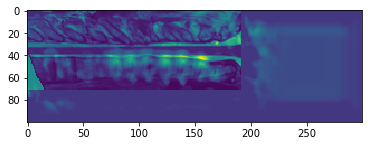

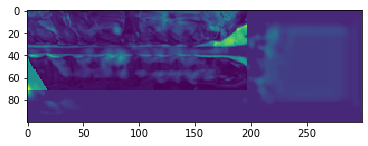

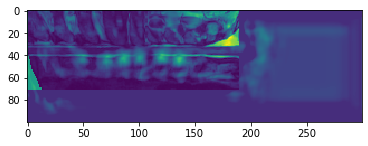

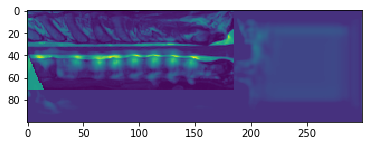

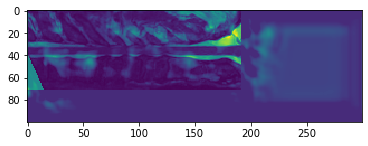

...

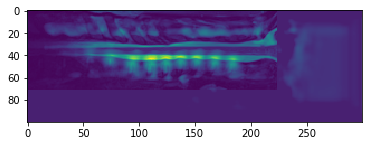

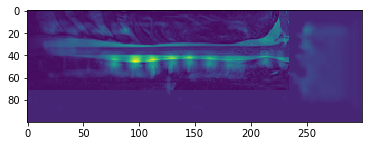

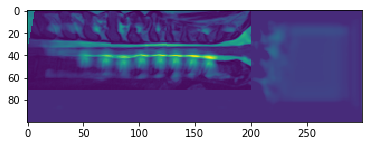

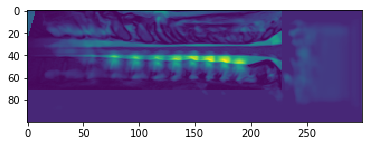

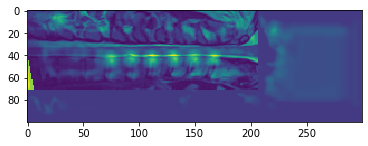

In [33]:
val_loss_total=0
for i, batch in enumerate(train_loader):
            input_samples, gt_samples = batch[0], batch[1]
            

            with torch.no_grad():
                
                var_input = input_samples.cuda()
                var_gt = gt_samples.cuda()
              
                    

                preds = model(var_input)

                loss = caffe_eucl_loss(preds, var_gt)
                val_loss_total += loss.item()
                
                predi=preds.data.cpu().numpy()
                gt_s=var_gt.data.cpu().numpy()
                inpu=var_input.data.cpu().numpy()
                for i in range(len(predi)):
                    overlay0=np.add(predi[i,0,:,:]*5,inpu[i,0,:,:]*1)
                    plt.imshow(overlay0)
                    plt.show()
               # overlay1=np.add(predi[1,0,:,:]*10,inpu[1,0,:,:]*1)
               # plt.imshow(overlay1)
               # plt.show()

            # Metrics computation
            #gt_npy = gt_samples.data.cpu().numpy().astype(np.uint8)
            #gt_npy = gt_npy.squeeze(axis=1)

            #preds = preds.data.cpu().numpy()
           # preds = threshold_predictions(preds)
           # preds = preds.astype(np.uint8)
           # preds = preds.squeeze(axis=1)
	   #loss=dice_loss(preds,gt_npy)
	   #val_loss_total += loss.item()
           # np.save('result.npy',preds)
           # np.save('gt.npy',gt_npy)
           # input_npy=var_input.data.cpu().numpy()
          #  np.save('input.npy',input_npy)

           # metric_mgr(preds, gt_npy)

           

       # metrics_dict = metric_mgr.get_results()
       # metric_mgr.reset()

       # writer.add_scalars('metrics', metrics_dict, epoch)

            #val_loss_total_avg = val_loss_total / num_steps
        
       
        

In [ ]:
plt.imshow(test[0,0,:,:])

In [ ]:
import nibabel as nib

In [ ]:
path_to='/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/deep_VL_2019/flatten_sag.nii'

In [ ]:
testing_im=nib.load(path_to)

In [ ]:
testing_im=np.array(testing_im.dataobj)

In [ ]:
testing_im.shape

In [ ]:
testing_im=testing_im[64,:,:]

In [ ]:
testing_im=np.expand_dims(testing_im,axis=-1)

In [ ]:
import skimage

In [ ]:
testing_im=testing_im*255*255

In [ ]:
testing_im=testing_im.astype('uint16')

In [ ]:
preds[0][0].size()[0]

In [ ]:
index= preds[0][0].argmax()
rows = index / 40
cols = index % 40
print(preds[0][0][rows,cols])

In [ ]:
a=(torch.abs((torch.max(preds[0][0]).item()-preds[0][0]))<0.006).nonzero()

In [ ]:
lis_p=(torch.abs((torch.max(var_gt[0][0]).item()-var_gt[0][0]))<0.006).nonzero()

In [ ]:
var_gt[0][0]

In [ ]:
((torch.max(var_gt[0][0]).item()-var_gt[0][0])<0.004).nonzero()

In [ ]:
var_gt[0][0][100,361]

In [ ]:
def loss_spinal_cord(y_true,y_pred):
    loss=torch.tensor(0)
    for i in range (y_true.size()[0]):
        print(i)
        
        list_true=(torch.abs((torch.max(y_true[i][0]).item()-y_true[i][0]))<0.004).nonzero()
        list_pred=(torch.abs((torch.max(y_pred[i][0]).item()-y_pred[i][0]))<0.004).nonzero()

        if list_true.size()==torch.Size([0, 0]):
            pass
        else:
            #print(list_true)
            x_true=list_true[:,0]
            x_pred=list_pred[:,0]
            print(x_pred)
            diff=(torch.abs((torch.max(x_true).item()-x_pred))>5).nonzero()
            print(diff)
    

In [ ]:
def loss_number_of_point(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
       # print(i)
        
        list_true=(torch.abs((y_true[i][0]-torch.max(y_true[i][0]).item()))<0.00001).nonzero()
        list_pred=(torch.abs((y_pred[i][0]-torch.max(y_pred[i][0]).item()))<10).nonzero()
        #print(list_true)
        if list_pred.size()[0]<list_true.size()[0]:
            loss=torch.tensor([float(list_true.size()[0]-list_pred.size()[0])],requires_grad=True)
            print(loss.item())
            loss_tot=torch.cat((loss_tot,loss))
        else:
            loss=torch.tensor([1.0],requires_grad=True)
            loss_tot=torch.cat((loss_tot,loss))
    #requires_grad_(requires_grad=True) → loss_tot
    return(loss_tot)

In [ ]:
testing_coord=ds[1][0]

In [ ]:
testing_coord

In [ ]:
def test_label2mask(data, c_dx = 0, c_dy = 0, radius = 10, normalize = False):
    """
    Generate a Mask map from the coordenates
    :param M, N: dimesion of output
    :param position: position of the label
    :param radius: is the radius of the gaussian function
    :return: a MxN normalized array
    """

    # Our 2-dimensional distribution will be over variables X and Y
    (M,N)=(512,512)
    if len(data)<=2:
        data = [data]

    maskMap = []
    for index, value in enumerate(data):
        x,y = value

        #Correct the labels
        #x = x + c_dx
        #y = y + c_dy

        X = np.linspace(0, M - 1, M)
        Y = np.linspace(0, N - 1, N)
        X, Y = np.meshgrid(X, Y)
        # Pack X and Y into a single 3-dimensional array
        pos = np.empty(X.shape + (2,))
        pos[:, :, 0] = X
        pos[:, :, 1] = Y
        print(pos)

        # Mean vector and covariance matrix
        mu = np.array([x, y])
        Sigma = np.array([[radius, 0], [0, radius]])

        # The distribution on the variables X, Y packed into pos.
        Z = multivariate_gaussian(pos, mu, Sigma)

        # Normalization
        if normalize:
            Z = Z * (1 / np.max(Z))
        else:
            # 8bit image values (the loss go to inf+)
            Z = Z * (1 / np.max(Z))
            Z = np.asarray(Z * 255, dtype=np.uint8)

        maskMap.append(Z)

    if len(maskMap) == 1:
        maskMap = maskMap[0]

    return np.asarray(maskMap)

In [ ]:
testing = test_label2mask(ds[1][0][1:3], radius = 10, normalize = True)

In [ ]:
l

In [ ]:
test=gt_s[0,0,:500,:500]>0.8

In [ ]:
plt.imshow(gt_s[0,0,:500,:500])

In [ ]:
predi[0,0,:,:].max()

In [ ]:
loss_ivdist(var_gt,preds)

In [ ]:
def loss_ivdist(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
        #print(i)
        
        list_true=(torch.abs((y_true[i][0]-torch.max(y_true[i][0]).item()))<0.00001).nonzero()
        list_pred=(torch.abs((y_pred[i][0]-torch.max(y_pred[i][0]).item()))<0.04).nonzero()
        #print(list_true)
        #print(list_pred)
        if list_true.size()==torch.Size([0, 0]):
            pass
        else:
            c=0
            for j in range (list_pred.size()[0]-1):
                if (list_pred[j][1]-list_pred[j+1][1])<4:
                    loss=torch.tensor([1.0],requires_grad=True)
                    loss_tot=torch.cat((loss_tot,loss))
    #requires_grad_(requires_grad=True) → loss_tot
    return(torch.sum(loss_tot))

In [ ]:
np.nonzero((abs((full[1][0].max()-full[1][0]))<0.011))

In [ ]:
plt.imshow(full[1][0][:,:,0])

In [ ]:
full[1][0].max()

In [ ]:

flatten_sagittal('/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/t2.nii.gz','/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/t2_centerline.nii.gz')


In [ ]:
pwd

In [ ]:
a=get_x_label_coordenates_list(ds[1],5)

In [ ]:
tmp_train_img=[]
tmp_train_labels=[]
t=os.listdir('PolyDatabase_2')
t.sort()
t.remove('.DS_Store')
for lbs in range(len(ds[1])):
    if get_x_label_coordenates_exist(ds[1][lbs], 5):
                tmp_train_img.append(ds[0][lbs])
                tmp_train_labels.append(ds[1][lbs])
    else:
            print(lbs)
            print(t[516+lbs])

In [ ]:
for x in range (3,14):
    for lbs in range(len(tmp_train_labels)):
        var=get_x_label_coordenates_exist(tmp_train_labels[lbs],x)
        if var :
            pass
        else:
            

In [ ]:
len(ds[0])

In [ ]:
for lbs in range(len(ds[1])):
    if get_x_label_coordenates_exist(ds[1][lbs], 5):
                tmp_train_img.append(ds[0][lbs])
                tmp_train_labels.append(ds[1][lbs])
    else:
            print(lbs)
         
       

In [ ]:
t=os.listdir('PolyDatabase_2')

In [ ]:
t.sort()

In [ ]:
t[513]

In [ ]:
import dsntnn

In [ ]:
class CoordRegressionNetwork(nn.Module):
    def __init__(self, n_locations):
        super().__init__()
        self.net = model
        self.hm_conv = nn.Conv2d(1, n_locations, kernel_size=1, bias=False)

    def forward(self, images):
        # 1. Run the images through our FCN
        image=transforms.ToTensor()(images).unsqueeze(0).cuda()
        net_out = self.net(image)
        # 2. Use a 1x1 conv to get one unnormalized heatmap per location
        
        # 3. Normalize the heatmaps
        
        # 4. Calculate the coordinates
        coords = nn.Linear(10, 2)(net_out).cuda()

        return coords, heatmaps

In [ ]:
import matplotlib.pyplot as plt
import scipy.misc

In [ ]:
model_coord = CoordRegressionNetwork(n_locations=2)
model_coord=model_coord.double()
model_coord=model_coord.cuda()

In [ ]:
coords, heatmaps = model_coord(ds[0][1])

In [ ]:
%matplotlib inline

In [ ]:
plt.imshow(heatmaps.data.cpu()[0,0,:,:])

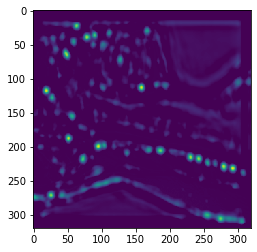

/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from float32 to uint16
  .format(dtypeobj_in, dtypeobj_out))


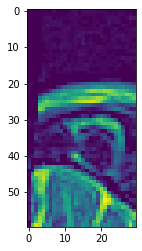

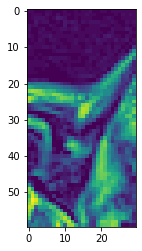

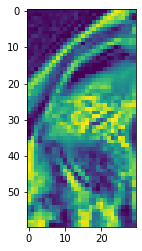

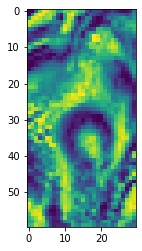

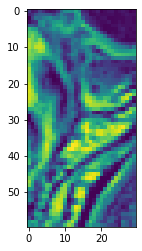

...

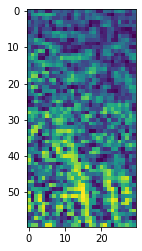

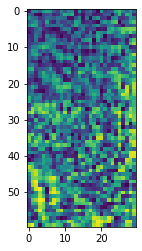

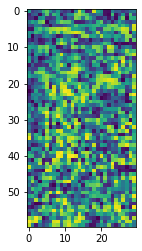

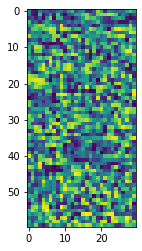

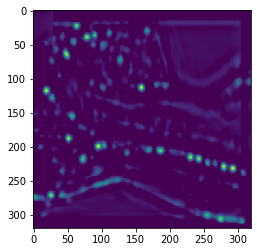

In [620]:
testing_im=nib.load('/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/t2_flatten.nii.gz')
testing_arr=np.array(testing_im.dataobj)
mid=int(np.round(testing_arr.shape[0]/2))
images=testing_arr[mid,:,:]

images=np.rot90(images,k=2,axes=(0,1))
images=normalize(images)
#images=skimage.exposure.equalize_adapthist(normalize(images), kernel_size=None, clip_limit=0.02)
images=np.expand_dims(images,axis=-1)
image=transforms.ToTensor()(images).unsqueeze(0).cuda()
image=image.double()
net_out = model(image)
net_out=net_out.data.cpu().numpy()
plt.imshow(np.add(net_out[0,0,:,:]*100,images[:,:,0]))
plt.show()
coordinates = peak_local_max(net_out[0,0,:,:],min_distance=1, threshold_rel=0.7)
final=infer(images,[[25,0]],net_out)
coordinates = peak_local_max(final[0,0,:,:],min_distance=1, threshold_rel=0.6)
plt.imshow(final[0,0,:,:]*10)
plt.show()

In [32]:
import copy

In [83]:
coord_gt=[]
for i in range (len(ds[1])):
    coord_tmp=[[],[]]
    for j in range(len(ds[1][i])):
        if ds[1][i][j][3]==1 or ds[1][i][j][3]>30:
            pass
        else:
            coord_tmp[0].append(ds[1][i][j][2])
            coord_tmp[1].append(ds[1][i][j][1])
    coord_gt.append(coord_tmp)

In [99]:
coord_gt

[[[146, 129, 114, 96, 82, 64, 44], [43, 43, 43, 39, 42, 44, 40]],
 [[155, 138, 121, 105, 91, 78, 62, 42], [45, 43, 43, 42, 43, 43, 42, 42]],
 [[150, 132, 115, 100, 83, 71, 54, 36], [44, 41, 41, 39, 42, 41, 41, 40]],
 [[158, 136, 119, 100, 85, 69, 48, 28], [44, 43, 41, 42, 43, 43, 42, 40]],
 [[146, 130, 113, 94, 79, 61, 44], [44, 41, 41, 42, 43, 43, 43]],
 [[147, 125, 106, 86, 71, 57, 37], [43, 39, 40, 40, 41, 43, 41]],
 [[126, 105, 88, 70, 53, 37], [41, 41, 42, 42, 42, 41]],
 [[146, 132, 90, 72, 52, 33], [45, 42, 42, 41, 39, 41]],
 [[145, 128, 112, 96, 80, 65], [45, 44, 44, 41, 43, 43]],
 [[141, 122, 108, 87, 75, 64, 44], [48, 43, 42, 43, 43, 46, 43]],
 [[143, 122, 106, 90, 75, 62, 43], [44, 42, 42, 42, 42, 44, 43]],
 [[147, 129, 114, 100, 83, 70, 50], [43, 40, 42, 40, 41, 43, 43]],
 [[135, 116, 98, 81, 67, 51, 34], [44, 43, 43, 43, 45, 46, 43]],
 [[139, 120, 102, 87, 73, 57, 40], [42, 42, 41, 42, 43, 42, 42]],
 [[150, 135, 119, 105, 89, 74, 58, 38], [44, 42, 42, 41, 42, 41, 40, 39]],


In [33]:
optimizer = optim.RMSprop(model.parameters(), lr=2.5e-4)
hard=[]
c=0
compteur_bonus=0
for i in range(len(ds[0])):
    # Forward pass
    #images= ds[0][i]
    coordinates= final_function_2(ds[0][i][:,:,:])
    print(coordinates)
    coordinates_x=[x[0] for x in coordinates]
    coordinates_y=[x[1] for x in coordinates]
    coordinates_2=np.array([coordinates_x,coordinates_y])
    #print(torch.tensor(coord_gt[i])[:,:x])
   # image=transforms.ToTensor()(images).unsqueeze(0).cuda()
    #net_out = model(image)
   # net_out=net_out.data.cpu().numpy()
   
    #coordinates = peak_local_max(net_out[0,0,:,:],min_distance=1, threshold_rel=0.7)
    
    euc_loss,missing=spec_eucl_loss_2(coord_gt[i],np.array(coordinates))
    if missing>0:
        hard.append(i)
      
    # Per-location regularization losses
    #reg_losses = dsntnn.js_reg_losses(heatmaps, torch.tensor(coord_gt[i])[:,:x].double().cuda(), sigma_t=1.0)
    # Combine losses into an overall loss
    print('before patch inference')
    print(euc_loss)
    print('after_patch')
    
    #if len(coordinates)>1:
     #   final=infer(images,coordinates,net_out)
      #  coordinates = peak_local_max(final[0,0,:,:],min_distance=1, threshold_rel=0.6)
     #   plt.imshow(np.add(final[0,0,:,:]*10,images[:,:,0]))
      #  plt.show()
      #  euc_loss,missingp=spec_eucl_loss_2(coord_gt[i],coordinates)
      #  if missing>missingp:
       #     compteur_bonus=compteur_bonus+1
      #  if missingp>0:
      #      c=c+1
      #  print(euc_loss)
    
# Predictions after training
print(compteur_bonus)
#plt.imshow(heatmaps[0, 0].detach().cpu().numpy())
#plt.show()

NameError: name 'final_function_2' is not defined

In [109]:
print(c/len(ds[0]))
print(compteur_bonus)
print(c)

0.0
0
0


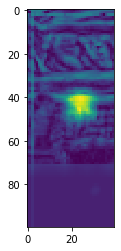

In [34]:
plt.imshow(ds[0][0,:,90:120,0])
patch=skimage.exposure.equalize_adapthist(normalize(ds[0][0,:,90:130,0]), kernel_size=5, clip_limit=0.02)
plt.imshow(patch)
patch_t=np.expand_dims(patch,axis=-1)
patch_t=transforms.ToTensor()(patch_t).unsqueeze(0).cuda()
patch_out= model(patch_t)
patch_out=patch_out.data.cpu().numpy()
plt.imshow(np.add(patch_out[0,0,:,:]*2,patch))

In [ ]:
image=transforms.ToTensor()(ds[0][0]).unsqueeze(0).cuda()
net_out = model(image)
net_out=net_out.data.cpu().numpy()

In [ ]:
a=abs(net_out[0,0,:,:]-net_out[0,0,:,:].max())<0.1

In [35]:
import numpy as np
from skimage.feature import peak_local_max

In [ ]:
coordinates = peak_local_max(net_out[0,0,:,:],min_distance=1, threshold_rel=0.9)

In [ ]:
net_out[0,0,:,:].max()

In [36]:

def spec_eucl_loss_2(y_true,y_pred):
   
    loss=0
    for i in range (len(y_pred)):
        x=y_pred[i]
        my_num=x[1]
        res=min(y_true[0], key=lambda x:abs(x-my_num))
        test_i=y_true[0].index(res)
        real_disc=[y_true[1][test_i],y_true[0][test_i]]
        loss=loss+np.linalg.norm(real_disc-x)
    a=len(y_true[0])-len(y_pred)

    print('missing point'+ str(len(y_true[0])-len(y_pred)))
    return (loss,a)

In [ ]:
images= ds[0][9]
image=transforms.ToTensor()(images).unsqueeze(0).cuda()
net_out = model(image)
net_out=net_out.data.cpu().numpy()
plt.imshow(np.add(net_out[0,0,:,:],images[:,:,0]))
plt.show()
coordinates = peak_local_max(net_out[0,0,:,:],min_distance=1, threshold_rel=0.9)
print(coordinates)
sorted(coordinates,key = lambda x: x[0])
print(len(coordinates))
print(coordinates)
final=infer(images,coordinates,net_out)   
coordinates = peak_local_max(final[0,0,:,:],min_distance=1, threshold_rel=0.9)
print(len(coordinates))
print(coordinates)
plt.imshow(np.add(final[0,0,:,:]*10,images[:,:,0]))
plt.show()


In [37]:
 def infer(image,coordinates,curr_heatmap):
        
        final=copy.deepcopy(curr_heatmap)
        #retrieve coordinates of extreme point
        coordinates.sort()
        originx=coordinates[-1][0]
        #originx=6
        originy=15
        sorted(coordinates,key = lambda x: x[0])
        maxdifx=abs(coordinates[0][0]-coordinates[-1][0])
        if maxdifx<45:
            maxdifx=45
        while originy+30< image.shape[0]:
            #print(originy)
            patch=image[originx-15:originx+maxdifx,originy-15:originy+15,0]
            path=normalize(patch)
            patch=skimage.exposure.equalize_adapthist(normalize(patch), kernel_size=10, clip_limit=0.02)
            plt.imshow(patch)
            plt.show()
            patch=np.expand_dims(patch,axis=-1)
            patch=transforms.ToTensor()(patch).unsqueeze(0).cuda()
            patch_out= model(patch)
            patch_out=patch_out.data.cpu().numpy()
            for w in range (maxdifx):
                for h in range(30):
                    final[0,0,w,h]=max(final[0,0,originx+w,originy+h],patch_out[0,0,w,h])
            #final[0,0,originx-5:originx+80,originy-25:originy+50]=patch_out[0,0,:,:]
            originy=originy+20
        return (final)
            
    
    #infer on patches and modify output 
    #retake the coordinates
    #output it
    # Per-location euclidean losses

In [ ]:
plt.imshow(images[200:300,:100,0])

In [38]:
def load_Data_just_check(im_path):
    size_val = 512
    ds_image=[]
    ds_label=[]
   # list_dir=os.listdir(DataSet_path)
    #list_dir.sort()
   # if '.DS_Store' in list_dir:
       # list_dir.remove('.DS_Store')
   # a=len(list_dir)
   # for i in range (a):
    #path_tmp=DataSet_path
       
    im=nib.load(im_path)
    arr=np.array(im.dataobj)
    slics=int(np.round(arr.shape[0]/2))
    mid_slice=get_midNifti(im_path,slics)
    print(mid_slice.shape)
   # if mid_slice.shape[0]>512:
     #   print('removed')
    #    pass
   # elif mid_slice.shape[1]>512:
   #     print('removed')
  #      pass
  #  else:
    ds_image.append(mid_slice)
           
    
    ds_image = images_normalization(ds_image)
    

    # Zero padding
    #ds_image = add_zero_padding(ds_image, x_val=size_val, y_val=size_val)
    #val_ds_img = add_zero_padding(val_ds_img, x_val=size_val, y_val=size_val)
    #test_ds_img = add_zero_padding(test_ds_img, x_val=size_val, y_val=size_val)

    # Convert images to np.array
    ds_image = np.array(ds_image)
        
        
    return [ds_image,ds_label] 

In [115]:
mid_check=load_Data_just_check('/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/t2_straight.nii.gz')

(87, 241)


In [113]:
import SimpleITK as sitk
def N4():
    print("N4 bias correction runs.")
    inputImage = sitk.ReadImage('/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/t2_straight.nii.gz')
    # maskImage = sitk.ReadImage("06-t1c_mask.nii.gz")
    maskImage = sitk.OtsuThreshold(inputImage,0,1,500)
    #sitk.WriteImage(maskImage, "06-t1c_mask3.nii.gz")

    inputImage = sitk.Cast(inputImage,sitk.sitkFloat32)

    corrector = sitk.N4BiasFieldCorrectionImageFilter();

    output = corrector.Execute(inputImage,maskImage)
    out=np.array(output.dataobj)
    plt.imshow(out[45,:,:])
    plt.show()
    #sitk.WriteImage(output,"N4_output3.nii.gz")
    print("Finished N4 Bias Field Correction.....")


In [114]:
N4()

N4 bias correction runs.


SystemError: <built-in function N4BiasFieldCorrectionImageFilter_Execute> returned a result with an error set

In [ ]:
%matplotlib inline
test=skimage.exposure.equalize_adapthist(normalize(full[0][7][40:,75:125,0]),kernel_size=10,clip_limit=0.00001)
test=np.expand_dims(test,axis=-1)
images=test
image=transforms.ToTensor()(images).unsqueeze(0).cuda()
net_out = model(image)
net_out=net_out.data.cpu().numpy()
plt.imshow(np.add(net_out[0,0,:,:]*1,images[:,:,0]))
plt.show()

In [93]:
def infer_straight(image,c=0.02):
        coord_out=[]
        shape_im=image.shape
        
        final=np.zeros((shape_im[0],shape_im[1]))
        shape_im=sorted(shape_im)
        #retrieve coordinates of extreme point
        #coordinates.sort()
       # originx=coordinates[-1][0]
        #originx=6
        originy=0
        image=normalize(image[:,:,0])
        print(image.shape)
        while originy+31< shape_im[2]:
            #print(originy)
            patch=image[:,originy:originy+30]
            patch=normalize(patch)
            patch=skimage.exposure.equalize_adapthist(patch,kernel_size=10,clip_limit=c)
            
            patch=np.expand_dims(patch,axis=-1)
            patch=Ying_2017_CAIP(patch)
            patch=transforms.ToTensor()(patch).unsqueeze(0).cuda()
            patch=patch.double()
            patch_out= model(patch)
            patch_out=patch_out.data.cpu().numpy()
           
            coordinates_tmp= peak_local_max(patch_out[0,0,:,:],min_distance=1, threshold_rel=0.4)
            for w in range (final.shape[0]):
                for h in range(0,30):
                    final[w,originy+h]=max(final[w,originy+h],patch_out[0,0,w,h])
            #final[0,0,originx-5:originx+80,originy-25:originy+50]=patch_out[0,0,:,:]
            
            for x in coordinates_tmp:
                x[1]=x[1]+originy
                
                coord_out.append([x[1],x[0]])
            #coord_out.append(coordinates_tmp)
            originy=originy+10
            #print(originy)
        #print(coord_out)
        return (final,coord_out)

In [ ]:
import skimage

In [468]:
final.shape

(87, 241)

In [82]:
final,coordinates=infer_straight(mid_check[0])

(87, 241)


/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/ipykernel_launcher.py:123: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


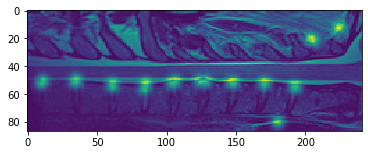

In [85]:
plt.imshow(np.add(final[0,:,:],50*mid_check[0][0,:,:]))

In [84]:
shape=(1,87, 241)
final=np.zeros(shape)
for x in coordinates:
    
    train_lbs_tmp_mask=label2MaskMap_2(x,shape)
    for w in range (shape[1]):
                for h in range(shape[2]):
                    final[0,w,h]=max(final[0,w,h],train_lbs_tmp_mask[w,h])

In [55]:

test=[]
patch=normalize(patch[:,:,0])
test.append(patch)
#patch_2=skimage.exposure.match_histograms(patch,full[0][0][:,125:200,0])
patch_2 = skimage.exposure.adjust_log(patch, 100)
test.append(patch_2)
patch_3=skimage.exposure.equalize_hist(patch)
patch_4=skimage.exposure.equalize_hist(patch_2)
test.append(patch_3)
test.append(patch_4)



In [63]:
test.append(resultat)

In [68]:
for im in test:
    im=np.expand_dims(im,axis=-1)
    final,coordinates=infer_straight(im,c=0.02)
    final=np.zeros((100,50,1))
    print(full[0][0].shape)
    for x in coordinates:
        print(x)
    
        train_lbs_tmp_mask=label2MaskMap_2(x,(1,100,50))
        for w in range (im.shape[0]):
            for h in range(im.shape[1]):
                final[w,h,0]=max(final[w,h,0],train_lbs_tmp_mask[w,h])
    plt.imshow(np.add(final[:,:,0]*0,im[:,:,0]))
    plt.show()
    

(100, 50)
(100, 300, 1)
[79, 44]
[92, 43]
[92, 44]
[105, 42]


IndexError: too many indices for array

(100, 50)
(100, 300, 1)
[79, 44]
[91, 43]
[92, 44]
[105, 42]


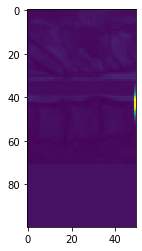

In [70]:
final,coordinates=infer_straight(resultat,c=0.02)
final=np.zeros((100,50,1))
print(full[0][0].shape)
for x in coordinates:
    print(x)
    
    train_lbs_tmp_mask=label2MaskMap_2(x,(1,100,50))
    for w in range (im.shape[0]):
         for h in range(im.shape[1]):
            final[w,h,0]=max(final[w,h,0],train_lbs_tmp_mask[w,h])
plt.imshow(np.add(final[:,:,0]*10,resultat[:,:,0]))
plt.show()

In [65]:
def label2MaskMap_2(data,shape, c_dx = 0, c_dy = 0, radius = 10, normalize = False):
    """
    Generate a Mask map from the coordenates
    :param M, N: dimesion of output
    :param position: position of the label
    :param radius: is the radius of the gaussian function
    :return: a MxN normalized array
    """

    # Our 2-dimensional distribution will be over variables X and Y
    (M,N)=(shape[2],shape[1])
    if len(data)<=2:
        data = [data]

    maskMap = []
    for index, value in enumerate(data):
        x,y = value

        #Correct the labels
        x = x + c_dx
        y = y + c_dy

        X = np.linspace(0, M - 1, M)
        Y = np.linspace(0, N - 1, N)
        X, Y = np.meshgrid(X, Y)
        # Pack X and Y into a single 3-dimensional array
        pos = np.empty(X.shape + (2,))
        pos[:, :, 0] = X
        pos[:, :, 1] = Y

        # Mean vector and covariance matrix
        mu = np.array([x, y])
        Sigma = np.array([[radius, 0], [0, radius]])

        # The distribution on the variables X, Y packed into pos.
        Z = multivariate_gaussian(pos, mu, Sigma)

        # Normalization
        if normalize:
            Z = Z * (1 / np.max(Z))
        else:
            # 8bit image values (the loss go to inf+)
            Z = Z * (1 / np.max(Z))
            Z = np.asarray(Z * 255, dtype=np.uint8)

        maskMap.append(Z)

    if len(maskMap) == 1:
        maskMap = maskMap[0]

    return np.asarray(maskMap)

In [87]:
def final_function(Image):
    shape_im=Image.shape
    shape_im=sorted(shape_im)
    final,coordinates=infer_straight(Image)
    final=np.zeros(shape_im)
    print('before post_proc')
    for x in coordinates:
    
        train_lbs_tmp_mask=label2MaskMap_2(x,shape_im)
        #plt.imshow(train_lbs_tmp_mask)
        #plt.show()
        for w in range (shape_im[1]):
                    for h in range(shape_im[2]):
                        final[0,w,h]=max(final[0,w,h],train_lbs_tmp_mask[w,h])
    plt.imshow(np.add(final[0,:,:]*1,30*Image[:,:,0]))
    plt.show()
    print('after post_proc')
    final=np.zeros(shape_im)
    coord_out=post_processing(coordinates)
    for x in coord_out:
    
        train_lbs_tmp_mask=label2MaskMap_2(x,shape_im)
        #plt.imshow(train_lbs_tmp_mask)
        #plt.show()
        for w in range (shape_im[1]):
                    for h in range(shape_im[2]):
                        final[0,w,h]=max(final[0,w,h],train_lbs_tmp_mask[w,h])
    plt.imshow(np.add(final[0,:,:,]*1,30*Image[:,:,0]))
    plt.show()

before post_proc


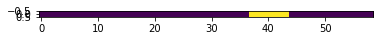

after post_proc
[[10, 40], [39, 37], [39, 36], [68, 37], [69, 37], [69, 37], [71, 36], [102, 39], [102, 39], [103, 38], [134, 41], [132, 41], [163, 44], [164, 44], [163, 44], [190, 43], [190, 43], [191, 42], [206, 34], [236, 37], [237, 36], [267, 39], [273, 40], [270, 39], [271, 38], [301, 41], [301, 42], [302, 41]]
[1]
[3]
[3, 4]
[3, 4, 5]
[7]
[7, 8]
[10]
[12]
[12, 13]
[15]
[15, 16]
[19]
[21]
[21, 22]
[21, 22, 23]
[25]


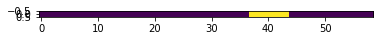

In [87]:
final_function(mid_check[0])

In [74]:
path='/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/straight_t2_post_handseg/'

In [283]:
list_str=os.listdir('/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/straight_t2_post_handseg/')
if '.DS_Store' in list_str:
    list_str.remove('.DS_Store')
for x in list_str:
    path_tmp=path+x
    mid_check=load_Data_just_check(path_tmp)
    final_function(mid_check[0][:,:,:])

(59, 365)


/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


ValueError: zero-size array to reduction operation maximum which has no identity

0
(100, 200)


/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/ipykernel_launcher.py:123: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


before post_proc


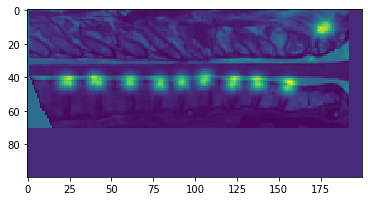

after post_proc
[[24, 43], [24, 43], [42, 43], [23, 43], [40, 42], [61, 43], [61, 43], [79, 44], [79, 44], [92, 43], [92, 43], [92, 43], [105, 42], [122, 44], [106, 41], [122, 44], [137, 43], [137, 44], [123, 43], [155, 46], [138, 44], [155, 46], [156, 45], [176, 12], [178, 11]]
[0]
-1
[0, 1]
[3]
[5]
[7]
[9]
0
[9, 10]
[12]
[14]
-1
[14, 15]
[17]
-1
[17, 18]
[20]


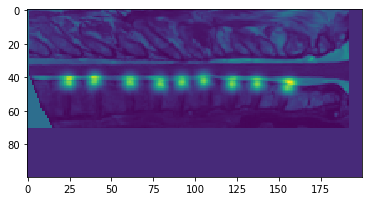

1
(100, 200)
before post_proc


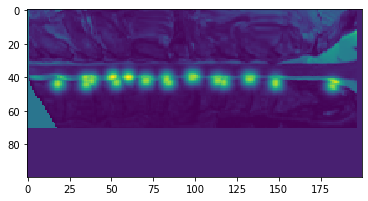

after post_proc
[[35, 44], [18, 44], [35, 42], [53, 43], [38, 42], [60, 40], [51, 40], [70, 42], [83, 42], [71, 42], [84, 43], [83, 41], [98, 40], [113, 42], [99, 40], [114, 42], [117, 43], [132, 41], [148, 43], [132, 41], [148, 44], [133, 41], [148, 44], [182, 45]]
[1]
-3
[1, 2]
[4]
[7]
[9]
-1
[9, 10]
[12]
[14]
-4
[14, 15]
[17]
-1
[17, 18]
[20]
0
[20, 21]


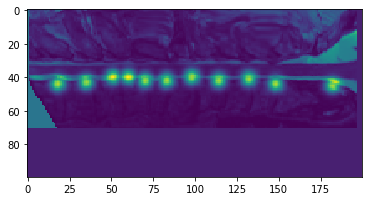

2
(100, 200)
before post_proc


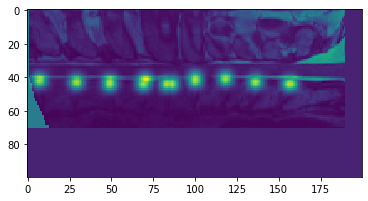

after post_proc
[[7, 42], [29, 43], [29, 43], [49, 44], [49, 43], [70, 42], [83, 44], [69, 44], [86, 44], [100, 42], [100, 41], [118, 41], [118, 41], [136, 43], [136, 43], [156, 44], [157, 44]]
[1]
[3]
[5]
[7]
[9]
[11]
[13]


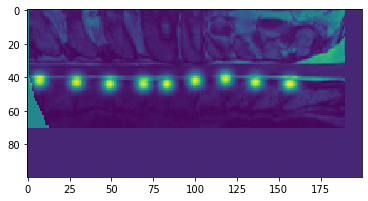

3
(100, 200)
before post_proc


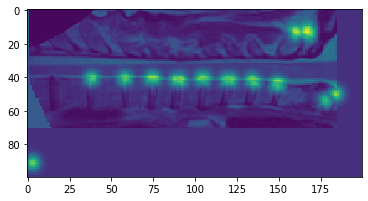

after post_proc
[[3, 91], [38, 41], [58, 41], [74, 41], [58, 41], [75, 41], [89, 42], [74, 41], [90, 42], [105, 41], [91, 42], [105, 41], [119, 42], [104, 41], [135, 43], [119, 42], [135, 43], [121, 42], [149, 44], [134, 42], [149, 45], [160, 14], [178, 54], [184, 50], [167, 13]]
[1]
[3]
-1
[3, 4]
[6]
-2
[6, 7]
[9]
-1
[9, 10]
[12]
-2
[12, 13]
[15]
-1
[15, 16]
[18]


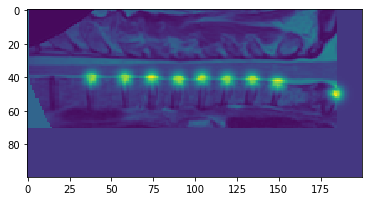

4
(100, 200)
before post_proc


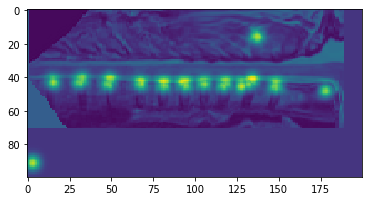

after post_proc
[[3, 91], [15, 43], [32, 42], [31, 43], [48, 44], [67, 44], [49, 42], [67, 44], [81, 45], [67, 44], [94, 45], [81, 45], [105, 44], [94, 44], [81, 44], [117, 45], [105, 44], [93, 44], [128, 45], [118, 44], [105, 44], [132, 44], [118, 44], [148, 45], [132, 44], [148, 45], [134, 42], [137, 16], [148, 46], [178, 48]]
[1]
[3]
[5]
0
[5, 6]
[8]
0
[8, 9]
[11]
-1
[11, 12]
[14]
0
[14, 15]
[17]
-1
[17, 18]
[20]
-4
[20, 21]
-6
[20, 21, 22]
[24]
0
[24, 25]


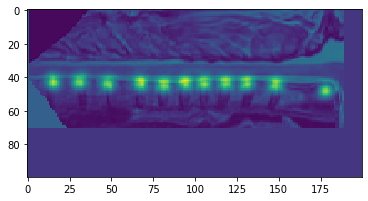

5
(100, 200)
before post_proc


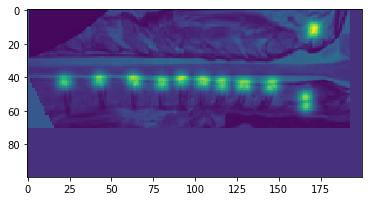

after post_proc
[[22, 43], [43, 42], [64, 43], [63, 42], [80, 44], [63, 42], [80, 44], [92, 42], [105, 43], [92, 42], [116, 45], [104, 43], [92, 42], [128, 45], [116, 44], [104, 43], [129, 45], [116, 44], [145, 46], [130, 45], [145, 46], [146, 45], [166, 57], [166, 52], [171, 13], [171, 11]]
[2]
-1
[2, 3]
[5]
[7]
0
[7, 8]
[10]
-1
[10, 11]
[13]
0
[13, 14]
[16]
-2
[16, 17]
[19]
-1
[19, 20]


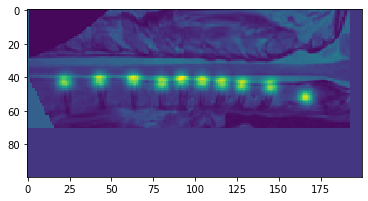

6
(100, 200)
before post_proc


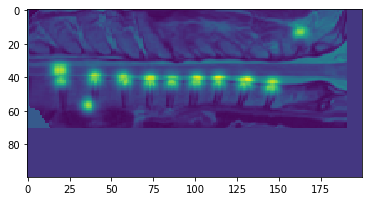

after post_proc
[[20, 42], [20, 36], [36, 57], [18, 36], [40, 40], [40, 41], [57, 41], [73, 43], [58, 42], [86, 43], [73, 43], [86, 43], [73, 42], [100, 43], [86, 43], [114, 43], [100, 43], [114, 43], [101, 42], [129, 44], [114, 42], [145, 46], [129, 44], [146, 45], [131, 43], [146, 46], [163, 13], [162, 13]]
[0]
-2
[0, 1]
[3]
[5]
[7]
0
[7, 8]
[10]
0
[10, 11]
[13]
-1
[13, 14]
[16]
0
[16, 17]
[19]
-2
[19, 20]
[22]


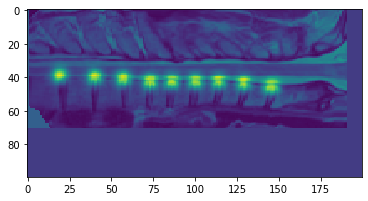

7
(100, 200)
before post_proc


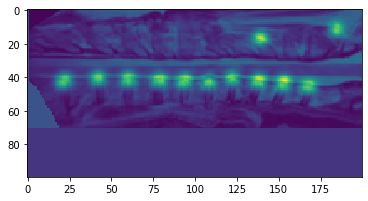

after post_proc
[[22, 42], [21, 43], [42, 41], [60, 41], [60, 42], [79, 42], [93, 43], [78, 42], [94, 42], [108, 43], [94, 42], [108, 43], [122, 41], [137, 43], [122, 41], [138, 42], [122, 41], [152, 45], [138, 43], [139, 17], [167, 46], [152, 44], [167, 46], [153, 43], [168, 46], [184, 12]]
[0]
[3]
[5]
[7]
-1
[7, 8]
[10]
[12]
0
[12, 13]
[15]
-1
[15, 16]
[18]
-1
[18, 19]
[21]


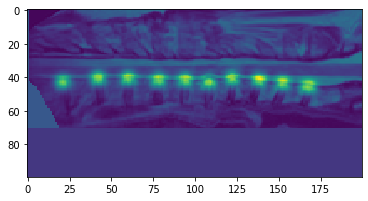

8
(100, 200)
before post_proc


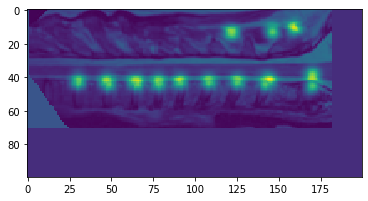

after post_proc
[[30, 43], [48, 44], [30, 43], [47, 43], [65, 44], [48, 44], [78, 44], [65, 43], [78, 43], [64, 43], [91, 43], [78, 43], [108, 43], [91, 43], [108, 43], [91, 43], [125, 43], [108, 43], [125, 43], [122, 14], [142, 44], [125, 43], [121, 14], [142, 44], [144, 42], [146, 13], [159, 11], [170, 45], [170, 39]]
[0]
[2]
-1
[2, 3]
[5]
-1
[5, 6]
[8]
0
[8, 9]
[11]
0
[11, 12]
[14]
0
[14, 15]
[17]
0
[17, 18]
[20]
-2
[20, 21]


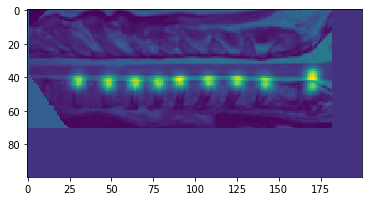

9
(100, 200)
before post_proc


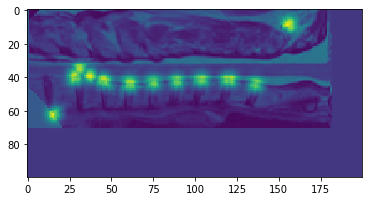

after post_proc
[[16, 62], [28, 41], [37, 39], [28, 39], [31, 35], [46, 43], [29, 41], [45, 42], [61, 45], [46, 43], [75, 44], [61, 44], [75, 44], [61, 44], [75, 44], [89, 43], [89, 43], [103, 42], [104, 42], [119, 42], [104, 42], [136, 45], [119, 42], [136, 45], [121, 42], [136, 45], [156, 9], [157, 10]]
[0]
-1
[0, 1]
-3
[0, 1, 2]
[5]
-1
[5, 6]
[8]
0
[8, 9]
[11]
0
[11, 12]
[14]
[16]
-1
[16, 17]
[19]
-2
[19, 20]
[22]


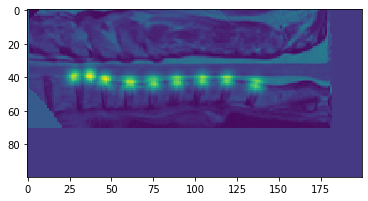

10
(100, 200)
before post_proc


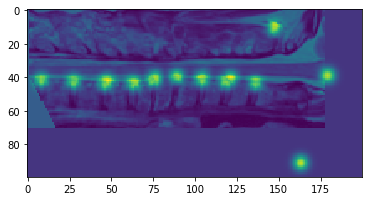

after post_proc
[[8, 42], [27, 43], [47, 43], [27, 43], [46, 44], [63, 44], [46, 44], [63, 44], [75, 42], [63, 44], [75, 42], [76, 41], [89, 40], [104, 41], [89, 40], [118, 43], [104, 42], [119, 43], [104, 41], [136, 44], [119, 43], [136, 44], [121, 41], [136, 44], [147, 11], [163, 91], [179, 39]]
[1]
[3]
-1
[3, 4]
[6]
0
[6, 7]
[9]
-1
[9, 10]
[12]
[14]
0
[14, 15]
[17]
-1
[17, 18]
-3
[17, 18, 19]
[21]
0
[21, 22]


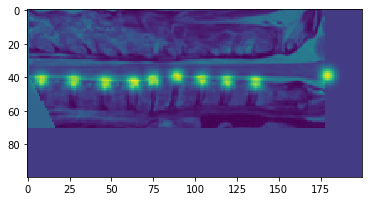

11
(100, 200)
before post_proc


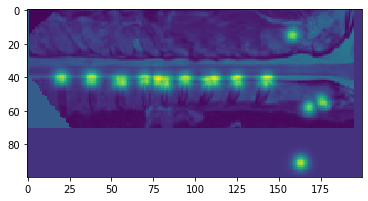

after post_proc
[[20, 41], [20, 41], [38, 42], [56, 43], [38, 41], [56, 43], [55, 43], [78, 42], [70, 42], [82, 44], [70, 42], [82, 44], [94, 42], [108, 43], [82, 43], [94, 42], [109, 43], [94, 42], [125, 43], [109, 43], [125, 43], [111, 42], [142, 43], [125, 42], [142, 43], [143, 42], [176, 55], [158, 15], [163, 91], [168, 58]]
[0]
[2]
[4]
-1
[4, 5]
[7]
[9]
-4
[9, 10]
-4
[9, 10, 11]
[13]
0
[13, 14]
[16]
-1
[16, 17]
-3
[16, 17, 18]
[20]
0
[20, 21]
[23]


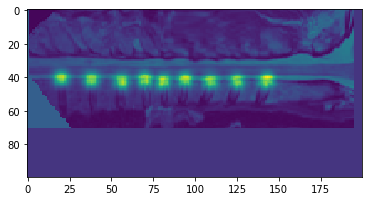

12
(100, 200)
before post_proc


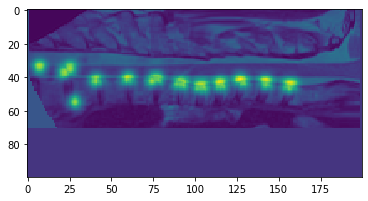

after post_proc
[[22, 37], [25, 35], [7, 34], [28, 55], [41, 42], [60, 41], [75, 42], [60, 41], [76, 41], [92, 44], [77, 41], [104, 46], [92, 44], [104, 46], [115, 45], [91, 44], [103, 46], [115, 44], [128, 43], [115, 44], [127, 42], [142, 44], [128, 43], [156, 46], [142, 44], [156, 45], [142, 43], [157, 45]]
[1]
[4]
[6]
-2
[6, 7]
[9]
-1
[9, 10]
[12]
-1
[12, 13]
[15]
0
[15, 16]
[18]
-1
[18, 19]
[21]
0
[21, 22]
[24]


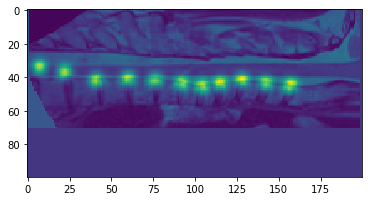

13
(100, 200)
before post_proc


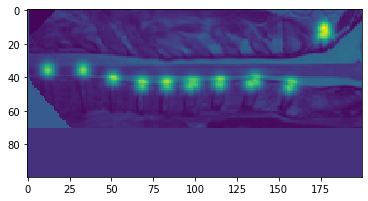

after post_proc
[[12, 36], [33, 36], [51, 41], [68, 44], [51, 41], [68, 44], [51, 41], [83, 45], [68, 45], [97, 45], [83, 45], [98, 44], [83, 44], [114, 44], [99, 44], [115, 44], [133, 44], [115, 43], [136, 43], [156, 46], [136, 42], [157, 45], [157, 45], [178, 13], [177, 15], [177, 11]]
[2]
0
[2, 3]
[5]
0
[5, 6]
[8]
0
[8, 9]
[11]
-2
[11, 12]
[14]
-1
[14, 15]
[17]
-3
[17, 18]
[20]


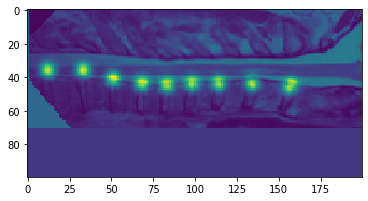

14
(100, 200)
before post_proc


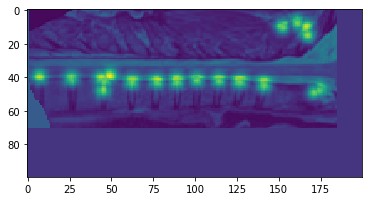

after post_proc
[[7, 40], [45, 42], [26, 41], [45, 48], [44, 41], [49, 39], [62, 43], [46, 42], [77, 43], [62, 43], [77, 43], [62, 43], [77, 43], [89, 42], [89, 43], [101, 42], [114, 42], [101, 42], [126, 43], [114, 42], [101, 42], [126, 43], [114, 42], [141, 45], [127, 43], [141, 45], [141, 44], [171, 49], [166, 10], [152, 10], [161, 8], [174, 48], [167, 15]]
[2]
-1
[2, 3]
-2
[2, 3, 4]
-5
[2, 3, 4, 5]
[7]
0
[7, 8]
[10]
0
[10, 11]
[13]
[15]
0
[15, 16]
[18]
0
[18, 19]
[21]
-1
[21, 22]
[24]
0
[24, 25]


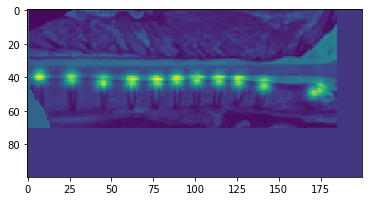

15
(100, 200)
before post_proc


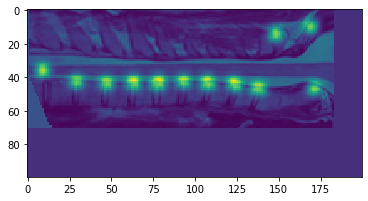

after post_proc
[[9, 36], [29, 43], [47, 44], [29, 43], [47, 44], [63, 44], [47, 44], [77, 44], [63, 44], [78, 43], [63, 43], [78, 44], [93, 43], [107, 44], [93, 43], [107, 43], [93, 43], [124, 45], [108, 44], [137, 47], [124, 45], [137, 47], [123, 44], [138, 47], [148, 15], [148, 14], [171, 47], [169, 10]]
[1]
[3]
0
[3, 4]
[6]
0
[6, 7]
[9]
-1
[9, 10]
[12]
0
[12, 13]
[15]
-1
[15, 16]
[18]
-1
[18, 19]
[21]
-1
[21, 22]


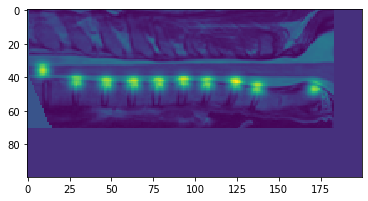

16
(100, 200)
before post_proc


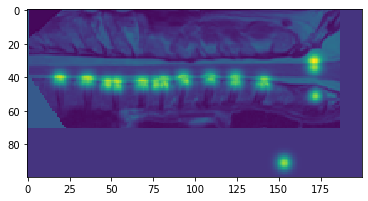

after post_proc
[[19, 41], [35, 42], [19, 41], [48, 44], [53, 45], [36, 42], [53, 45], [68, 44], [77, 44], [69, 44], [53, 44], [81, 44], [69, 44], [81, 44], [94, 42], [81, 43], [94, 42], [109, 41], [93, 41], [124, 43], [109, 41], [124, 43], [140, 44], [124, 41], [140, 44], [141, 43], [153, 91], [172, 51], [171, 34], [171, 31]]
[0]
[2]
[5]
0
[5, 6]
[8]
-1
[8, 9]
[11]
-4
[11, 12]
-4
[11, 12, 13]
[15]
-1
[15, 16]
[18]
[20]
0
[20, 21]
[23]
-1
[23, 24]


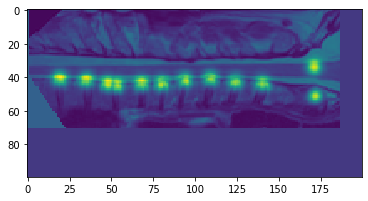

17
(100, 200)
before post_proc


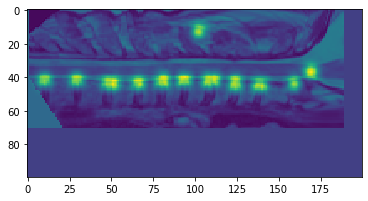

after post_proc
[[10, 42], [29, 42], [48, 44], [29, 42], [48, 44], [66, 44], [49, 44], [66, 44], [51, 44], [66, 44], [80, 43], [81, 43], [94, 42], [108, 43], [93, 42], [81, 42], [108, 42], [93, 42], [102, 13], [124, 45], [108, 43], [138, 45], [124, 44], [111, 42], [139, 45], [124, 43], [139, 45], [159, 44], [169, 37]]
[1]
[3]
-1
[3, 4]
-3
[3, 4, 5]
[7]
0
[7, 8]
[10]
-1
[10, 11]
[13]
-1
[13, 14]
[16]
0
[16, 17]
-3
[16, 17, 18]
[20]
0
[20, 21]
[23]
-1
[23, 24]


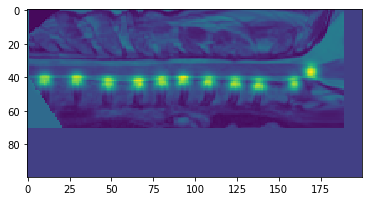

18
(100, 200)
before post_proc


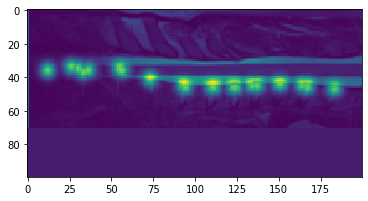

after post_proc
[[12, 36], [36, 36], [30, 35], [26, 34], [33, 37], [55, 35], [73, 41], [56, 36], [94, 46], [94, 46], [111, 46], [93, 45], [124, 46], [110, 46], [124, 46], [134, 45], [123, 46], [137, 45], [137, 45], [150, 44], [164, 45], [150, 44], [167, 46], [151, 44], [183, 47], [167, 45]]
[1]
-6
[1, 2]
[4]
[7]
-1
[7, 8]
[10]
[12]
-1
[12, 13]
[15]
-3
[15, 16]
[18]
-1
[18, 19]
[21]
-3
[21, 22]


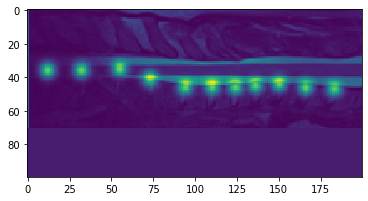

19
(100, 200)
before post_proc


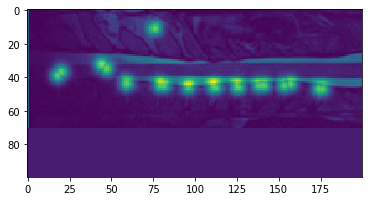

after post_proc
[[18, 39], [20, 37], [47, 35], [44, 33], [59, 44], [59, 43], [79, 45], [96, 46], [79, 44], [76, 11], [96, 46], [81, 45], [112, 46], [96, 46], [125, 46], [111, 46], [138, 45], [125, 45], [111, 45], [126, 46], [140, 45], [153, 45], [140, 45], [141, 45], [174, 47], [157, 44], [176, 47]]
[0]
[3]
[5]
-2
[5, 6]
[8]
0
[8, 9]
[11]
-1
[11, 12]
[14]
-1
[14, 15]
[17]
-2
[17, 18]
-3
[17, 18, 19]
[21]


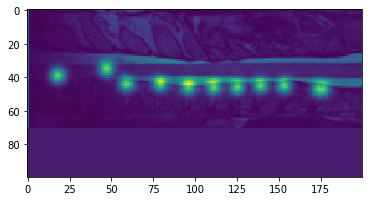

20
(100, 200)
before post_proc


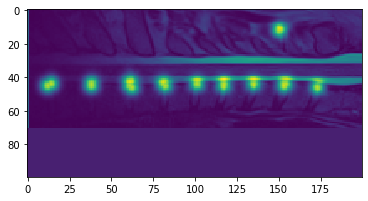

after post_proc
[[12, 45], [38, 44], [14, 44], [38, 45], [38, 44], [61, 45], [62, 46], [82, 45], [61, 43], [82, 45], [101, 44], [81, 44], [117, 44], [101, 44], [117, 45], [101, 44], [135, 44], [117, 44], [135, 44], [153, 45], [135, 44], [153, 44], [150, 12], [173, 46], [154, 44], [173, 46]]
[0]
[2]
0
[2, 3]
[5]
-1
[5, 6]
[8]
-1
[8, 9]
[11]
0
[11, 12]
[14]
0
[14, 15]
[17]
0
[17, 18]
[20]
-1
[20, 21]


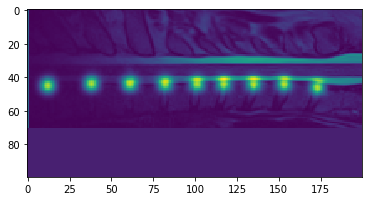

21
(100, 200)
before post_proc


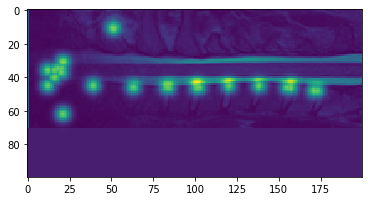

after post_proc
[[21, 62], [12, 45], [16, 40], [16, 36], [12, 36], [20, 35], [18, 35], [20, 37], [21, 31], [39, 45], [39, 45], [63, 46], [51, 11], [63, 46], [84, 46], [84, 46], [102, 46], [83, 46], [101, 46], [120, 45], [101, 45], [138, 45], [120, 45], [138, 45], [155, 46], [138, 45], [157, 46], [173, 48], [157, 45], [171, 48]]
[0]
-4
[0, 1]
-4
[0, 1, 2]
-6
[0, 1, 2, 3]
-8
[0, 1, 2, 3, 4]
-8
[0, 1, 2, 3, 4, 5]
[7]
[9]
[11]
-1
[11, 12]
[14]
-1
[14, 15]
[17]
[19]
0
[19, 20]
[22]
-2
[22, 23]


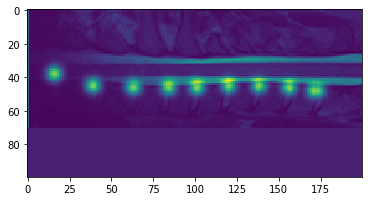

22
(100, 200)
before post_proc


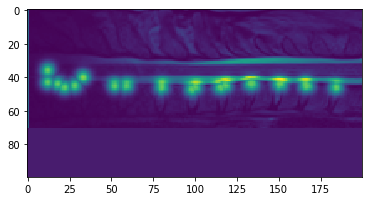

after post_proc
[[22, 46], [18, 44], [12, 43], [12, 36], [28, 45], [52, 45], [33, 40], [59, 45], [59, 45], [80, 46], [98, 47], [80, 45], [100, 46], [115, 46], [100, 46], [118, 45], [118, 45], [133, 44], [134, 44], [150, 44], [134, 44], [166, 45], [150, 44], [167, 45], [151, 44], [184, 46], [166, 44]]
[0]
[2]
[7]
[9]
[11]
-2
[11, 12]
[14]
-3
[14, 15]
[17]
-1
[17, 18]
[20]
-1
[20, 21]
[23]
-1
[23, 24]


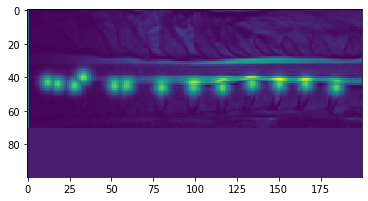

23
(100, 200)
before post_proc


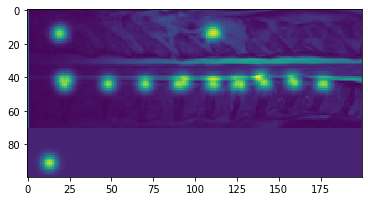

after post_proc
[[22, 44], [13, 91], [21, 42], [19, 14], [48, 44], [23, 42], [48, 44], [48, 44], [70, 44], [70, 44], [90, 44], [91, 44], [110, 44], [93, 43], [111, 14], [125, 44], [110, 44], [110, 14], [126, 44], [111, 44], [127, 44], [141, 43], [139, 41], [159, 43], [176, 44], [158, 42], [177, 44]]
[0]
-2
[0, 1]
[3]
0
[3, 4]
[6]
[8]
-3
[8, 9]
[11]
-1
[11, 12]
[14]
-2
[14, 15]
[17]
[19]


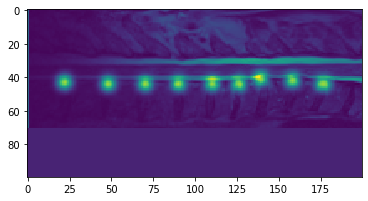

24
(100, 200)
before post_proc


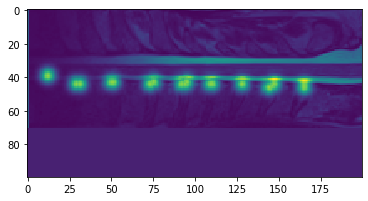

after post_proc
[[12, 39], [31, 44], [29, 44], [51, 43], [50, 43], [73, 44], [75, 43], [92, 44], [75, 43], [94, 44], [110, 44], [95, 43], [109, 44], [128, 44], [144, 46], [128, 44], [146, 45], [165, 46], [147, 44], [165, 46], [165, 45]]
[1]
[3]
[5]
-2
[5, 6]
[8]
-3
[8, 9]
[11]
[13]
[15]
-3
[15, 16]
[18]


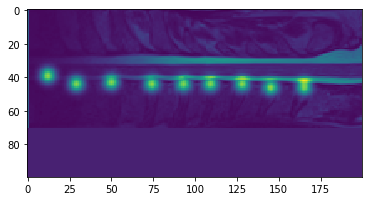

25
(100, 200)
before post_proc


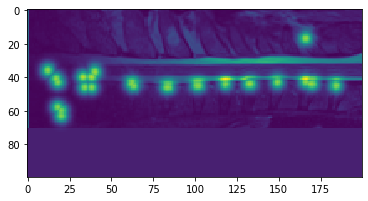

after post_proc
[[20, 63], [20, 60], [18, 58], [17, 41], [12, 36], [18, 43], [38, 46], [34, 46], [33, 40], [40, 37], [38, 40], [62, 44], [63, 45], [83, 46], [62, 44], [84, 46], [83, 46], [101, 45], [101, 45], [118, 44], [102, 45], [118, 44], [132, 44], [118, 44], [132, 44], [133, 44], [166, 43], [149, 43], [170, 44], [166, 17], [184, 45], [169, 44]]
[1]
[3]
-5
[3, 4]
-5
[3, 4, 5]
-7
[3, 4, 5, 6]
[8]
-1
[8, 9]
[11]
-1
[11, 12]
[14]
-1
[14, 15]
[17]
0
[17, 18]
[20]
-1
[20, 21]
[24]
-4
[24, 25]


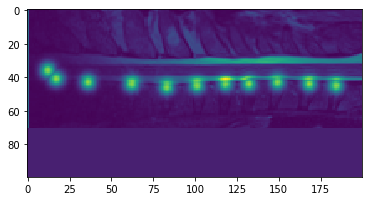

26
(100, 200)
before post_proc


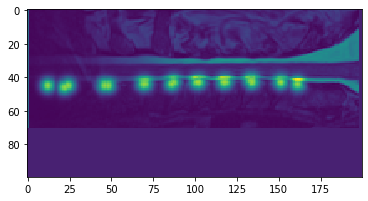

after post_proc
[[22, 46], [12, 45], [24, 45], [46, 45], [48, 45], [48, 45], [69, 44], [86, 44], [70, 44], [86, 44], [102, 43], [87, 43], [118, 43], [102, 43], [117, 43], [101, 43], [117, 43], [133, 42], [134, 43], [151, 43], [134, 42], [151, 43], [151, 43], [161, 44]]
[1]
[3]
-2
[3, 4]
[6]
[8]
-1
[8, 9]
[11]
-1
[11, 12]
[14]
-1
[14, 15]
[17]
-1
[17, 18]
[20]
0
[20, 21]


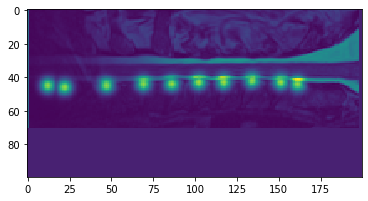

27
(100, 200)
before post_proc


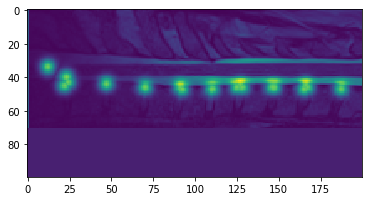

after post_proc
[[22, 45], [12, 34], [24, 43], [23, 40], [47, 44], [47, 44], [70, 46], [70, 46], [92, 47], [92, 47], [110, 47], [91, 46], [110, 47], [125, 46], [128, 46], [146, 46], [127, 45], [147, 46], [165, 47], [146, 46], [167, 46], [187, 47], [166, 45]]
[0]
-2
[0, 1]
[3]
[5]
[7]
-1
[7, 8]
[10]
[12]
-3
[12, 13]
[15]
-1
[15, 16]
[18]
-2
[18, 19]


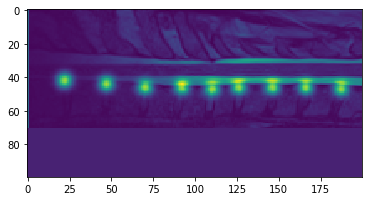

28
(100, 200)
before post_proc


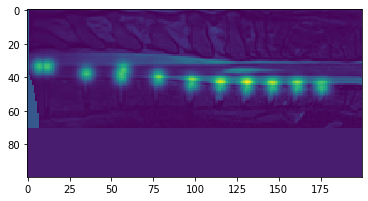

after post_proc
[[12, 34], [7, 34], [11, 34], [56, 40], [56, 38], [35, 38], [57, 36], [78, 40], [78, 41], [98, 43], [115, 45], [98, 44], [115, 45], [131, 46], [115, 44], [146, 46], [131, 45], [146, 45], [131, 44], [161, 46], [146, 45], [176, 46], [161, 46], [175, 46], [161, 45]]
[0]
-5
[0, 1]
[4]
-1
[4, 5]
[7]
[9]
[11]
0
[11, 12]
[14]
0
[14, 15]
[17]
0
[17, 18]
[20]
0
[20, 21]


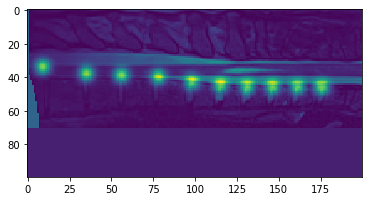

29
(100, 200)
before post_proc


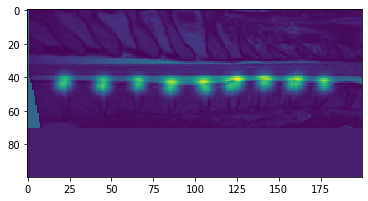

after post_proc
[[21, 44], [22, 43], [44, 45], [21, 44], [45, 45], [66, 44], [45, 44], [66, 44], [85, 46], [66, 44], [85, 45], [106, 46], [86, 45], [105, 45], [121, 45], [105, 45], [124, 44], [141, 43], [125, 43], [158, 44], [141, 43], [160, 44], [142, 43], [160, 44], [177, 44], [161, 43]]
[0]
-1
[0, 1]
[3]
-1
[3, 4]
[6]
0
[6, 7]
[9]
-1
[9, 10]
[12]
-1
[12, 13]
[15]
-4
[15, 16]
[18]
-1
[18, 19]
[21]
-2
[21, 22]
-3
[21, 22, 23]


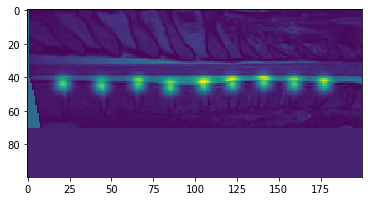

30
(100, 200)
before post_proc


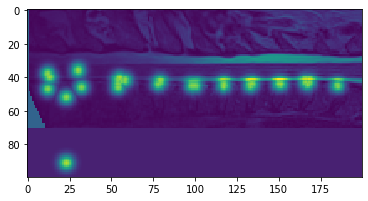

after post_proc
[[23, 52], [12, 38], [12, 47], [32, 46], [13, 40], [23, 91], [30, 36], [55, 41], [54, 46], [54, 44], [58, 42], [54, 42], [56, 42], [79, 43], [98, 45], [78, 44], [100, 45], [117, 45], [99, 45], [117, 44], [133, 45], [117, 44], [134, 44], [150, 44], [133, 44], [150, 44], [166, 43], [167, 44], [151, 44], [185, 45], [168, 43]]
[0]
-1
[0, 1]
[4]
[6]
0
[6, 7]
-1
[6, 7, 8]
-2
[6, 7, 8, 9]
-4
[6, 7, 8, 9, 10]
[12]
[14]
-2
[14, 15]
[17]
0
[17, 18]
[20]
-1
[20, 21]
[23]
-1
[23, 24]
[26]
-2
[26, 27]


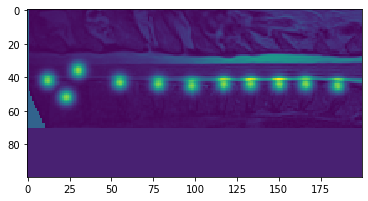

31
(100, 200)
before post_proc


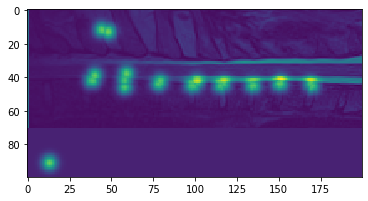

after post_proc
[[13, 91], [39, 42], [40, 39], [44, 12], [38, 42], [58, 46], [59, 38], [48, 13], [58, 42], [79, 43], [98, 45], [78, 44], [99, 45], [115, 45], [99, 45], [117, 44], [101, 43], [134, 45], [117, 44], [135, 45], [134, 45], [151, 44], [150, 44], [170, 45], [151, 43], [169, 44]]
[0]
-2
[0, 1]
[3]
-1
[3, 4]
[6]
[8]
-1
[8, 9]
-3
[8, 9, 10]
[12]
-2
[12, 13]
[15]
-1
[15, 16]
[18]
-1
[18, 19]


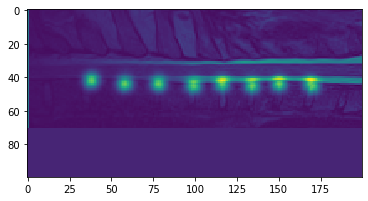

32
(100, 200)
before post_proc


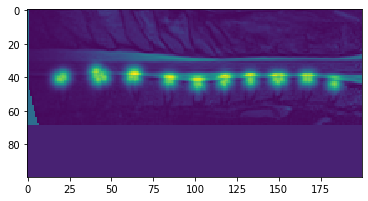

after post_proc
[[19, 41], [20, 41], [45, 40], [21, 40], [42, 41], [41, 39], [41, 37], [62, 40], [44, 39], [63, 38], [84, 42], [64, 40], [64, 38], [85, 42], [102, 44], [84, 42], [102, 44], [117, 43], [101, 44], [118, 42], [118, 42], [133, 41], [133, 42], [148, 41], [149, 42], [133, 41], [149, 42], [166, 41], [168, 41], [151, 41], [183, 44], [168, 41]]
[0]
-2
[0, 1]
[3]
-1
[3, 4]
-3
[3, 4, 5]
-4
[3, 4, 5, 6]
[8]
-2
[8, 9]
-2
[8, 9, 10]
[12]
-1
[12, 13]
[15]
-1
[15, 16]
[18]
-1
[18, 19]
[21]
0
[21, 22]
[24]
-1
[24, 25]
-3
[24, 25, 26]
[28]
-2
[28, 29]


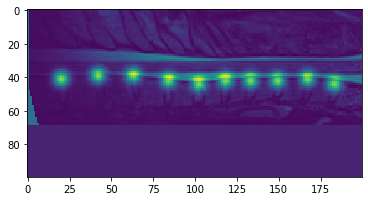

33
(100, 200)
before post_proc


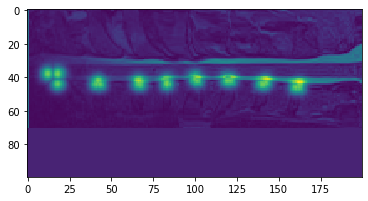

after post_proc
[[18, 44], [12, 38], [18, 38], [41, 44], [42, 43], [67, 44], [43, 44], [41, 44], [66, 44], [83, 44], [66, 43], [83, 44], [83, 43], [100, 41], [100, 41], [119, 42], [101, 42], [120, 42], [141, 44], [121, 42], [140, 44], [160, 46], [142, 43], [162, 46], [162, 45]]
[1]
[3]
-1
[3, 4]
-2
[3, 4, 5]
[7]
-1
[7, 8]
[10]
0
[10, 11]
[13]
-1
[13, 14]
[16]
-2
[16, 17]
[19]
-2
[19, 20]
[22]


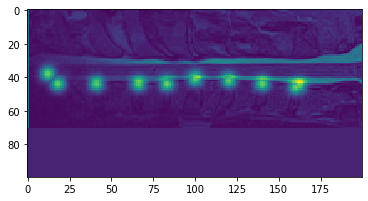

34
(100, 200)
before post_proc


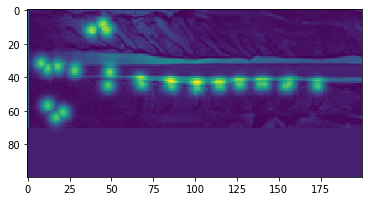

after post_proc
[[17, 64], [21, 61], [12, 57], [12, 35], [18, 34], [8, 32], [28, 36], [46, 11], [45, 9], [48, 45], [49, 37], [47, 12], [38, 12], [68, 44], [86, 45], [67, 42], [85, 44], [101, 46], [85, 44], [101, 46], [115, 45], [114, 45], [101, 45], [127, 44], [114, 45], [126, 44], [139, 44], [126, 44], [154, 45], [139, 44], [155, 45], [141, 44], [173, 45], [156, 44], [173, 45]]
[3]
[5]
[7]
-1
[7, 8]
[10]
0
[10, 11]
[13]
-1
[13, 14]
[16]
-1
[16, 17]
[19]
-2
[19, 20]
[22]
-2
[22, 23]


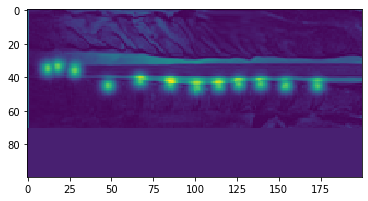

35
(100, 200)
before post_proc


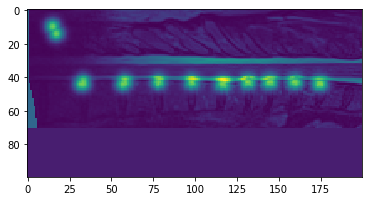

after post_proc
[[17, 14], [15, 10], [33, 44], [32, 44], [33, 43], [58, 43], [57, 44], [78, 43], [78, 43], [98, 43], [117, 44], [98, 43], [116, 44], [116, 44], [131, 43], [145, 43], [132, 43], [144, 43], [131, 43], [159, 43], [144, 43], [175, 44], [160, 43], [174, 44]]
[0]
-1
[0, 1]
[3]
[5]
[7]
[9]
-1
[9, 10]
[12]
-1
[12, 13]
[15]
-1
[15, 16]
[18]


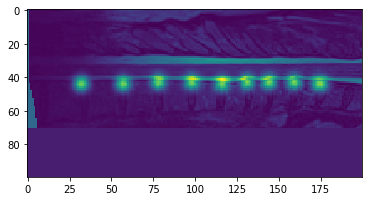

36
(100, 200)
before post_proc


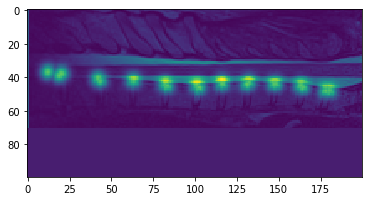

after post_proc
[[19, 39], [12, 37], [20, 38], [43, 42], [42, 41], [63, 42], [63, 42], [83, 45], [83, 45], [102, 46], [82, 44], [101, 45], [116, 44], [101, 45], [116, 43], [131, 44], [116, 43], [147, 44], [131, 44], [147, 44], [132, 43], [164, 46], [148, 44], [178, 48], [164, 46], [180, 48], [163, 45]]
[1]
[3]
[5]
[7]
-1
[7, 8]
[10]
-1
[10, 11]
[13]
0
[13, 14]
[16]
-1
[16, 17]
[19]
-1
[19, 20]
[22]
-1
[22, 23]


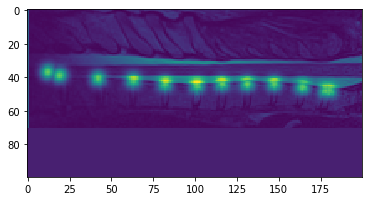

37
(100, 200)
before post_proc


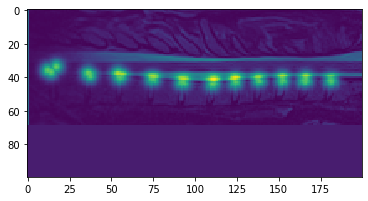

after post_proc
[[12, 36], [17, 34], [37, 39], [14, 37], [56, 39], [36, 38], [54, 38], [75, 41], [55, 40], [75, 41], [93, 43], [74, 41], [93, 43], [110, 44], [92, 43], [110, 44], [124, 43], [124, 43], [111, 43], [138, 42], [138, 42], [124, 42], [152, 42], [138, 42], [165, 42], [152, 42], [166, 42], [152, 41], [181, 42], [166, 41]]
[0]
-5
[0, 1]
[3]
[5]
-2
[5, 6]
[8]
-1
[8, 9]
[11]
-1
[11, 12]
[14]
-1
[14, 15]
[17]
0
[17, 18]
[20]
0
[20, 21]
[23]
0
[23, 24]
[26]
-1
[26, 27]


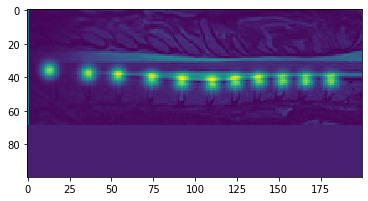

38
(100, 200)
before post_proc


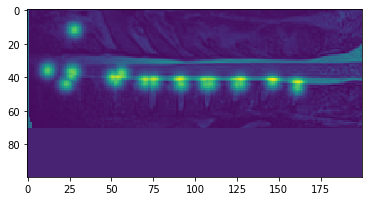

after post_proc
[[23, 44], [26, 37], [12, 36], [27, 37], [26, 39], [28, 12], [51, 40], [56, 38], [54, 40], [70, 43], [53, 42], [51, 41], [75, 43], [91, 44], [75, 43], [106, 44], [92, 44], [108, 44], [91, 43], [125, 44], [109, 44], [127, 44], [127, 43], [161, 46], [146, 43], [161, 46], [161, 45]]
[1]
-3
[1, 2]
-4
[1, 2, 3]
[5]
-2
[5, 6]
-3
[5, 6, 7]
-5
[5, 6, 7, 8]
[11]
[13]
-1
[13, 14]
[16]
-3
[16, 17]
[19]
-2
[19, 20]
[23]


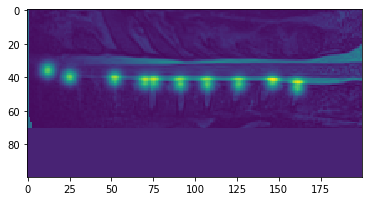

39
(100, 200)
before post_proc


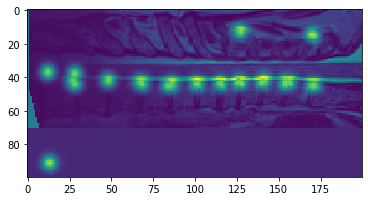

after post_proc
[[12, 37], [13, 91], [28, 44], [28, 38], [27, 42], [48, 42], [68, 43], [48, 42], [67, 43], [84, 45], [68, 44], [85, 45], [101, 44], [86, 44], [115, 44], [101, 44], [115, 44], [101, 44], [127, 43], [115, 44], [126, 43], [140, 43], [127, 43], [127, 13], [154, 44], [140, 43], [154, 43], [141, 42], [170, 45], [156, 43], [171, 45], [170, 15]]
[1]
-1
[1, 2]
[4]
[6]
-1
[6, 7]
[9]
-2
[9, 10]
[12]
0
[12, 13]
[15]
0
[15, 16]
[18]
-1
[18, 19]
[21]
-1
[21, 22]
[24]
-2
[24, 25]


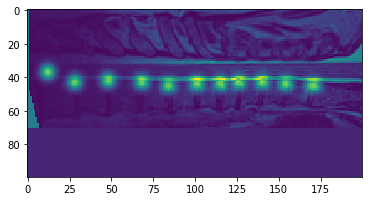

40
(100, 200)
before post_proc


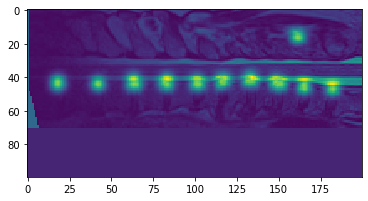

after post_proc
[[18, 44], [18, 43], [42, 44], [42, 44], [64, 44], [63, 44], [83, 44], [63, 42], [82, 43], [102, 44], [83, 42], [101, 44], [117, 42], [101, 43], [116, 42], [116, 43], [132, 42], [148, 43], [134, 42], [149, 44], [133, 41], [165, 46], [150, 44], [165, 45], [151, 44], [161, 16], [182, 47], [165, 45]]
[0]
[2]
[4]
-1
[4, 5]
[7]
-1
[7, 8]
[10]
-1
[10, 11]
[13]
-1
[13, 14]
[16]
-2
[16, 17]
[19]
-2
[19, 20]
-3
[19, 20, 21]
[23]
0
[23, 24]


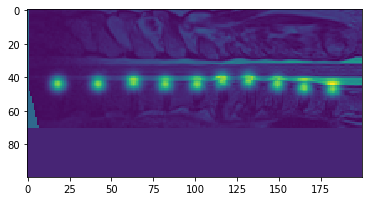

41
(100, 200)
before post_proc


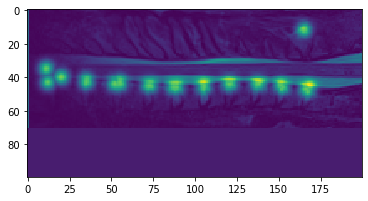

after post_proc
[[12, 43], [11, 35], [20, 40], [35, 43], [52, 44], [35, 42], [55, 44], [73, 45], [55, 43], [87, 46], [73, 45], [88, 46], [72, 45], [105, 46], [89, 46], [105, 45], [105, 45], [120, 44], [138, 44], [121, 44], [137, 44], [121, 44], [152, 46], [137, 44], [166, 47], [152, 46], [167, 47], [151, 45], [167, 48], [168, 46], [165, 12]]
[0]
[3]
[5]
-3
[5, 6]
[8]
-1
[8, 9]
[11]
-2
[11, 12]
[14]
0
[14, 15]
[17]
-1
[17, 18]
[20]
-1
[20, 21]
[23]
-1
[23, 24]
[26]
-1
[26, 27]


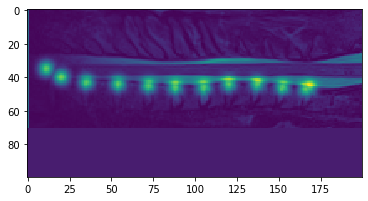

42
(100, 200)
before post_proc


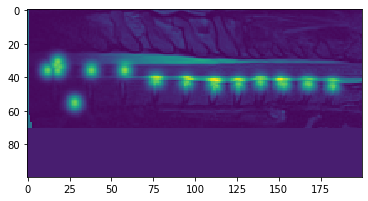

after post_proc
[[12, 36], [19, 34], [28, 55], [18, 36], [17, 33], [18, 31], [28, 56], [38, 36], [58, 36], [77, 42], [76, 42], [76, 42], [95, 43], [112, 45], [95, 43], [126, 44], [112, 44], [126, 44], [111, 44], [126, 44], [139, 43], [152, 44], [139, 43], [153, 44], [167, 44], [151, 43], [182, 45], [168, 44]]
[1]
-2
[1, 2]
[6]
-1
[6, 7]
[9]
[11]
-1
[11, 12]
[14]
0
[14, 15]
[17]
[19]
-2
[19, 20]
[22]


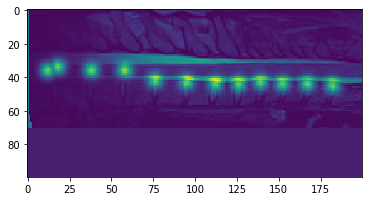

43
(100, 200)
before post_proc


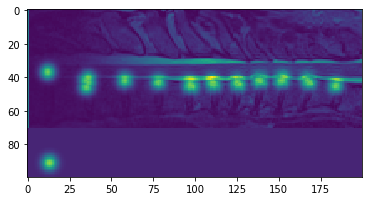

after post_proc
[[12, 37], [13, 91], [35, 42], [35, 46], [36, 43], [36, 41], [58, 42], [58, 42], [78, 43], [98, 45], [78, 43], [97, 45], [97, 44], [110, 43], [111, 44], [125, 43], [126, 44], [111, 44], [126, 44], [138, 42], [139, 42], [152, 41], [152, 42], [167, 42], [151, 42], [184, 45], [168, 43]]
[1]
-1
[1, 2]
-1
[1, 2, 3]
[5]
[7]
[9]
-1
[9, 10]
[12]
-1
[12, 13]
[15]
-1
[15, 16]
[18]
[20]
-1
[20, 21]
[23]


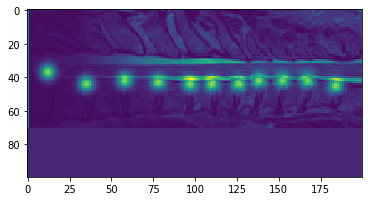

44
(100, 200)
before post_proc


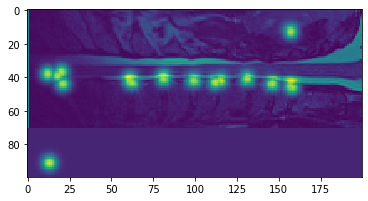

after post_proc
[[21, 44], [18, 39], [12, 38], [20, 37], [13, 91], [18, 39], [62, 43], [61, 42], [81, 41], [61, 41], [81, 41], [99, 42], [81, 40], [112, 43], [99, 42], [115, 42], [131, 41], [146, 44], [131, 41], [158, 46], [146, 44], [131, 41], [157, 45], [146, 44], [157, 45], [157, 13]]
[1]
-2
[1, 2]
-3
[1, 2, 3]
[5]
-1
[5, 6]
[8]
0
[8, 9]
[11]
[13]
[15]
0
[15, 16]
[18]
0
[18, 19]
[21]


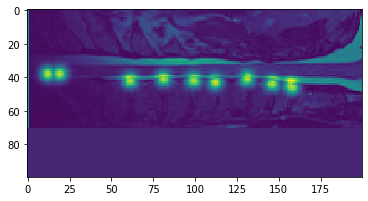

45
(100, 200)
before post_proc


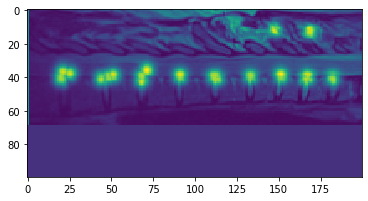

after post_proc
[[20, 41], [21, 37], [20, 40], [25, 38], [44, 41], [51, 39], [48, 40], [68, 42], [71, 36], [68, 40], [91, 40], [91, 40], [113, 41], [91, 39], [112, 40], [133, 40], [111, 40], [133, 40], [151, 40], [133, 40], [166, 41], [151, 40], [147, 12], [167, 41], [151, 39], [182, 41], [167, 40], [168, 13]]
[0]
-1
[0, 1]
-5
[0, 1, 2]
[4]
-7
[4, 5]
[7]
-3
[7, 8]
[10]
0
[10, 11]
[13]
-2
[13, 14]
[16]
0
[16, 17]
[19]
0
[19, 20]
[22]
-1
[22, 23]


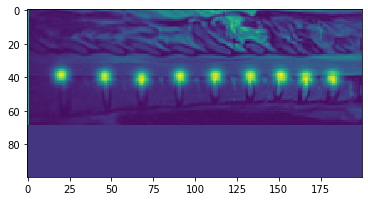

46
(100, 200)
before post_proc


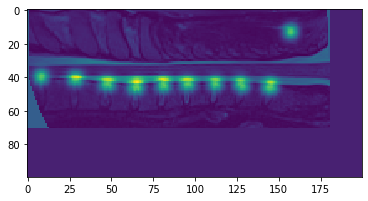

after post_proc
[[8, 40], [29, 41], [47, 44], [28, 41], [48, 44], [64, 46], [48, 44], [65, 46], [81, 45], [65, 45], [95, 44], [81, 44], [96, 44], [81, 44], [112, 44], [96, 44], [127, 44], [112, 44], [127, 44], [112, 44], [144, 46], [128, 45], [145, 46], [145, 45], [157, 13]]
[1]
[3]
-1
[3, 4]
[6]
-1
[6, 7]
[9]
0
[9, 10]
[12]
-1
[12, 13]
[15]
0
[15, 16]
[18]
-1
[18, 19]
[21]


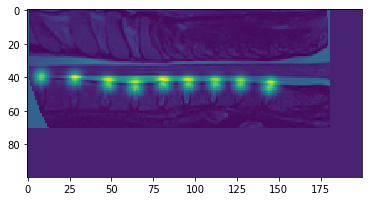

47
(100, 200)
before post_proc


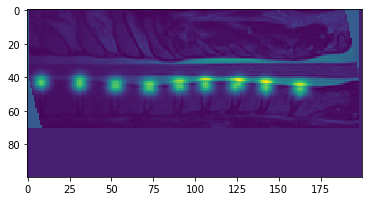

after post_proc
[[8, 43], [31, 44], [31, 44], [53, 45], [31, 43], [53, 45], [72, 46], [52, 45], [73, 46], [72, 46], [90, 45], [90, 45], [106, 45], [91, 45], [124, 45], [106, 44], [126, 44], [142, 46], [126, 44], [142, 45], [163, 47], [142, 46], [163, 47], [162, 47]]
[1]
0
[1, 2]
[4]
-1
[4, 5]
[7]
-1
[7, 8]
[10]
-1
[10, 11]
[13]
[15]
-2
[15, 16]
[18]
0
[18, 19]
[21]


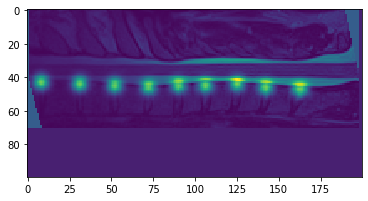

48
(100, 200)
before post_proc


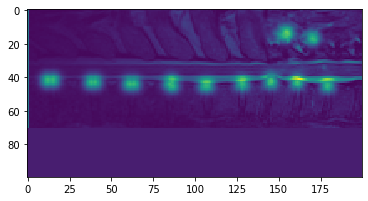

after post_proc
[[12, 42], [15, 42], [40, 43], [38, 43], [63, 44], [61, 44], [86, 45], [85, 44], [106, 45], [86, 43], [107, 45], [107, 45], [128, 44], [128, 44], [128, 44], [145, 42], [145, 43], [153, 15], [161, 43], [145, 42], [154, 15], [161, 43], [155, 14], [179, 45], [161, 43], [170, 17]]
[0]
[2]
[4]
[6]
-1
[6, 7]
[9]
-1
[9, 10]
[12]
0
[12, 13]
[15]
0
[15, 16]
[18]
0
[18, 19]


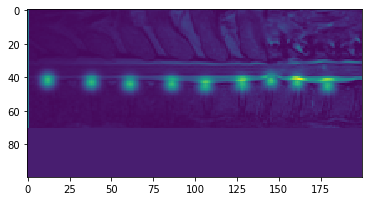

49
(100, 200)
before post_proc


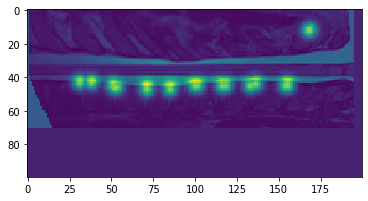

after post_proc
[[38, 43], [31, 43], [52, 46], [53, 46], [71, 47], [51, 45], [85, 47], [71, 46], [85, 47], [85, 47], [100, 45], [116, 45], [101, 45], [118, 45], [101, 45], [133, 45], [118, 45], [154, 45], [136, 44], [155, 45], [155, 44], [168, 12]]
[2]
-2
[2, 3]
[5]
[7]
0
[7, 8]
[10]
-1
[10, 11]
[13]
-2
[13, 14]
[16]
[18]


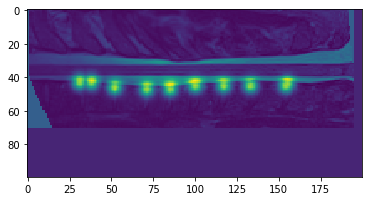

50
(100, 200)
before post_proc


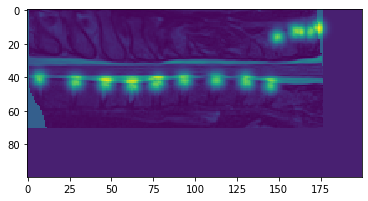

after post_proc
[[7, 41], [29, 43], [47, 44], [28, 43], [46, 44], [63, 45], [46, 44], [63, 45], [76, 44], [62, 45], [77, 44], [78, 43], [93, 42], [94, 42], [112, 42], [94, 42], [113, 42], [130, 42], [113, 42], [145, 45], [130, 43], [145, 45], [131, 43], [145, 45], [149, 16], [161, 13], [160, 13], [169, 13], [163, 13], [173, 11]]
[1]
[3]
-1
[3, 4]
[6]
-1
[6, 7]
[9]
-2
[9, 10]
[12]
-1
[12, 13]
[15]
-1
[15, 16]
[18]
-1
[18, 19]
[21]


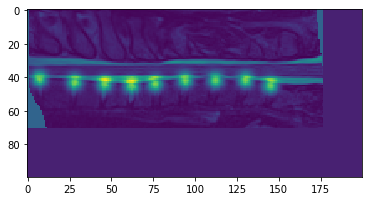

51
(100, 200)
before post_proc


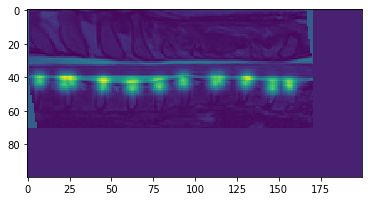

after post_proc
[[22, 44], [22, 42], [7, 42], [26, 43], [45, 45], [25, 42], [45, 45], [63, 46], [45, 44], [63, 46], [78, 45], [62, 46], [79, 45], [79, 45], [93, 43], [93, 42], [112, 43], [112, 42], [130, 43], [114, 42], [146, 45], [130, 43], [146, 45], [131, 42], [146, 46], [156, 45]]
[1]
-3
[1, 2]
-4
[1, 2, 3]
[5]
0
[5, 6]
[8]
-1
[8, 9]
[11]
-1
[11, 12]
[14]
[16]
-2
[16, 17]
[19]
-1
[19, 20]
[22]
0
[22, 23]


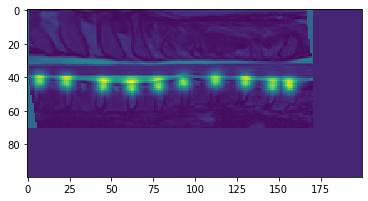

52
(100, 200)
before post_proc


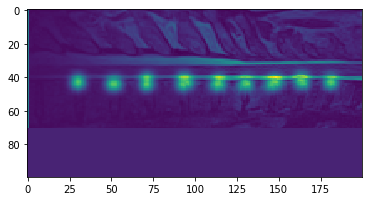

after post_proc
[[30, 43], [30, 43], [52, 44], [51, 44], [71, 44], [71, 44], [71, 42], [93, 44], [93, 42], [95, 43], [113, 44], [94, 42], [114, 43], [130, 44], [114, 44], [146, 44], [130, 44], [147, 43], [164, 43], [148, 43], [163, 42], [181, 43], [164, 42]]
[0]
[2]
[4]
0
[4, 5]
[7]
-1
[7, 8]
-2
[7, 8, 9]
[11]
-1
[11, 12]
[14]
[16]
-2
[16, 17]
[19]
-1
[19, 20]


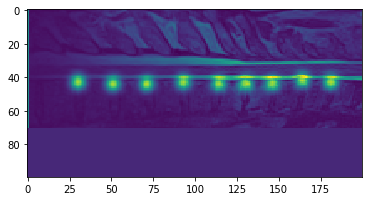

53
(100, 200)
before post_proc


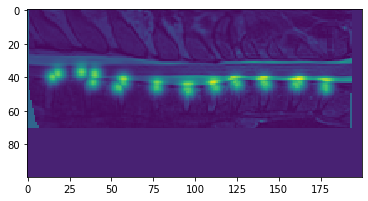

after post_proc
[[15, 40], [18, 38], [32, 37], [54, 46], [39, 43], [40, 38], [57, 42], [77, 46], [57, 43], [77, 45], [95, 47], [77, 45], [96, 48], [96, 47], [112, 46], [112, 46], [125, 44], [111, 45], [125, 44], [142, 44], [124, 43], [142, 44], [160, 44], [141, 43], [178, 45], [161, 44], [178, 46], [162, 43]]
[0]
[3]
[5]
-3
[5, 6]
[8]
0
[8, 9]
[11]
-1
[11, 12]
[14]
-1
[14, 15]
[17]
-1
[17, 18]
[20]
-1
[20, 21]
[23]
-2
[23, 24]


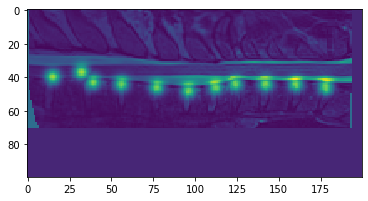

54
(100, 200)
before post_proc


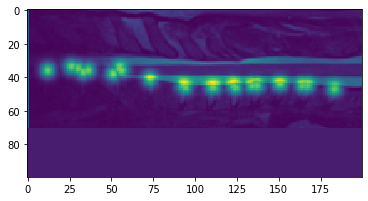

after post_proc
[[12, 36], [36, 36], [30, 35], [26, 34], [33, 37], [51, 38], [55, 35], [73, 41], [56, 36], [94, 46], [94, 46], [111, 46], [93, 45], [124, 46], [110, 46], [124, 46], [134, 45], [137, 45], [123, 45], [137, 45], [150, 44], [164, 45], [150, 44], [167, 45], [151, 44], [183, 47], [167, 45]]
[1]
-6
[1, 2]
[4]
-5
[4, 5]
[8]
-1
[8, 9]
[11]
[13]
-1
[13, 14]
[16]
-3
[16, 17]
[19]
-1
[19, 20]
[22]
-3
[22, 23]


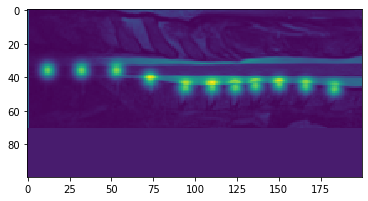

55
(100, 200)
before post_proc


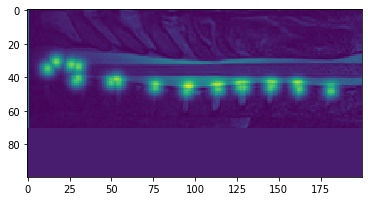

after post_proc
[[12, 35], [26, 33], [17, 31], [29, 42], [30, 34], [30, 41], [50, 43], [53, 42], [76, 46], [54, 43], [76, 46], [95, 48], [76, 46], [95, 48], [113, 47], [96, 47], [114, 47], [127, 46], [113, 47], [129, 46], [129, 46], [145, 45], [145, 46], [162, 47], [146, 45], [162, 46], [181, 48], [161, 45]]
[0]
[2]
-4
[2, 3]
[5]
0
[5, 6]
[8]
-1
[8, 9]
[11]
-1
[11, 12]
[14]
-2
[14, 15]
[17]
-1
[17, 18]
[20]
-1
[20, 21]


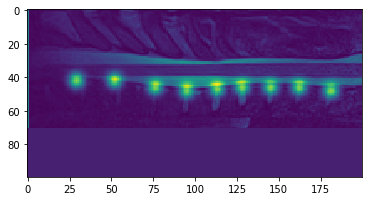

56
(100, 200)
before post_proc


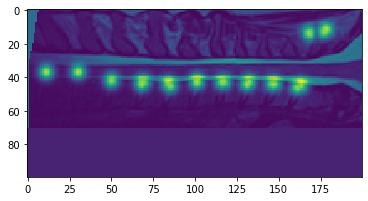

after post_proc
[[11, 37], [30, 37], [50, 42], [68, 44], [50, 42], [69, 43], [85, 45], [68, 43], [85, 45], [84, 44], [101, 43], [116, 43], [101, 43], [117, 43], [101, 42], [131, 44], [117, 43], [146, 44], [131, 44], [147, 44], [132, 43], [161, 46], [146, 44], [161, 46], [178, 12], [163, 45], [168, 14], [177, 13]]
[2]
[4]
-1
[4, 5]
[7]
-1
[7, 8]
[10]
0
[10, 11]
[13]
-1
[13, 14]
[16]
-1
[16, 17]
[19]
-1
[19, 20]
[22]


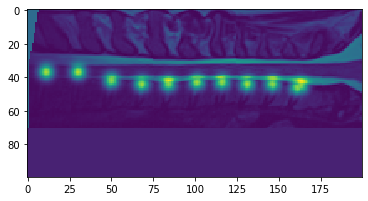

57
(100, 200)
before post_proc


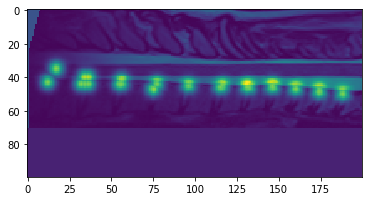

after post_proc
[[12, 43], [17, 35], [32, 44], [34, 44], [36, 44], [36, 40], [34, 40], [55, 44], [75, 47], [56, 44], [56, 42], [77, 44], [96, 45], [77, 44], [96, 45], [115, 46], [96, 45], [115, 46], [132, 46], [116, 45], [146, 46], [131, 46], [146, 46], [131, 45], [160, 47], [146, 45], [174, 49], [160, 47], [188, 50], [174, 48]]
[2]
-2
[2, 3]
-4
[2, 3, 4]
-4
[2, 3, 4, 5]
[7]
-1
[7, 8]
[10]
-2
[10, 11]
[13]
0
[13, 14]
[16]
-1
[16, 17]
[19]
-1
[19, 20]
[22]
0
[22, 23]
[25]
[27]


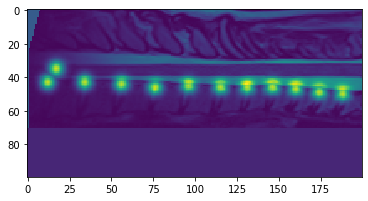

In [94]:
list_str=os.listdir('/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/straight_t2_post_handseg/')
if '.DS_Store' in list_str:
    list_str.remove('.DS_Store')
for i in range (58):
    print(i)
    #path_tmp=path+x
    #mid_check=load_Data_just_check(path_tmp)
    final_function(full[0][i][:,:200,:])

In [42]:
def post_processing(coordinates):
    coordinates_tmp=[]
    print(coordinates)
    coordinates=sorted(coordinates,key= lambda x :x[0])
    width_pos=[x[1] for x in coordinates]
    height_pos=[x[0] for x in coordinates]
    
    mean=np.median(width_pos)
    to_remove=[]
    for i in range (len(width_pos)) :
        if abs(width_pos[i]-mean)>10:
            to_remove.append(i)
    for i in range (len(coordinates)):
        if i in to_remove:
            pass
        else:
            coordinates_tmp.append(coordinates[i])
    
    width_pos_c=[x[1] for x in coordinates_tmp]
    height_pos_c=[x[0] for x in coordinates_tmp]
    new_height=[]
    new_width=[]
    i=0
    while i < len(height_pos_c) :
        j=i
        tmp=[]
      
        while j<len(height_pos_c)-2 and abs(height_pos_c[j]-height_pos_c[j+1])<5 :
            if len(tmp)>0: 
                if abs(height_pos_c[tmp[0]]-height_pos_c[j+1])>20:
                    print('toomuch')
                    break
                else :
                    print(height_pos_c[tmp[0]]-height_pos_c[j+1])
            tmp.append(j)
            j=j+1
            print(tmp)
            
            
        
        if len(tmp)>0:
            
            h=np.round(np.mean(height_pos_c[tmp[0]:tmp[len(tmp)-1]+1]))
            w=np.round(np.mean(width_pos_c[tmp[0]:tmp[len(tmp)-1]+1]))
   
            new_height.append(h)
            new_width.append(w)
            i=i+len(tmp)+1
            
        else:
            h=height_pos_c[i]
            w=width_pos_c[i]
         
            new_height.append(h)
            new_width.append(w)
            i=i+1
    coordinates_tmp=[]        
    for a in range (len(new_height)):
        coordinates_tmp.append([new_height[a],new_width[a]])
    coordinates=sorted(coordinates_tmp,key= lambda x :x[0])    
    width_pos_c=[x[1] for x in coordinates_tmp]
    height_pos_c=[x[0] for x in coordinates_tmp]
    distance=[]
    coord_out=[]
    
    
    
    
    
   # for i in range (len(height_pos_c)-1):
    #    distance.append(height_pos_c[i+1]-height_pos_c[i])
   # dis_mean=np.mean(distance)
   # print(height_pos_c)
  #  for i in range (1,len(height_pos_c)-1) :
   #     print(height_pos_c[i+1]-height_pos_c[i])
  #      if abs(abs((height_pos_c[i+1]-height_pos_c[i]))-abs((height_pos_c[i]-height_pos_c[i-1])))>10:
   #         to_remove.append(i)
   # for i in range (len(coordinates_tmp)):
    #    if i in to_remove:
    #        pass
   #     else:
     #       coord_out.append(coordinates_tmp[i])
    
    
    
    
    return(coordinates_tmp)
    
     
        

In [700]:
t=[[23, 43], [23, 43], [54, 38], [85, 40], [86, 40], [87, 22], [120, 44], [144, 41], [167, 39], [194, 39], [225, 39], [223, 38], [254, 40], [301, 42], [308, 20]]

In [78]:
a=mid_check[0].shape
sorted(a)

[1, 59, 377]

In [43]:
def final_function_2(Image):
    shape_im=Image.shape
    shape_im=sorted(shape_im)
    final,coordinates=infer_straight(Image)
    final=np.zeros(shape_im)
    print('before post_proc')
    for x in coordinates:
    
        train_lbs_tmp_mask=label2MaskMap_2(x,shape_im)
        #plt.imshow(train_lbs_tmp_mask)
        #plt.show()
        for w in range (shape_im[1]):
                    for h in range(shape_im[2]):
                        final[0,w,h]=max(final[0,w,h],train_lbs_tmp_mask[w,h])
    plt.imshow(np.add(final[0,:,:]*1,30*Image[:,:,0]))
    plt.show()
    print('after post_proc')
    final=np.zeros(shape_im)
    coord_out=post_processing(coordinates)
    for x in coord_out:
    
        train_lbs_tmp_mask=label2MaskMap_2(x,shape_im)
        #plt.imshow(train_lbs_tmp_mask)
        #plt.show()
        for w in range (shape_im[1]):
                    for h in range(shape_im[2]):
                        final[0,w,h]=max(final[0,w,h],train_lbs_tmp_mask[w,h])
    plt.imshow(np.add(final[0,:,:,]*1,30*Image[:,:,0]))
    
    plt.show()
    return(coord_out)

In [119]:
import cv2
import PIL
import numpy as np
import matplotlib.pyplot as plt
import imageio
import scipy, scipy.misc, scipy.signal


import sys

def computeTextureWeights(fin, sigma, sharpness):
    dt0_v = np.vstack((np.diff(fin, n=1, axis=0), fin[0,:]-fin[-1,:]))
    dt0_h = np.vstack((np.diff(fin, n=1, axis=1).conj().T, fin[:,0].conj().T-fin[:,-1].conj().T)).conj().T

    gauker_h = scipy.signal.convolve2d(dt0_h, np.ones((1,sigma)), mode='same')
    gauker_v = scipy.signal.convolve2d(dt0_v, np.ones((sigma,1)), mode='same')

    W_h = 1/(np.abs(gauker_h)*np.abs(dt0_h)+sharpness)
    W_v = 1/(np.abs(gauker_v)*np.abs(dt0_v)+sharpness)

    return  W_h, W_v
    
def solveLinearEquation(IN, wx, wy, lamda):
    [r, c] = IN.shape
    k = r * c
    dx =  -lamda * wx.flatten('F')
    dy =  -lamda * wy.flatten('F')
    tempx = np.roll(wx, 1, axis=1)
    tempy = np.roll(wy, 1, axis=0)
    dxa = -lamda *tempx.flatten('F')
    dya = -lamda *tempy.flatten('F')
    tmp = wx[:,-1]
    tempx = np.concatenate((tmp[:,None], np.zeros((r,c-1))), axis=1)
    tmp = wy[-1,:]
    tempy = np.concatenate((tmp[None,:], np.zeros((r-1,c))), axis=0)
    dxd1 = -lamda * tempx.flatten('F')
    dyd1 = -lamda * tempy.flatten('F')
    
    wx[:,-1] = 0
    wy[-1,:] = 0
    dxd2 = -lamda * wx.flatten('F')
    dyd2 = -lamda * wy.flatten('F')
    
    Ax = scipy.sparse.spdiags(np.concatenate((dxd1[:,None], dxd2[:,None]), axis=1).T, np.array([-k+r,-r]), k, k)
    Ay = scipy.sparse.spdiags(np.concatenate((dyd1[None,:], dyd2[None,:]), axis=0), np.array([-r+1,-1]), k, k)
    D = 1 - ( dx + dy + dxa + dya)
    A = ((Ax+Ay) + (Ax+Ay).conj().T + scipy.sparse.spdiags(D, 0, k, k)).T
    
    tin = IN[:,:]
    tout = scipy.sparse.linalg.spsolve(A, tin.flatten('F'))
    OUT = np.reshape(tout, (r, c), order='F')
    
    return OUT
    

def tsmooth(img, lamda=0.01, sigma=3.0, sharpness=0.001):
    I = cv2.normalize(img.astype('float64'), None, 0.0, 1.0, cv2.NORM_MINMAX)
    x = np.copy(I)
    wx, wy = computeTextureWeights(x, sigma, sharpness)
    S = solveLinearEquation(I, wx, wy, lamda)
    return S

def rgb2gm(I):
    
    if (I.shape[2] == 3):
        I = cv2.normalize(I.astype('float64'), None, 0.0, 1.0, cv2.NORM_MINMAX)
        I = np.abs((I[:,:,0]*I[:,:,1]*I[:,:,2]))**(1/3)

    return I

def applyK(I, k, a=-0.3293, b=1.1258):
    f = lambda x: np.exp((1-x**a)*b)
    beta = f(k)
    gamma = k**a
    J = (I**gamma)*beta
    return J

def entropy(X):
    tmp = X * 255
    tmp[tmp > 255] = 255
    tmp[tmp<0] = 0
    tmp = tmp.astype(np.uint8)
    _, counts = np.unique(tmp, return_counts=True)
    pk = np.asarray(counts)
    pk = 1.0*pk / np.sum(pk, axis=0)
    S = -np.sum(pk * np.log2(pk), axis=0)
    return S

def maxEntropyEnhance(I, isBad, a=-0.3293, b=1.1258):
    # Esatimate k
    tmp = cv2.resize(I, (50,50), interpolation=cv2.INTER_AREA)
    tmp[tmp<0] = 0
    tmp = tmp.real
    tmp=np.expand_dims(tmp,axis=-1)
    Y = rgb2gm(tmp)
    
    isBad = isBad * 1
    isBad = scipy.misc.imresize(isBad, (50,50), interp='bicubic', mode='F')
    isBad[isBad<0.5] = 0
    isBad[isBad>=0.5] = 1
    Y = Y[isBad==1]
    
    if Y.size == 0:
       J = I
       return J
    
    f = lambda k: -entropy(applyK(Y, k))
    opt_k = scipy.optimize.fminbound(f, 1, 7)
    
    # Apply k
    J = applyK(I, opt_k, a, b) - 0.01
    return J
    

def Ying_2017_CAIP(img, mu=0.5, a=-0.3293, b=1.1258):
    lamda = 0.5
    sigma = 5
    I = cv2.normalize(img.astype('float64'), None, 0.0, 1.0, cv2.NORM_MINMAX)
    I=np.expand_dims(I,axis=-1)
    print(I.shape)

    # Weight matrix estimation
    t_b = np.max(I, axis=2)
    t_our = cv2.resize(tsmooth(scipy.misc.imresize(t_b, 0.5, interp='bicubic', mode='F'), lamda, sigma), (t_b.shape[1], t_b.shape[0]), interpolation=cv2.INTER_AREA)
    
    # Apply camera model with k(exposure ratio)
    isBad = t_our < 0.5
    J = maxEntropyEnhance(I, isBad)

    # W: Weight Matrix
    t = np.zeros((t_our.shape[0], t_our.shape[1], I.shape[2]))
    for i in range(I.shape[2]):
        t[:,:,i] = t_our
    W = t**mu

    I2 = I*W
    J2 = J*(1-W)

    result = I2 + J2
    result = result * 255
    result[result > 255] = 255
    result[result<0] = 0
    return result.astype(np.uint8)

In [133]:

resultat=Ying_2017_CAIP(normalize(test[:,:60,:]))

(87, 60, 1)


/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/ipykernel_launcher.py:124: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


CLAHE


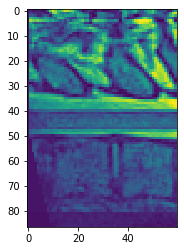

HE


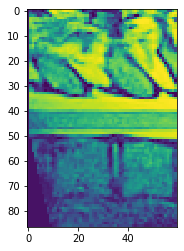

CAIP


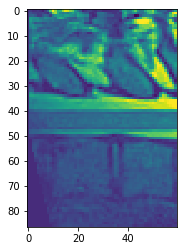

original


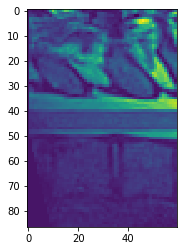

N4


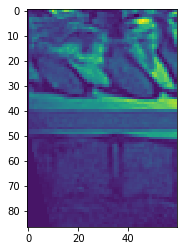

In [134]:
print('CLAHE')
patch=skimage.exposure.equalize_adapthist(normalize(test[:,:60,0]),kernel_size=10,clip_limit=0.02)
plt.imshow(patch)
plt.show()
print('HE')
patch_4=skimage.exposure.equalize_hist(normalize(test[:,:60,0]))
plt.imshow(patch_4)
plt.show()
print('CAIP')
plt.imshow(normalize(resultat[:,:,0]))
plt.show()
print('original')
plt.imshow(normalize(test[:,:60,0]))
plt.show()
print('N4')

plt.imshow(normalize(n4[0][0,:,:60]))
plt.show()

In [125]:
n4=load_Data_just_check('N4_output3.nii.gz')

(87, 241)
